In [7]:
#gradinet
import numpy as np
def gradient_descent(x, y):
    mcur=bcur=0
    inter=1000
    n=len(x)
    lr=0.001
    for i in range(inter):
        ypred = mcur * x + bcur
        cost = (1/n) * sum([val** 2 for val in (y - ypred)])
        md = - (2/n) * sum(x * (y - ypred))
        bd = - (2/n) * sum(y - ypred)
        mcur = mcur - lr * md
        bcur = bcur - lr * bd
        print("m{},b{},cost{},it{}".format(mcur,bcur,cost,lr))   
x=np.array([1, 2, 3, 4, 5])
y=np.array([5, 6, 7, 8, 13])
gradient_descent(x, y)

m0.054,b0.015600000000000001,cost68.60000000000001,it0.001
m0.1067184,b0.0308448,cost65.47801376,it0.001
m0.15818552640000003,b0.0457428,cost62.50200615379713,it0.001
m0.20843098801920001,b0.060302201241600004,cost59.66515065992079,it0.001
m0.25748369307532804,b0.0745310109110016,cost56.96093999180919,it0.001
m0.3053718657622048,b0.08843704673072764,cost54.38317116913291,it0.001
m0.3521230624350519,b0.10202794144269295,cost51.925931287242,it0.001
m0.39776418741282465,b0.11531114718519725,cost49.583583952089725,it0.001
m0.4423215084066313,b0.1282939397663499,cost47.35075634951215,it0.001
m0.48582067158308734,b0.1409834228363774,cost45.222326919199205,it0.001
m0.5282867162712411,b0.15338653196120614,cost43.19341360507902,it0.001
m0.5697440893215066,b0.16551003859965627,cost41.25936265516052,it0.001
m0.6102166591248355,b0.17736055398652792,cost39.415737945139156,it0.001
m0.64972772930017,b0.18894453292380586,cost37.65831080127282,it0.001
m0.6883000520580234,b0.20026827748215723,cost35.983

In [ ]:
Classifiers
Adaboost
Extra Trees
K-Nearest Neighbor
Logistic Regression
Naive Bayes
Random Forests
Support Vector Machines
XGBoost
Evaluation Metrics
Accuracy
F1-score
Precision
Recall
Cohen's kappa statistic
Matthews correlation coefficient

In [ ]:
#data handling      lg
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import ComplementNB
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score,f1_score,precision_score, recall_score
from sklearn.metrics import cohen_kappa_score,matthews_corrcoef

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectPercentile, chi2
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
num_features = ["SLC", "Eng", "Math", "Physics", "Chemistry", "Plus_Two", "Eng1", "Math2","Phy_Acc", "Che_Eco", "Mixed"]
cat_features = ['School_From', 'Parent_Education']
target = "GPAA"
X = df.drop(target, axis=1)
y = df[target]
num_imputer = SimpleImputer(strategy="mean")
X_num = num_imputer.fit_transform(X[num_features])
num_scaler = StandardScaler()
X_num_scaled = num_scaler.fit_transform(X_num)
df_num = pd.DataFrame(X_num_scaled, columns=num_features)
cat_encoder = OneHotEncoder(handle_unknown="ignore", sparse=False)
X_cat = cat_encoder.fit_transform(X[cat_features])
cat_feature_names = cat_encoder.get_feature_names_out(cat_features)
df_cat = pd.DataFrame(X_cat, columns=cat_feature_names)
cat_imputer = SimpleImputer(strategy="most_frequent")
X_cat_imputed = cat_imputer.fit_transform(X[cat_features])
X_cat_imputed_encoded = cat_encoder.transform(X_cat_imputed)
df_cat_imputed_encoded = pd.DataFrame(X_cat_imputed_encoded, columns=cat_feature_names)
cat_selector = SelectPercentile(chi2, percentile=50)
X_cat_selected = cat_selector.fit_transform(X_cat_imputed_encoded, y)
selected_cat_feature_names = [cat_feature_names[i] for i in cat_selector.get_support(indices=True)]
df_cat_selected = pd.DataFrame(X_cat_selected, columns=selected_cat_feature_names)
df_transformed = pd.concat([df_num, df_cat_imputed_encoded, df_cat_selected], axis=1)
df_transformed[target] = y
df_transformed = df_transformed.loc[:, ~df_transformed.columns.duplicated()]
dff = df_transformed.copy()
dff["Pass"] = df["Pass"]
dff["GPAA"] = df["GPAA"]
dff["GPAM"] = df["GPAM"]
dff["GPA"] = df["GPA"]
dff.to_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", index=True)
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df=df.drop(['Unnamed: 0'], axis=1)
df.head()

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectPercentile, chi2
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.dropna(subset=["GPAA","GPA","GPAM","Pass"], inplace=True)
num_features = ["SLC", "Eng", "Math", "Physics", "Chemistry", "Plus_Two", "Eng1", "Math2","Phy_Acc", "Che_Eco", "Mixed"]
cat_features = ['School_From', 'Parent_Education']
target = "GPAA"
X = df.drop(target, axis=1)
y = df[target]
num_imputer = SimpleImputer(strategy="mean")
X_num = num_imputer.fit_transform(X[num_features])
num_scaler = StandardScaler()
X_num_scaled = num_scaler.fit_transform(X_num)
df_num = pd.DataFrame(X_num_scaled, columns=num_features)
cat_encoder = OneHotEncoder(handle_unknown="ignore", sparse=False)
X_cat = cat_encoder.fit_transform(X[cat_features])
cat_feature_names = cat_encoder.get_feature_names_out(cat_features)
df_cat = pd.DataFrame(X_cat, columns=cat_feature_names)
cat_imputer = SimpleImputer(strategy="most_frequent")
X_cat_imputed = cat_imputer.fit_transform(X[cat_features])
X_cat_imputed_encoded = cat_encoder.transform(X_cat_imputed)
df_cat_imputed_encoded = pd.DataFrame(X_cat_imputed_encoded, columns=cat_feature_names)
cat_selector = SelectPercentile(chi2, percentile=50)
X_cat_selected = cat_selector.fit_transform(X_cat_imputed_encoded, y)
selected_cat_feature_names = [cat_feature_names[i] for i in cat_selector.get_support(indices=True)]
df_cat_selected = pd.DataFrame(X_cat_selected, columns=selected_cat_feature_names)
df_transformed = pd.concat([df_num, df_cat_imputed_encoded, df_cat_selected], axis=1)
df_transformed[target] = y
df_transformed = df_transformed.loc[:, ~df_transformed.columns.duplicated()]
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df_transformed["Pass"]=df["Pass"] 
df_transformed["GPAA"]=df["GPAA"] 
df_transformed["GPAM"]=df["GPAM"] 
df_transformed["GPA"]=df["GPA"]
df_transformed.to_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv", index=True)
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv", encoding='latin1')
df=df.drop(['Unnamed: 0'], axis=1)
df.columns

In [ ]:
import pandas as pd     # feature importance% and density plots of features
import klib
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
columns_to_drop = ['Phy_Acc', 'Che_Eco', 'Mixed', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC','GPA','GPAM']
X= df.drop(columns_to_drop, axis=1)
X=pd.DataFrame(X)
klib.corr_plot(X, target='Pass')
for column in X.columns:
    klib.dist_plot(X[column].values)

In [ ]:
import pandas as pd
import klib
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
columns_to_drop = ['Unnamed: 0', 'Phy_Acc', 'Che_Eco', 'Mixed', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC','GPA', 'GPAM','Pass']
X = df.drop(columns_to_drop, axis=1)
target_categories = ['A', 'A-', 'B+', 'B', 'B-', 'C+', 'C', 'C-']
for column in X.columns:
    plt.figure(figsize=(8, 6))
    for i, category in enumerate(target_categories):
        data = X[X['GPAA'] == category][column].values
        sns.histplot(data, kde=True, color=plt.cm.tab10(i), label=category)
    plt.title(f'Distribution of {column} for different GPAA categories')
    plt.xlabel(column)
    plt.ylabel('Density')
    plt.legend(loc='upper right')
    plt.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

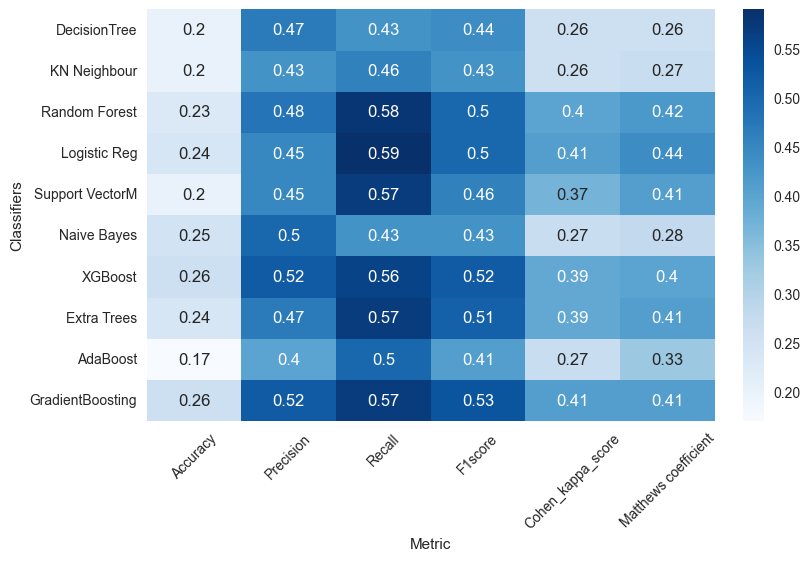

In [18]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, matthews_corrcoef
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
            'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC','Pass','GPAM', 'GPA'], axis=1)
X = df.iloc[:, 0:11]
y = df['GPAA']  # Assuming 'GPAAA' is the column name for the target variable
label_encoder = LabelEncoder()
label_encoder.fit(y)
y_encoded = label_encoder.transform(y)
labels = label_encoder.classes_
classes = np.unique(y_encoded)
xtrain, xtest, ytrain, ytest = train_test_split(X, y_encoded, test_size=0.2, random_state=20)
def evaluate(model, xtest, ytest, name):
    ypred = model.predict(xtest)
    accuracy = np.round(balanced_accuracy_score(ytest, ypred), 2)
    precision = np.round(precision_score(ytest, ypred, average='weighted'), 2)
    recall = np.round(recall_score(ytest, ypred, average='weighted'), 2)
    f1score = np.round(f1_score(ytest, ypred, average='weighted'), 2)
    cohenkappa_score = np.round(cohen_kappa_score(ytest, ypred), 2)
    matthews_corrcoef_ = np.round(matthews_corrcoef(ytest, ypred), 2)
    return accuracy, precision, recall, f1score, cohenkappa_score, matthews_corrcoef_
def fit_data(xtrain, ytrain, xtest, ytest):
    ADB = AdaBoostClassifier().fit(xtrain, ytrain)
    XGB = XGBClassifier(num_class=len(classes), eval_metric='mlogloss', use_label_encoder=False).fit(xtrain, ytrain)
    RF = RandomForestClassifier(max_features=0.2).fit(xtrain, ytrain)
    SVM = SVC().fit(xtrain, ytrain)
    KNN = KNeighborsClassifier().fit(xtrain, ytrain)
    NB = GaussianNB().fit(xtrain, ytrain)
    ETC = ExtraTreesClassifier().fit(xtrain, ytrain)
    LOGREG = LogisticRegression(C=50, multi_class='multinomial', solver='lbfgs', max_iter=3000).fit(xtrain, ytrain)
    DecisionTree = DecisionTreeClassifier(random_state=0).fit(xtrain, ytrain)
    gbc = GradientBoostingClassifier().fit(xtrain, ytrain)
    performance_list = []
    performance_metrics = ['Accuracy', 'Precision', 'Recall', 'F1score', 'Cohen_kappa_score', 'Matthews coefficient']
    indices = []
    model_dict={'DecisionTree':DecisionTree,'KN Neighbour':KNN,'Random Forest':RF,'Logistic Reg':LOGREG,'Support VectorM':SVM,'Naive Bayes':NB,
            'XGBoost':XGB,'Extra Trees':ETC,'AdaBoost':ADB,'GradientBoosting':gbc}
    #model_dict={'Random Forest':RF,'Logistic Reg':LOGREG,'Support VectorM':SVM,'XGBoost':XGB,'GradientBoosting':gbc}
    for name,model in model_dict.items():
        performance=evaluate(model,xtest,ytest,name)
        performance_list.append(performance)
        indices.append(name)        
    performance_frame=pd.DataFrame(performance_list,columns=performance_metrics,index=indices)
    return performance_frame
result = fit_data(xtrain, ytrain, xtest, ytest)
result[result['F1score']>=0.10] #.50 needs
plt.rcParams['figure.constrained_layout.use'] = True
sns.heatmap(result,annot=True,cmap='Blues')
plt.xlabel('Metric')
plt.ylabel('Classifiers')
plt.xticks(rotation=45)
plt.show()

In [26]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, matthews_corrcoef
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
            'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC','GPAM', 'GPA'], axis=1)
X = df.iloc[:, 0:11]
y = df['Pass']  
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, random_state=20)
def evaluate(model, xtest, ytest, name):
    ypred = model.predict(xtest)
    accuracy = np.round(balanced_accuracy_score(ytest, ypred), 2)
    precision = np.round(precision_score(ytest, ypred), 2)
    recall = np.round(recall_score(ytest, ypred), 2)
    f1score = np.round(f1_score(ytest, ypred), 2)
    cohenkappa_score = np.round(cohen_kappa_score(ytest, ypred), 2)
    matthews_corrcoef_ = np.round(matthews_corrcoef(ytest, ypred), 2)
    return accuracy, precision, recall, f1score, cohenkappa_score, matthews_corrcoef_
def fit_data(xtrain, ytrain, xtest, ytest):
    ADB = AdaBoostClassifier().fit(xtrain, ytrain)
    XGB = XGBClassifier().fit(xtrain, ytrain)
    RF = RandomForestClassifier().fit(xtrain, ytrain)
    SVM = SVC().fit(xtrain, ytrain)
    KNN = KNeighborsClassifier().fit(xtrain, ytrain)
    NB = GaussianNB().fit(xtrain, ytrain)
    ETC = ExtraTreesClassifier().fit(xtrain, ytrain)
    LOGREG = LogisticRegression().fit(xtrain, ytrain)
    DecisionTree = DecisionTreeClassifier().fit(xtrain, ytrain)
    performance_list = []
    performance_metrics = ['Accuracy', 'Precision', 'Recall', 'F1score', 'Cohen_kappa_score', 'Matthews coefficient']
    indices = []
    model_dict = {'DecisionTree': DecisionTree, 'KN Neighbour': KNN, 'Random Forest': RF, 'Logistic Reg': LOGREG,
                  'Support VectorM': SVM, 'Naive Bayes': NB, 'XGBoost': XGB, 'Extra Trees': ETC, 'AdaBoost': ADB}
    for name, model in model_dict.items():
        performance = evaluate(model, xtest, ytest, name)
        performance_list.append(performance)
        indices.append(name)        
    performance_frame = pd.DataFrame(performance_list, columns=performance_metrics, index=indices)
    return performance_frame
result = fit_data(xtrain, ytrain, xtest, ytest)
result[result['F1score'] >= 0.1]

,Accuracy,Precision,Recall,F1score,Cohen_kappa_score,Matthews coefficient
DecisionTree,0.69,0.79,0.83,0.81,0.40,0.40
KN Neighbour,0.68,0.76,0.95,0.85,0.40,0.44
Random Forest,0.75,0.82,0.93,0.87,0.54,0.55
Logistic Reg,0.75,0.81,0.97,0.88,0.56,0.59
Support VectorM,0.74,0.80,0.99,0.88,0.55,0.60
Naive Bayes,0.69,0.77,0.97,0.86,0.43,0.49
XGBoost,0.72,0.80,0.90,0.85,0.48,0.49
Extra Trees,0.70,0.78,0.95,0.85,0.45,0.48
AdaBoost,0.71,0.80,0.90,0.84,0.46,0.47


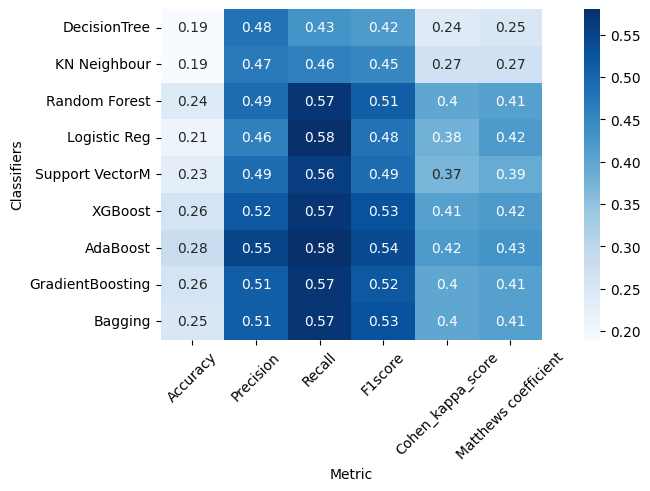

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.constrained_layout.use'] = True
sns.heatmap(result, annot=True, cmap='Blues')
plt.xlabel('Metric')
plt.ylabel('Classifiers')
plt.xticks(rotation=45)
plt.show()

Random Forest: Accuracy = 0.7692
Support Vector Machine: Accuracy = 0.7692
Gradient Boosting: Accuracy = 0.7692
AdaBoost: Accuracy = 0.7622
Naive Bayes: Accuracy = 0.7622
Decision Tree: Accuracy = 0.7552
Logistic Regression: Accuracy = 0.7552
K-Nearest Neighbors: Accuracy = 0.7413


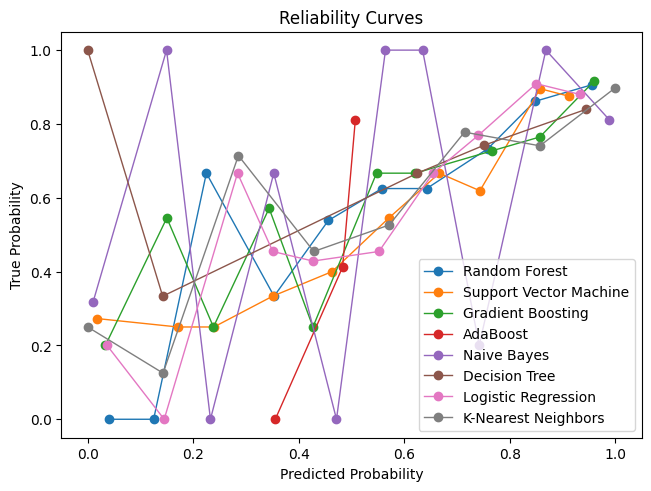

In [11]:
import warnings
import pandas as pd
import numpy as np
import scikitplot as skplt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X = df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'], axis=1)
y = df['Pass']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
classifiers = {
    'Random Forest': (RandomForestClassifier(), {'n_estimators': [100, 200, 300]}),
    'Support Vector Machine': (SVC(probability=True), {'C': [0.1, 1, 10]}),
    'AdaBoost': (AdaBoostClassifier(), {'n_estimators': [50, 100, 200]}),
    'K-Nearest Neighbors': (KNeighborsClassifier(), {'n_neighbors': [3, 5, 7]}),
    'Decision Tree': (DecisionTreeClassifier(), {'max_depth': [3, 5, 7]}),
    'Gradient Boosting': (GradientBoostingClassifier(), {'n_estimators': [50, 100, 200]}),
    'Logistic Regression': (LogisticRegression(), {'C': [0.1, 1, 10]}),
    'Naive Bayes': (GaussianNB(), {}) }
accuracy_scores = {}
for clf_name, (clf, param_grid) in classifiers.items():
    grid_search = GridSearchCV(clf, param_grid, cv=2)
    grid_search.fit(X_train, y_train)
    best_clf = grid_search.best_estimator_
    y_pred = best_clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_scores[clf_name] = accuracy
sorted_scores = sorted(accuracy_scores.items(), key=lambda x: x[1], reverse=True)
for clf_name, accuracy in sorted_scores:
    print(f"{clf_name}: Accuracy = {accuracy:.4f}")
    clf, param_grid = classifiers[clf_name]
    best_clf = GridSearchCV(clf, param_grid, cv=2).fit(X_train, y_train)
    probs = best_clf.predict_proba(X_test)
    probs = probs[:, 1]  # Only keep probabilities for positive class
    true_probs, pred_probs = calibration_curve(y_test, probs, n_bins=10)
    plt.plot(pred_probs, true_probs, marker='o', linewidth=1, label=clf_name)
plt.xlabel('Predicted Probability')
plt.ylabel('True Probability')
plt.title('Reliability Curves')
plt.legend()
plt.show()

In [ ]:
#save the scores to an output csv file
result.to_csv('scores.csv')

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAM'].values
trainX, testX, trainy, testy = train_test_split(X, Y, test_size=0.2, random_state=42)
model = Sequential()
model.add(Dense(10, input_shape=(X.shape[1],), activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(5, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()
history = model.fit(trainX, trainy, validation_data=(testX, testy), epochs=10, batch_size=32, verbose=1)
train_loss, train_acc = model.evaluate(trainX, trainy, verbose=0)
test_loss, test_acc = model.evaluate(testX, testy, verbose=0)
print('Train Accuracy:', train_acc)
print('Test Accuracy:', test_acc)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'], loc='upper left')
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Test'], loc='upper right')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAM'].values
trainX, testX, trainy, testy = train_test_split(X, Y, test_size=0.2, random_state=42)
model = Sequential()
model.add(Dense(5, input_dim=trainX.shape[1], activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='linear'))
model.compile(loss='mean_squared_error', optimizer='adam')
history = model.fit(trainX, trainy, validation_data=(testX, testy), epochs=100, batch_size=32, verbose=0)
train_loss = model.evaluate(trainX, trainy, verbose=0)
test_loss = model.evaluate(testX, testy, verbose=0)
print(f"Training Loss: {train_loss:.4f}")
print(f"Test Loss: {test_loss:.4f}")
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from keras.utils.vis_utils import plot_model
model = Sequential()
model.add(Dense(5, input_dim=trainX.shape[1], activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='linear'))
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from ann_visualizer.visualize import ann_viz
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values
trainX, testX, trainy, testy = train_test_split(X, Y, test_size=0.2, random_state=42)
model = Sequential()
model.add(Dense(5, input_dim=trainX.shape[1], activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='linear'))
ann_viz(model, view=True, filename="example", title="Example ANN")

In [ ]:
X.columns

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense, Dropout
from ann_visualizer.visualize import ann_viz
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
input_features = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
output_feature = 'GPAA'
output_mapping = {'A': 0, 'A-': 1, 'B+': 2, 'B': 3, 'B-': 4, 'C+': 5, 'C': 6, 'C-': 7}
X = pd.get_dummies(df[input_features], drop_first=True)
Y = df[output_feature].map(output_mapping)
trainX, testX, trainY, testY = train_test_split(X, Y, test_size=0.2, random_state=42)
model = Sequential()
model.add(Dense(5, input_dim=trainX.shape[1], activation='relu'))
model.add(Dense(3, input_dim=trainX.shape[1], activation='relu'))
model.add(Dense(1, input_dim=trainX.shape[1], activation='relu'))
model.add(Dense(len(output_mapping), activation='softmax'))
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history = model.fit(trainX, trainY, epochs=10, batch_size=32, validation_data=(testX, testY), verbose=0)
# Plot the model architecture
plot_model(model, to_file='ann_structure.png', show_shapes=True, show_layer_names=True)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()
ann_viz(model, view=True, filename="example", title="Example ANN")

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
#Baseline with Zeros Classification
import pandas as pd
import numpy as np
from sklearn.metrics import roc_auc_score,accuracy_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df.drop(['Unnamed: 0'], axis=1)
X = df.drop(['GPAA', 'GPA','GPAM','Pass'], axis=1).values
Y=df['Pass'].values
print("Baseline accuracy score:",accuracy_score(Y,np.zeros_like(Y)))
print("Baseline AUCROC Score:",roc_auc_score(Y,np.zeros_like(Y),multi_class="ovr"))

In [ ]:
#pip3 install scikit-learn scipy matplotlib numpy
#install -c conda-forge scikit-plot
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
#!pip install scikit-plot
import scikitplot as skplt
import matplotlib.pyplot as plt
import numpy
from sklearn import metrics
#df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1') df = df.drop(['Unnamed: 0'], axis=1)
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X = df.drop(['GPAA', 'GPA','GPAM','Pass','School_From','Parent_Education'], axis=1).values
Y=df['Pass'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2,random_state=0)
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
confusion_matrix = metrics.confusion_matrix(y_test, y_pred > 0.5)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
import seaborn as sns
cm_display.plot()
plt.show()

In [ ]:
from yellowbrick.classifier import ROCAUC  ##AUC
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X = df.drop(['GPAA', 'GPA', 'GPAM', 'Pass', 'School_From', 'Parent_Education'], axis=1).values
y = df['GPAA'].values  #df['Pass'].values
model = LogisticRegression()
visualizer = ROCAUC(model)
visualizer.fit(X, y)
visualizer.score(X, y)
visualizer.show()

In [ ]:
import seaborn as sns
sns.heatmap(confusion_matrix/np.sum(confusion_matrix), annot=True,fmt='.2%', cmap='Blues')

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
y_pred = model.predict(X_test)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1score = f1_score(y_test, y_pred)
print(f"Precision = {precision}")
print(f"Recall = {recall}")
print(f"F1 Score = {f1score}")
print(metrics.classification_report(y_test, y_pred))

In [ ]:
from sklearn.metrics import confusion_matrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df.drop(['Unnamed: 0'], axis=1)
X = df.drop(['GPAA', 'GPA','GPAM','Pass'], axis=1).values
Y=df['Pass'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2,random_state=0)
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
confusion_matrix = metrics.confusion_matrix(y_test, y_pred > 0.5)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                confusion_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     confusion_matrix.flatten()/np.sum(confusion_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(confusion_matrix, annot=labels, fmt='', cmap='Blues')
print(confusion_matrix)
print(metrics.classification_report(y_test, y_pred> 0.5))

In [ ]:
#logistic  only passed #vot
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn import metrics
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=0)
logreg = logisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()
accuracy = logreg.score(X_test, y_test)
print(f"Accuracy of Logistic Regression: {accuracy}")
print(metrics.classification_report(y_test, y_pred))
score = cross_val_score(logreg, X, Y, cv=2)
print("Cross Validation Score:")
print(score.mean())
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
fig, ax = plt.subplots(figsize=(8, 5))
cmp = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred),display_labels=classes,)
cmp.plot(ax=ax)
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from yellowbrick.classifier import ROCAUC
from yellowbrick.datasets import load_spam
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
             'Parent_Education_Bachelor', 'Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=0)
visualizer = roc_auc(LogisticRegression(), X, Y)
visualizer.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from yellowbrick.classifier import DiscriminationThreshold
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private','Parent_Education_Bachelor', 'Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo','Parent_Education_SLC', 'GPAA', 'Pass','Mixed', 'GPAM', 'GPA'], axis=1)
Y = df['Pass']
model = LogisticRegression(multi_class="auto", solver="liblinear")
visualizer = DiscriminationThreshold(model)
visualizer.fit(X, Y)
visualizer.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from yellowbrick.classifier import DiscriminationThreshold
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df['GPAM_binary'] = df['GPAM'].apply(lambda x: 1 if x >= 0.01 else 0)
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private','Parent_Education_Bachelor', 'Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo','Parent_Education_SLC', 'GPAA', 'Pass','Mixed', 'GPAM', 'GPA', 'GPAM_binary'], axis=1)
Y = df['GPAM_binary']
model = LogisticRegression(solver="liblinear")
visualizer = DiscriminationThreshold(model)
visualizer.fit(X, Y)
visualizer.show()

In [ ]:
import pandas as pd     #AB
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn import metrics
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master',
'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.3, random_state=0)
gbc = GradientBoostingClassifier().fit(X_train, y_train)
y_pred = gbc.predict(X_test)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = df['GPAA'].unique()
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()
nn_accuracy = gbc.score(X_test, y_test)
print(f"Accuracy of GBC is: {nn_accuracy}")
print(metrics.classification_report(y_test, y_pred))
score = cross_val_score(gbc, X, Y, cv=2)
print("Cross val", score.mean())
print(X_train.shape)
print(y_test.shape)
visualizer = ROCAUC(gbc)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['Pass'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=0)
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_prob)
auc = round(metrics.roc_auc_score(y_test, y_pred_prob), 4)
plt.plot(fpr, tpr, label="Logistic Regression, AUC=" + str(auc))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values  # Categorical variables ['A',"A-","B+","B","B-","C+","C","C-"]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=0)
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred_prob = model.predict_proba(X_test)
n_classes = len(model.classes_)
fpr = dict()
tpr = dict()
auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = metrics.roc_curve(y_test, y_pred_prob[:, i], pos_label=model.classes_[i])
    auc[i] = round(metrics.auc(fpr[i], tpr[i]), 4)
plt.figure()
plt.plot(fpr[0], tpr[0], label="Class A, AUC=" + str(auc[0]))
plt.plot(fpr[1], tpr[1], label="Class A-, AUC=" + str(auc[1]))
plt.plot(fpr[2], tpr[2], label="Class B+, AUC=" + str(auc[2]))
plt.plot(fpr[3], tpr[3], label="Class B, AUC=" + str(auc[3]))
plt.plot(fpr[4], tpr[4], label="Class B-, AUC=" + str(auc[4]))
plt.plot(fpr[5], tpr[5], label="Class C+, AUC=" + str(auc[5]))
plt.plot(fpr[6], tpr[6], label="Class C, AUC=" + str(auc[6]))
plt.plot(fpr[7], tpr[7], label="Class C-, AUC=" + str(auc[7]))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAM'].values
model = linear_model.LinearRegression().fit(X, Y)
Y_pred = model.predict(X)
plt.figure(figsize=(5,5))
plt.scatter(x=Y, y=Y_pred, c="#7CAE00", alpha=0.3)
z = np.polyfit(Y, Y_pred, 1)
p = np.poly1d(z)
plt.plot(Y,p(Y),"#F8766D")
plt.ylabel('Predicted LogS')
plt.xlabel('Experimental LogS')

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAM'].values
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.3,random_state=0)#random state=0 every time result same
from sklearn.linear_model import LinearRegression
reg=LinearRegression().fit(x_train,y_train)
reg.score(x_test,y_test)
import statsmodels.formula.api as smf
mod = smf.ols(formula='Pass~SLC+Eng+Math+Physics+Chemistry+Plus_Two+Eng1+Math2+Phy_Acc+Che_Eco+Mixed', data=df)
res = mod.fit()
print(res.summary())

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.linear_model import LinearRegression
from yellowbrick.regressor import ResidualsPlot
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
x_train, x_test, y_train, y_test = train_test_split(x, y_encoded, test_size=0.3, random_state=0)
scaler = MinMaxScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
model = LinearRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)
r2_score = model.score(x_test, y_test)
print(f"R-squared score: {r2_score}")
y_pred_decoded = encoder.inverse_transform(y_pred.astype(int))
viz = ResidualsPlot(model)
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
viz.show()

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from yellowbrick.classifier import ROCAUC, ConfusionMatrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
#df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo','Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAM'].values
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
x_train, x_test, y_train, y_test = train_test_split(x, y_encoded, test_size=.2, random_state=0)
model = sm.OLS(y_train, sm.add_constant(x_train))
results = model.fit()
print(results.summary())

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from yellowbrick.classifier import ROCAUC, ConfusionMatrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
feature_vars = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2', 'Phy_Acc','Che_Eco','School_From_Govt', 'School_From_Private']
x = df[feature_vars].values
y = df['GPAM'].values
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
x_train, x_test, y_train, y_test = train_test_split(x, y_encoded, test_size=.2, random_state=0)
model = sm.OLS(y_train, sm.add_constant(x_train))
results = model.fit()
coef_names = ['Intercept'] + feature_vars
summary = results.summary()
summary_tables = summary.tables
coef_table_data = summary_tables[1].data
updated_coef_table_data = [coef_table_data[0]]  # Header row
updated_coef_table_data += [[coef_names[i]] + coef_table_data[i+1][1:] for i in range(len(coef_names))]
updated_coef_table = sm.iolib.SimpleTable(updated_coef_table_data, coef_table_data[0])
summary_tables[1] = updated_coef_table
print(summary)

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['GPA'].values
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
model = sm.OLS(y_encoded, sm.add_constant(x))
results = model.fit()
y_pred = results.predict(sm.add_constant(x))
residuals = y_encoded - y_pred
residual_colors = np.where(residuals >= 0, 'b', 'r')
pred_colors = np.where(y_pred >= 0, 'g', 'm')
plt.scatter(y_pred, residuals, c=residual_colors, label='Residuals')
plt.scatter(y_pred, y_pred, c=pred_colors, label='Predicted GPA')
plt.xlabel('Predicted GPA')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.legend()
plt.show()

In [ ]:
data = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
data.columns

In [ ]:
import pandas as pd
import statsmodels.api as sm
data = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
data = data.drop(['Unnamed: 0'], axis=1)
target_variable = 'Pass'  # Binary target variable
predictor_variables = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2']
X = sm.add_constant(data[predictor_variables])
y = data[target_variable]
model = sm.OLS(y, X)
results = model.fit()
print(results.summary())

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
import statsmodels.api as sm
data = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
data = data.drop(['Unnamed: 0'], axis=1)
target_variable = 'GPAA'
predictor_variables = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two',
       'Eng1', 'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed', 'School_From_Govt',
       'School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master', 'Parent_Education_PHD',
       'Parent_Education_PlusTwo', 'Parent_Education_SLC']
dummy_target = pd.get_dummies(data[target_variable], prefix=target_variable, drop_first=True)
data_with_dummies = pd.concat([data[predictor_variables], dummy_target], axis=1)
X = sm.add_constant(data_with_dummies[predictor_variables])
y = data_with_dummies[dummy_target.columns]
model = sm.OLS(y.values.argmax(axis=1), X)
results = model.fit()
print(results.summary())

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from yellowbrick.classifier import ROCAUC, ConfusionMatrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
feature_vars = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
x = df[feature_vars].values
y = df['GPAM'].values
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
x_train, x_test, y_train, y_test = train_test_split(x, y_encoded, test_size=.2, random_state=0)
model = sm.OLS(y_train, sm.add_constant(x_train))
results = model.fit()
coef_names = ['Intercept'] + feature_vars
summary = results.summary()
summary_tables = summary.tables
coef_table_data = summary_tables[1].data
updated_coef_table_data = [coef_table_data[0]]  # Header row
updated_coef_table_data += [[coef_names[i]] + coef_table_data[i+1][1:] for i in range(len(coef_names))]
updated_coef_table = sm.iolib.SimpleTable(updated_coef_table_data, coef_table_data[0])
summary_tables[1] = updated_coef_table
print(summary)

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
feature_vars = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
x = df[feature_vars].values
y = df['GPAM'].values
model = sm.OLS(y, sm.add_constant(x))
results = model.fit()
residuals = results.resid
plt.scatter(results.fittedvalues, y)
plt.plot(results.fittedvalues, results.fittedvalues, color='red', label='Best-Fitted Line')
plt.xlabel('Fitted Values')
plt.ylabel('Actual Values')
plt.title('Scatter Plot with Best-Fitted Line')
plt.legend()
plt.show()

In [ ]:
# Normalization Standard splits
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\Hprice.csv")
df = df[df["GPAAA"] != 'F']
X=df.drop(['GPAM','GPAAA','Pf','School','Parent','Result','pff','Churn','GPA'],axis=1).values
y=df['Pf'].values
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler() # 
x_scaled=scaler.fit_transform(X)
x_scaled[:3]
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,stratify=y,test_size=0.3,random_state=10)
lr=LinearRegression()
lr.fit(x_train,y_train)
y_predlr=lr.predict(x_test)
y_predlr
lr.score(x_test,y_test)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
import scikitplot as skplt
import sklearn
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
x = df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'], axis=1).values
y = df['Pass'].values
x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y, test_size=0.3, random_state=10)
scaler = StandardScaler()
x_train_s = scaler.fit_transform(x_train)
x_test_s = scaler.transform(x_test)
lr = LogisticRegression(multi_class='auto', solver='lbfgs')
lr.fit(x_train_s, y_train)
y_pred = lr.predict(x_test_s)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of Logistic Regression is: {accuracy}")
y_pred_int = y_pred.astype(int)
mse = mean_squared_error(y_test, y_pred_int)
print("MSE:", mse)
skplt.estimators.plot_learning_curve(LogisticRegression(), x,y,
                                     cv=5, shuffle=True, scoring="accuracy",
                                     n_jobs=-1, figsize=(6,4), title_fontsize="large", text_fontsize="large",
                                     title="Student Makrs Learning Curve");

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.3,random_state=0)#random state=0 every time result same
lr=LogisticRegression(multi_class='auto', solver='lbfgs').fit(x_train,y_train)
lr.score(x_test,y_test)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve, train_test_split
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)
lr = LogisticRegression(multi_class='auto', solver='lbfgs')
lr.fit(x_train, y_train)
accuracy = lr.score(x_test, y_test)
print("Model Accuracy:", accuracy)
train_sizes, train_scores, test_scores = learning_curve(lr, x, y, cv=5, scoring='accuracy')
train_mean = train_scores.mean(axis=1)
train_std = train_scores.std(axis=1)
test_mean = test_scores.mean(axis=1)
test_std = test_scores.std(axis=1)
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label='Training Accuracy')
plt.plot(train_sizes, test_mean, label='Validation Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.3)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.3)
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve")
plt.legend()
plt.show()

In [ ]:
#with scaling
from sklearn.preprocessing import StandardScaler
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler=StandardScaler() # 
x_scaled=scaler.fit_transform(x)
x_scaled[:3]
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,stratify=y,random_state=10)
lr=LogisticRegression(multi_class='auto', solver='lbfgs').fit(x_train,y_train)
lr.score(x_test,y_test)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
preds=lr.predict(x_test)
preds[:145]
#df_scores_comp = pd.DataFrame({'Actual':y_test, 'Predicted':preds})
test_data_with_target = np.column_stack((x_test, y_test))
df_scores_comp = pd.DataFrame(np.column_stack((test_data_with_target, preds)), columns=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus Two', 'Eng1','Math2', 'Phy/Acc', 'Che/Eco', 'Mixed', 'School From_Govt','School From_Private', 'Parent Education_Bachelor','Parent Education_Master', 'Parent Education_PHD','Parent Education_Plus Two', 'Parent Education_SLC','Actu','Pred'])
#df_scores_comp = pd.DataFrame({'Feature1': x_test[:, 0], 'Feature2': x_test[:, 1], 'Actual': y_test, 'Predicted': preds})
df_scores_comp
df_scores_comp.to_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_scores_comp.csv",index=True)
a = pd.DataFrame(y_test, columns=['Actual'])
b = pd.DataFrame(lr.predict(x_test), columns=['Predictions'])
c = pd.concat([a, b],axis=1)
c.to_csv("C:\\Users\\Rimal\\Desktop\\HE\\c.csv",index=True)

In [ ]:
a = pd.DataFrame(y_test, columns=['Actual'])
b = pd.DataFrame(lr.predict(x_test), columns=['Predictions'])
c = pd.concat([a, b],axis=1)
c.to_csv("C:\\Users\\Rimal\\Desktop\\HE\\c.csv",index=True)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from yellowbrick.model_selection import FeatureImportances
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
              'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
              'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
lr = LogisticRegression(multi_class='auto', solver='lbfgs').fit(x_train, y_train)
labels = df.columns.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
                          'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                          'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'])
viz = FeatureImportances(lr, labels=labels, relative=False, topn=10)
viz.fit(x, y)
viz.show()
lr_score = lr.score(x_test, y_test)
print(f"Accuracy of Logistic Regression: {lr_score}")
y_pred = lr.predict(x_test)
unique_labels = np.unique(y)
cm = confusion_matrix(y_test, y_pred, labels=unique_labels)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)
plt.yticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)
plt.show()
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values  # Categorical variables ['A',"A-","B+","B","B-","C+","C","C-"]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=0)
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred_prob = model.predict_proba(X_test)
n_classes = len(model.classes_)
fpr = dict()
tpr = dict()
auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = metrics.roc_curve(y_test, y_pred_prob[:, i], pos_label=model.classes_[i])
    auc[i] = round(metrics.auc(fpr[i], tpr[i]), 4)
plt.figure()
plt.plot(fpr[0], tpr[0], label="Class A, AUC=" + str(auc[0]))
plt.plot(fpr[1], tpr[1], label="Class A-, AUC=" + str(auc[1]))
plt.plot(fpr[2], tpr[2], label="Class B+, AUC=" + str(auc[2]))
plt.plot(fpr[3], tpr[3], label="Class B, AUC=" + str(auc[3]))
plt.plot(fpr[4], tpr[4], label="Class B-, AUC=" + str(auc[4]))
plt.plot(fpr[5], tpr[5], label="Class C+, AUC=" + str(auc[5]))
plt.plot(fpr[6], tpr[6], label="Class C, AUC=" + str(auc[6]))
plt.plot(fpr[7], tpr[7], label="Class C-, AUC=" + str(auc[7]))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.inspection import permutation_importance
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
model = svm.SVC()
model.fit(x_train, y_train)
perm_importance = permutation_importance(model, x_test, y_test, n_repeats=10, random_state=10)
sorted_indices = np.argsort(perm_importance.importances_mean)[::-1]
sorted_names = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
                         'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                         'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).columns[sorted_indices]
sorted_importance = perm_importance.importances_mean[sorted_indices]
plt.figure(figsize=(10, 6))
sns.barplot(x=sorted_importance, y=sorted_names, orient='h')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('SVM Permutation Feature Importance')
plt.show()
score = model.score(x_test, y_test)
print(f"Accuracy of SVM: {score}")
y_pred = model.predict(x_test)
unique_labels = np.unique(y)  # Get unique class labels from the target variable
cm = confusion_matrix(y_test, y_pred, labels=unique_labels)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')  # Display the values inside the heatmap
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)  # Set x-axis labels
plt.yticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)  # Set y-axis labels
plt.show()
print(classification_report(y_test, y_pred))
visualizer = roc_auc(model, X, Y)
visualizer.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values  # Categorical variables ['A',"A-","B+","B","B-","C+","C","C-']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=0)
model = SVC(probability=True)  # Use SVC for Support Vector Machine
model.fit(X_train, y_train)
y_pred_prob = model.predict_proba(X_test)
n_classes = len(model.classes_)
fpr = dict()
tpr = dict()
auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = metrics.roc_curve(y_test, y_pred_prob[:, i], pos_label=model.classes_[i])
    auc[i] = round(metrics.auc(fpr[i], tpr[i]), 4)
plt.figure()
plt.plot(fpr[0], tpr[0], label="Class A, AUC=" + str(auc[0]))
plt.plot(fpr[1], tpr[1], label="Class A-, AUC=" + str(auc[1]))
plt.plot(fpr[2], tpr[2], label="Class B+, AUC=" + str(auc[2]))
plt.plot(fpr[3], tpr[3], label="Class B, AUC=" + str(auc[3]))
plt.plot(fpr[4], tpr[4], label="Class B-, AUC=" + str(auc[4]))
plt.plot(fpr[5], tpr[5], label="Class C+, AUC=" + str(auc[5]))
plt.plot(fpr[6], tpr[6], label="Class C, AUC=" + str(auc[6]))
plt.plot(fpr[7], tpr[7], label="Class C-, AUC=" + str(auc[7]))
plt.plot(fpr[8], tpr[8], label="Class F, AUC=" + str(auc[8]))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from yellowbrick.model_selection import FeatureImportances
from yellowbrick.classifier import ROCAUC
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA']
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, test_size=.2, random_state=10)
model = RandomForestClassifier()
model.fit(x_train, y_train)
labels = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
                  'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                  'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).columns
viz = FeatureImportances(model, labels=labels, relative=False, topn=9)
viz.fit(x, y)
viz.show()
score = model.score(x_test, y_test)
print(f"Accuracy of Random Forest: {score}")
y_pred = model.predict(x_test)
unique_labels = np.unique(y)
cm = confusion_matrix(y_test, y_pred, labels=unique_labels)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)
plt.yticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)
plt.show()
print(classification_report(y_test, y_pred))
visualizer = ROCAUC(model)
visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values  # Categorical variables ['A',"A-","B+","B","B-","C+","C","C-']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=0)
model = RandomForestClassifier()  # Use RandomForestClassifier for Random Forest
model.fit(X_train, y_train)
y_pred_prob = model.predict_proba(X_test)
n_classes = len(model.classes_)
fpr = dict()
tpr = dict()
auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = metrics.roc_curve(y_test, y_pred_prob[:, i], pos_label=model.classes_[i])
    auc[i] = round(metrics.auc(fpr[i], tpr[i]), 4)
plt.figure()
plt.plot(fpr[0], tpr[0], label="Class A, AUC=" + str(auc[0]))
plt.plot(fpr[1], tpr[1], label="Class A-, AUC=" + str(auc[1]))
plt.plot(fpr[2], tpr[2], label="Class B+, AUC=" + str(auc[2]))
plt.plot(fpr[3], tpr[3], label="Class B, AUC=" + str(auc[3]))
plt.plot(fpr[4], tpr[4], label="Class B-, AUC=" + str(auc[4]))
plt.plot(fpr[5], tpr[5], label="Class C+, AUC=" + str(auc[5]))
plt.plot(fpr[6], tpr[6], label="Class C, AUC=" + str(auc[6]))
plt.plot(fpr[7], tpr[7], label="Class C-, AUC=" + str(auc[7]))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
model = GradientBoostingClassifier()
model.fit(x_train, y_train)
viz = FeatureImportances(model, labels=labels, relative=False, topn=10)
viz.fit(x, y)
viz.show()
score = model.score(x_test, y_test)
print(f"Accuracy of Gradient Boosting: {score}")
y_pred = model.predict(x_test)
unique_labels = np.unique(y)  # Get unique class labels from the target variable
cm = confusion_matrix(y_test, y_pred, labels=unique_labels)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')  # Display the values inside the heatmap
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)  # Set x-axis labels
plt.yticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)  # Set y-axis labels
plt.show()
print(metrics.classification_report(y_test, y_pred))
visualizer = roc_auc(model,x, y)
visualizer.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values  # Categorical variables ['A',"A-","B+","B","B-","C+","C","C-']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=0)
model = GradientBoostingClassifier()  # Use GradientBoostingClassifier
model.fit(X_train, y_train)
y_pred_prob = model.predict_proba(X_test)
n_classes = len(model.classes_)
fpr = dict()
tpr = dict()
auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = metrics.roc_curve(y_test, y_pred_prob[:, i], pos_label=model.classes_[i])
    auc[i] = round(metrics.auc(fpr[i], tpr[i]), 4)
plt.figure()
plt.plot(fpr[0], tpr[0], label="Class A, AUC=" + str(auc[0]))
plt.plot(fpr[1], tpr[1], label="Class A-, AUC=" + str(auc[1]))
plt.plot(fpr[2], tpr[2], label="Class B+, AUC=" + str(auc[2]))
plt.plot(fpr[3], tpr[3], label="Class B, AUC=" + str(auc[3]))
plt.plot(fpr[4], tpr[4], label="Class B-, AUC=" + str(auc[4]))
plt.plot(fpr[5], tpr[5], label="Class C+, AUC=" + str(auc[5]))
plt.plot(fpr[6], tpr[6], label="Class C, AUC=" + str(auc[6]))
plt.plot(fpr[7], tpr[7], label="Class C-, AUC=" + str(auc[7]))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
from yellowbrick.classifier import ROCAUC
from yellowbrick.model_selection import FeatureImportances
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
              'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
              'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
labels = list(x.columns)
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
xgb_classifier = xgb.XGBClassifier(n_estimators=100, random_state=1, learning_rate=0.01)
xgb_classifier.fit(x_train, y_train)
viz = FeatureImportances(xgb_classifier, labels=labels, relative=False, topn=10)
viz.fit(x, y)
viz.show()
pred = xgb_classifier.predict(x_test)
accuracy = xgb_classifier.score(x_test, y_test)
print("Accuracy score:", accuracy)
cm = confusion_matrix(y_test, pred)
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)
print(classification_report(y_test, pred))
visualizer = ROCAUC(xgb_classifier)
visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()

In [ ]:
mport pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.preprocessing import LabelEncode
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values  # Categorical variables ['A', "A-", "B+", "B", "B-", "C+", "C", "C-']
label_encoder = LabelEncoder()
Y_encoded = label_encoder.fit_transform(Y)
X_train, X_test, y_train, y_test = train_test_split(X, Y_encoded, test_size=.2, random_state=0)
model = GradientClassifier()  # Use XGBClassifier from XGBoost
model.fit(X_train, y_train)
y_pred_prob = model.predict_proba(X_test)
n_classes = len(model.classes_)
fpr = dict()
tpr = dict()
auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = metrics.roc_curve(y_test, y_pred_prob[:, i], pos_label=i)
    auc[i] = round(metrics.auc(fpr[i], tpr[i]), 4)
plt.figure()
plt.plot(fpr[0], tpr[0], label="Class A, AUC=" + str(auc[0]))
plt.plot(fpr[1], tpr[1], label="Class A-, AUC=" + str(auc[1]))
plt.plot(fpr[2], tpr[2], label="Class B+, AUC=" + str(auc[2]))
plt.plot(fpr[3], tpr[3], label="Class B, AUC=" + str(auc[3]))
plt.plot(fpr[4], tpr[4], label="Class B-, AUC=" + str(auc[4]))
plt.plot(fpr[5], tpr[5], label="Class C+, AUC=" + str(auc[5]))
plt.plot(fpr[6], tpr[6], label="Class C, AUC=" + str(auc[6]))
plt.plot(fpr[7], tpr[7], label="Class C-, AUC=" + str(auc[7]))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
y_pred = model.predict(X_test)
cm = metrics.confusion_matrix(y_test, y_pred)
classification_rep = metrics.classification_report(y_test, y_pred)
print("Confusion Matrix:")
print(cm)
print("\nClassification Report:")
print(classification_rep)

In [ ]:
#when second time run the sample size of each changes where the samples were changed t each time train and test splits will change
from sklearn.model_selection import KFold
kf=KFold(n_splits=3) # how many folds
kf

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values  # Categorical variables ['A',"A-","B+","B","B-","C+","C","C-']
# Encode string labels to numeric values
label_encoder = LabelEncoder()
Y_encoded = label_encoder.fit_transform(Y)
x_train, x_test, y_train, y_test = train_test_split(X, Y_encoded, test_size=.2, random_state=0)

In [ ]:
def get_score(model,x_train,x_test,y_train,y_test):
    model.fit(x_train,y_train)
    return model.score(x_test,y_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
ml=LogisticRegression()
ml.fit(x_train,y_train)
get_score(LogisticRegression(),x_train,x_test,y_train,y_test)

In [ ]:
from sklearn import svm
model=svm.SVC()
model.fit(x_train,y_train)
model.score(x_test,y_test)
get_score(model,x_train,x_test,y_train,y_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
rf.score(x_test,y_test)
get_score(RandomForestClassifier(n_estimators=100),x_train,x_test,y_train,y_test)

In [ ]:
from sklearn.model_selection import StratifiedKFold # uniformed  distribution of sample
folds = StratifiedKFold(n_splits=3)
for x1,y1 in kf.split([1,2,3,4,5,6,7,8,9]):
    print(x1,y1)

In [ ]:
x1

In [ ]:
y1

In [ ]:
#intrative process of CV
import numpy as np
scores_logistic = []
scores_svm = []
scores_rf = []
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['Pass'].values
scaler=StandardScaler() # 
x_scaled=scaler.fit_transform(x)
x_scaled[:3]
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,stratify=y,random_state=10)
lr=LogisticRegression()
lr.fit(x_train,y_train)
lr.score(x_test,y_test)
from sklearn import svm
model=svm.SVC()
model.fit(x_train,y_train)
model.score(x_test,y_test)
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(n_estimators=80)
rf.fit(x_train,y_train)
rf.score(x_test,y_test)
for train_index, test_index in folds.split(x,y):
    x_train, x_test, y_train, y_test = x[train_index], x[test_index],y[train_index], y[test_index]
    scores_logistic.append(get_score(LogisticRegression(), x_train, x_test, y_train, y_test))  
    scores_svm.append(get_score(model, x_train, x_test, y_train, y_test))
    scores_rf.append(get_score(RandomForestClassifier(n_estimators=90), x_train, x_test, y_train, y_test))

In [ ]:
scores_logistic

In [ ]:
scores_rf# parameter tuning 40 

In [ ]:
scores_svm

In [ ]:
# my data categorical Predicated
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.3,random_state=0)#random state=0 every time result same
lr=LogisticRegression()
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.3,random_state=0)#random state=0 every time result same
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score # did same as above
from sklearn import svm
from sklearn.svm import SVC
for train_index, test_index in folds.split(x,y):
    x_train, x_test, y_train, y_test = x[train_index], x[test_index],y[train_index], y[test_index]
    scores_logistic.append(get_score(LogisticRegression(solver='liblinear',multi_class='ovr'), x_train, x_test, y_train, y_test))  
    scores_svm.append(get_score(model, x_train, x_test, y_train, y_test))
    scores_rf.append(get_score(RandomForestClassifier(n_estimators=40), x_train, x_test, y_train, y_test))    

In [ ]:
scores_logistic

In [ ]:
scores_rf# parameter tuning 40

In [ ]:
scores_svm

In [ ]:
from sklearn.model_selection import cross_val_score # did same as above

In [ ]:
linearregression=cross_val_score(LogisticRegression(max_iter=1000),x, y)
linearregression

In [ ]:
np.average(linearregression)

In [ ]:
svv=cross_val_score(SVC(),x, y)
svv

In [ ]:
np.average(svv)

In [ ]:
scores1 = cross_val_score(RandomForestClassifier(n_estimators=5),x, y, cv=10)
np.average(scores1)

In [ ]:
df.values

In [ ]:
from sklearn.model_selection import StratifiedKFold # uniformed  distribution of sample
folds = StratifiedKFold(n_splits=5)
for train_index,test_index in kf.split(df.values):
    print(train_index,test_index)

In [ ]:
#Overfit/underfit bagging Ensamble teachniques  without scaling  Next

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['Pass'].values
scaler=StandardScaler() # 
x_scaled=scaler.fit_transform(x)
x_scaled[:3]
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,stratify=y,random_state=10)
lr=LogisticRegression(solver='liblinear',multi_class='ovr')
lr.fit(x_train,y_train)
lr.score(x_test,y_test)

In [ ]:
predict=lr.predict(x_test)
lr.score(x_test,y_test)
cm = confusion_matrix(y_test, predict)
print(cm)
print(metrics.classification_report(y_test, predict))

In [ ]:
import seaborn as sn 
sn.heatmap(cm, annot=True)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import numpy as np
import seaborn as sns
predict=lr.predict(x_test)
cm = confusion_matrix(y_test, predict)
print(cm)
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in             cm.flatten()/np.sum(cm)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in         zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')
print(metrics.classification_report(y_test, predict))

In [ ]:
df.isnull().sum()

In [ ]:
df.describe()

In [ ]:
df.GPAA.value_counts()

In [ ]:
268/500 # ssome imbalance not major imbalance(1-100)

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
model = AdaBoostClassifier()
model.fit(x_train, y_train)
score = model.score(x_test, y_test)
print(f"Accuracy of AdaBoostClassifier: {score}")
y_pred = model.predict(x_test)
unique_labels = np.unique(y)  # Get unique class labels from the target variable
cm = confusion_matrix(y_test, y_pred, labels=unique_labels)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')  # Display the values inside the heatmap
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.xticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)  # Set x-axis labels
plt.yticks(ticks=np.arange(len(unique_labels)), labels=unique_labels)  # Set y-axis labels
plt.show()
print(metrics.classification_report(y_test, y_pred))

In [ ]:
from sklearn.tree import DecisionTreeClassifier #DT
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y,  random_state=0)
model = DecisionTreeClassifier()
model.fit(x_train, y_train)
dt_score = model.score(x_test, y_test)
print(f"Accuracy of Decision Tree: {dt_score}")
y_pred = model.predict(x_test)
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
fig, ax = plt.subplots(figsize=(8, 5))
cmp = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred),display_labels=classes,)
cmp.plot(ax=ax)
plt.show()
print(metrics.classification_report(y_test, y_pred))
visualizer = ROCAUC(model)
visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()

In [ ]:
from sklearn import tree
from IPython.display import Image, display
import pydotplus
dot_data = tree.export_graphviz(model, out_file=None,filled=True, rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)
display(Image(data=graph.create_png()))
image_data = graph.create_png(prog='dot', format='png')
with open('graph.png', 'wb') as f:
    f.write(image_data)

In [ ]:
import seaborn as sn 
cm = confusion_matrix(y_test, y_pred, labels=unique_labels)
sn.heatmap(cm, annot=True, fmt='d', cmap='Blues')

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
scores=cross_val_score(DecisionTreeClassifier(),x,y,cv=3) # for imbalance data sets
scores

In [ ]:
scores.mean()

In [ ]:
import pandas as pd  #DT
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
dt_scores = []
num_features = x.shape[1]  # Get the number of features from the shape of x
for i in range(1, num_features + 1):
    dt_classifier = DecisionTreeClassifier(max_features=i, random_state=0)
    dt_classifier.fit(x_train, y_train)
    dt_scores.append(dt_classifier.score(x_test, y_test))
plt.plot(range(1, num_features + 1), dt_scores, marker='o')
plt.xlabel('Number of Max Features')
plt.ylabel('Accuracy Score')
plt.title('Decision Tree Accuracy Score for Different Max Features')
plt.show()

In [ ]:
import pandas as pd
from sklearn import preprocessing, tree
from sklearn.datasets import load_breast_cancer
import matplotlib.pyplot as plt
classifier = tree.DecisionTreeClassifier(max_depth=4)
cancer = load_breast_cancer()
classifier.fit(cancer.data, cancer.target)
plt.figure(figsize=(12, 8))
tree.plot_tree(classifier,
               feature_names=cancer.feature_names,
               class_names=["malignant", "benign"],
               filled=True,
               rounded=True)
plt.show()

In [ ]:
cancer.target

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
from sklearn import preprocessing, tree
import matplotlib.pyplot as plt
classifier = tree.DecisionTreeClassifier(max_depth=4)
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['Pass'].values
feature_names = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two',
       'Eng1', 'Math2', 'Phy_Acc', 'Che_Eco']
classifier.fit(X, y)
plt.figure(figsize=(12, 8))
tree.plot_tree(classifier,
               feature_names=feature_names,
               class_names=["A", "A-","B","B+","B-","C","C+","C-"],
               filled=True,rounded=True)
plt.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd  #DT
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
dt_classifier = DecisionTreeClassifier(max_features=2,random_state=0)
dt_classifier.fit(x_train, y_train)
plt.figure(figsize=(12, 8))
tree.plot_tree(dt_classifier,
               feature_names=list(df.columns[:-4]),  # Use all columns except the last 4
               class_names=df['GPAA'].unique(),
               filled=True,
               rounded=True)
plt.savefig("decision_tree.png")
plt.show()

In [ ]:
from sklearn.ensemble import BaggingClassifier
bag_model=BaggingClassifier(
                 base_estimator=DecisionTreeClassifier(max_depth = 4),
                 n_estimators=100, # 100 model
                 max_samples=0.8, # sampling
                 oob_score=True, ##  restricted un seen test data sets
                 random_state=0)
bag_model.fit(x_train,y_train)
bag_model.oob_score_

In [ ]:
bag_model.score(x_test,y_test)

In [ ]:
import pandas as pd #DT
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
#df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
             'Parent_Education_Bachelor', 'Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
dt_classifier = DecisionTreeClassifier(max_features=5, random_state=0)
dt_classifier.fit(x_train, y_train)
dt_score = dt_classifier.score(x_test, y_test)
print(f"Accuracy of Decision Tree: {dt_score}")
y_pred = dt_classifier.predict(x_test)
unique_labels = np.unique(y)  # Get unique class labels from the target variable
cm = confusion_matrix(y_test, y_pred, labels=unique_labels)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Confusion Matrix - Decision Tree Classifier")
plt.show()
print(classification_report(y_test, y_pred))
visualizer = ROCAUC(dt_classifier)
visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()

In [ ]:
bag_model=BaggingClassifier(
                 base_estimator=DecisionTreeClassifier(max_depth = 4),
                 n_estimators=100,
                 max_samples=0.8,
                 oob_score=True,
                 random_state=0)
bag_model.fit(x_train,y_train)
score=cross_val_score(bag_model,x,y,cv=3)
score.mean()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
score=cross_val_score(RandomForestClassifier(),x,y,cv=3)
score.mean()

In [ ]:
#Overfit/underfit bagging Ensamble teachniques with scaling

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv",encoding='latin1')
print(df.head()) 
x=df.drop(['GPAM','pff','Result','GPAAA','Pf','Churn'],axis=1).values
y=df['Pf'].values
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.3,random_state=10)#random state=0 every time result same
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_train_s=sc.fit_transform(x_train)
x_test_s=sc.fit_transform(x_test,y_train)
x_train_s

In [ ]:
df.head()

In [ ]:
df.isnull().sum()#df.describe() df.Outcome.value_counts()

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv",encoding='latin1')
df.head()

In [ ]:
from sklearn.preprocessing import StandardScaler
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler=StandardScaler() # 
x_scaled=scaler.fit_transform(X)
x_scaled[:3]
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,stratify=y,random_state=10)
lr=LogisticRegression(max_iter=1000)
lr.fit(x_train,y_train)
predict=lr.predict(x_test)
lr.score(x_test,y_test)
scores=cross_val_score(lr,X,y,cv=3)
scores
print(metrics.classification_report(y_test, predict))
visualizer = roc_auc(lr,X, y)
visualizer.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
scores=cross_val_score(DecisionTreeClassifier(max_depth=2),x,y,cv=3) # for imbalance data sets
scores
#scores.mean()

In [ ]:
from sklearn.ensemble import BaggingClassifier
bag_model=BaggingClassifier(
                 base_estimator=DecisionTreeClassifier(),
                 n_estimators=100, # 100 model
                 max_samples=0.8, # sampling
                 oob_score=True, ##  restricted un seen test data sets
                 random_state=0)
bag_model.fit(x_train,y_train)
bag_model.oob_score_
bag_model.score(x_test,y_test)

In [ ]:
bag_model=BaggingClassifier(
                 base_estimator=DecisionTreeClassifier(max_depth=2),
                 n_estimators=100,
                 max_samples=0.8,
                 oob_score=True,
                 random_state=0)
score=cross_val_score(bag_model,x,y,cv=5)
#score.mean()
print(score)
visualizer = roc_auc(bag_model,x, y)
visualizer.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
species = ("Accuracy", "F1", "Time")
penguin_means = {
    'RandomForestClassifier': (97,97,150),
    'DecisionTree': (98,97,10),
    'Bagging': (98,97,31),
    'Support Vector': (82,83,25),
    'LogisticRegression': (78,79,15), }
x = np.arange(len(species))  # the label locations
width = 10 # the width of the bars
multiplier = 0
fig, ax = plt.subplots(layout='constrained')
for attribute, measurement in penguin_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=4)
    multiplier += 1
# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Length (mm)')
ax.set_title('Training Accuracy Score')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 160)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
species = ("Accuracy", "F1", "Time")
penguin_means = {
    'RandomForestClassifier': (96,97,138),
    'DecisionTree': (86,86,9),
    'Bagging': (97,97,23),
    'Support Vector': (82,83,17)}
x = np.arange(len(species))  # the label locations
width = 10 # the width of the bars
multiplier = 0
fig, ax = plt.subplots(layout='constrained')
for attribute, measurement in penguin_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1
ax.set_ylabel('Length (mm)')
ax.set_title('Test Accuracy Score')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 100)

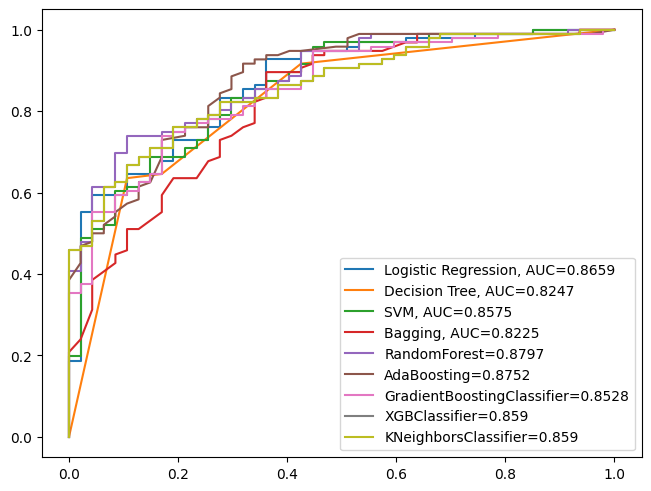

In [3]:
from sklearn.datasets import make_classification       #lg
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
import xgboost as xgb
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from lightgbm import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn. ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['Pass'].values
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2,random_state=0)
plt.figure(0).clf()
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Logistic Regression, AUC="+str(auc))
model = DecisionTreeClassifier(max_depth = 2)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Decision Tree, AUC="+str(auc))
model = svm.SVC(kernel='linear', C=1.2, probability=True)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="SVM, AUC="+str(auc))
model = BaggingClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=100,max_samples=0.8, oob_score=True,random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Bagging, AUC="+str(auc))
model =RandomForestClassifier(n_estimators= 950,min_samples_split= 10,min_samples_leaf= 2,max_features= 'sqrt',max_depth= 132,criterion= 'entropy')
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="RandomForest="+str(auc))
adb=AdaBoostClassifier(n_estimators=200,random_state=1,learning_rate=.01)
boost = adb.fit(X_train,y_train)
y_pred = adb.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="AdaBoosting="+str(auc))
xgc=GradientBoostingClassifier(n_estimators=200,random_state=1,learning_rate=.01)
boost = xgc.fit(X_train,y_train)
y_pred = xgc.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="GradientBoostingClassifier="+str(auc))
xgf=xgb.XGBClassifier(n_estimators=200,random_state=1,learning_rate=.01)
boost = xgf.fit(X_train,y_train)
y_pred = xgf.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="XGBClassifier="+str(auc))
knn = KNeighborsClassifier(n_neighbors = 2)
boost = knn.fit(X_train,y_train)
y_pred = xgf.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="KNeighborsClassifier="+str(auc))
plt.legend()

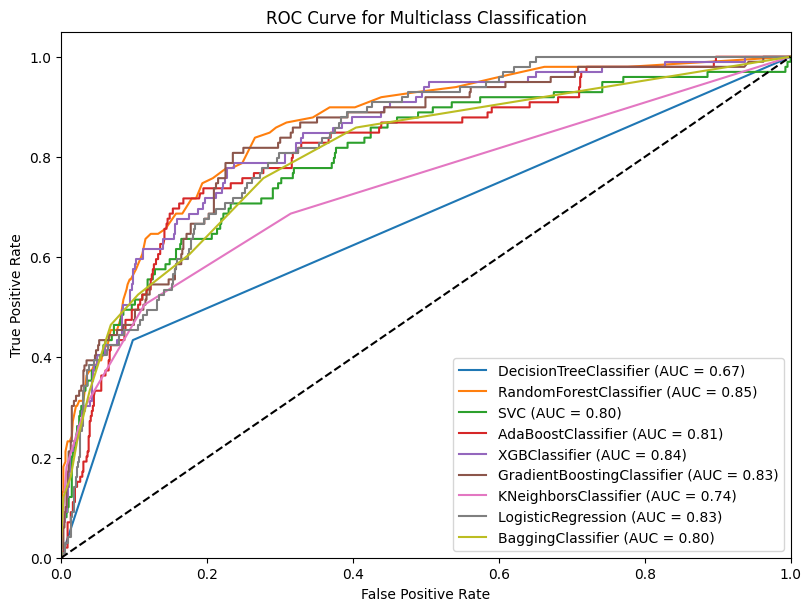


Process time 26.60526752471924 seconds.


In [4]:
from sklearn.datasets import make_classification       #lg2
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn. ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
import matplotlib.pyplot as plt
import numpy as np
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
y = label_binarize(y, classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-'])
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
classifiers = [
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    SVC(probability=True),
    AdaBoostClassifier(),
    XGBClassifier(),
    GradientBoostingClassifier(),
    KNeighborsClassifier(),
    LogisticRegression(),
    BaggingClassifier()]
plt.figure(figsize=(8, 6))
for classifier in classifiers:
    clf = OneVsRestClassifier(classifier)
    clf.fit(X_train, y_train)
    end = time.time()
    y_score = clf.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.plot(fpr["micro"], tpr["micro"], label=classifier.__class__.__name__+' (AUC = %0.2f)' % roc_auc["micro"])
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

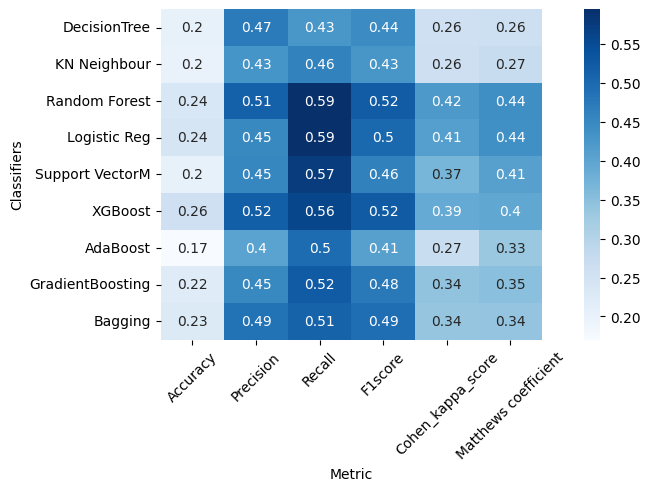


Process time -82.37634539604187 seconds.


In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, matthews_corrcoef
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
import time
start = time.time()
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
              'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC','Pass','GPAM', 'GPA'], axis=1)
X = df.iloc[:, 0:11]
y = df['GPAA']  # Assuming 'GPAAA' is the column name for the target variable
label_encoder = LabelEncoder()
label_encoder.fit(y)
y_encoded = label_encoder.transform(y)
labels = label_encoder.classes_
classes = np.unique(y_encoded)
xtrain, xtest, ytrain, ytest = train_test_split(X, y_encoded, test_size=0.2, random_state=20)
def evaluate(model, xtest, ytest, name):
    ypred = model.predict(xtest)
    accuracy = np.round(balanced_accuracy_score(ytest, ypred), 4)
    precision = np.round(precision_score(ytest, ypred, average='weighted'), 4)
    recall = np.round(recall_score(ytest, ypred, average='weighted'), 4)
    f1score = np.round(f1_score(ytest, ypred, average='weighted'), 4)
    cohenkappa_score = np.round(cohen_kappa_score(ytest, ypred), 4)
    matthews_corrcoef_ = np.round(matthews_corrcoef(ytest, ypred), 4)
    return accuracy, precision, recall, f1score, cohenkappa_score, matthews_corrcoef_
def fit_data(xtrain, ytrain, xtest, ytest):
    ADB = AdaBoostClassifier().fit(xtrain, ytrain)
    XGB = XGBClassifier(num_class=len(classes), eval_metric='mlogloss', use_label_encoder=False).fit(xtrain, ytrain)
    RF = RandomForestClassifier(max_features=0.2).fit(xtrain, ytrain)
    SVM = SVC().fit(xtrain, ytrain)
    KNN = KNeighborsClassifier().fit(xtrain, ytrain)
    LOGREG = LogisticRegression(C=50, multi_class='multinomial', solver='lbfgs', max_iter=3000).fit(xtrain, ytrain)
    DecisionTree = DecisionTreeClassifier(random_state=0).fit(xtrain, ytrain)
    gbc = GradientBoostingClassifier().fit(xtrain, ytrain)
    bag = BaggingClassifier(DecisionTree).fit(xtrain, ytrain) 
    end = time.time()
    performance_list = []
    performance_metrics = ['Accuracy', 'Precision', 'Recall', 'F1score', 'Cohen_kappa_score', 'Matthews coefficient']
    indices = []
    model_dict = {
        'DecisionTree': DecisionTree,
        'KN Neighbour': KNN,
        'Random Forest': RF,
        'Logistic Reg': LOGREG,
        'Support VectorM': SVM,
        'XGBoost': XGB,
        'AdaBoost': ADB,
        'GradientBoosting': gbc,
        'Bagging': bag
    }
    for name, model in model_dict.items():
        performance = evaluate(model, xtest, ytest, name)
        performance_list.append(performance)
        indices.append(name)        
    performance_frame = pd.DataFrame(performance_list, columns=performance_metrics, index=indices)
    return performance_frame
result = fit_data(xtrain, ytrain, xtest, ytest)
result[result['F1score'] >= 0.50]  # .50 needs
plt.rcParams['figure.constrained_layout.use'] = True
sns.heatmap(result, annot=True, cmap='Blues')
plt.xlabel('Metric')
plt.ylabel('Classifiers')
plt.xticks(rotation=45)
plt.show()
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [7]:
import numpy as np     
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
DT = OneVsRestClassifier(SVM(random_state=0))
y_score = DT.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves DT')
plt.legend(loc="lower right")
plt.show()
y_pred = DT.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = DT.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

NameError: name 'SVM' is not defined

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
RF = OneVsRestClassifier(RandomForestClassifier(random_state=0))
y_score = RF.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves Random F')
plt.legend(loc="lower right")
plt.show()
y_pred = RF.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = RF.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
import numpy as np                #lg
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.svm import SVC
from itertools import cycle
import pandas as pd
start = time.time()
#df['GPAAA'] = df['GPAAA'].replace({'A':1,'A-':2,'B+':3,'B':4,'B-':5,'C+':6,'C':7,'C-':8,'D+':9})
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
SVM = OneVsRestClassifier(SVC(kernel='linear', probability=True, random_state=0))
y_score = SVM.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw, label='ROC curve of class {0} (area = {1:0.2f})' 
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],  label='micro-average ROC curve (area = {0:0.2f})' ''.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curves SVM')
plt.legend(loc="lower right")
plt.show()
y_pred = SVM.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = SVM.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.ensemble import AdaBoostClassifier
from itertools import cycle
import pandas as pd
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
ADA = OneVsRestClassifier(AdaBoostClassifier(n_estimators=100, random_state=0))
y_score = ADA.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves Ada')
plt.legend(loc="lower right")
plt.show()
y_pred = ADA.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = ADA.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle
from xgboost import XGBClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
XGB = OneVsRestClassifier(XGBClassifier(random_state=0))
y_score = XGB.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves Xgb')
plt.legend(loc="lower right")
plt.show()
y_pred = XGB.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = XGB.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
GB = OneVsRestClassifier(GradientBoostingClassifier(random_state=0))
y_score = GB.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves Gradient')
plt.legend(loc="lower right")
plt.show()
y_pred = GB.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = GB.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report, confusion_matrix
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
KNN = OneVsRestClassifier(KNeighborsClassifier())
y_score = KNN.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves KNN')
plt.legend(loc="lower right")
plt.show()
y_pred = KNN.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = KNN.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.linear_model import LogisticRegression
from itertools import cycle
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
LR = OneVsRestClassifier(AdaBoostingClassifier(random_state=0))
y_score = LR.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]),
color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves - Logistic Regression')
plt.legend(loc="lower right")
plt.show()
y_pred = LR.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = LR.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.ensemble import BaggingClassifier
from itertools import cycle
import pandas as pd
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
BAG = OneVsRestClassifier(BaggingClassifier(n_estimators=100, random_state=0))
y_score = BAG.fit(X_train, y_train).predict_proba(X_test)
end = time.time()
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]),
color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves - Bagging')
plt.legend(loc="lower right")
plt.show()
y_pred = BAG.predict(X_test)
print(classification_report(y_test, y_pred))
accuracy = BAG.score(X_test, y_test)
print("Accuracy score",accuracy)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

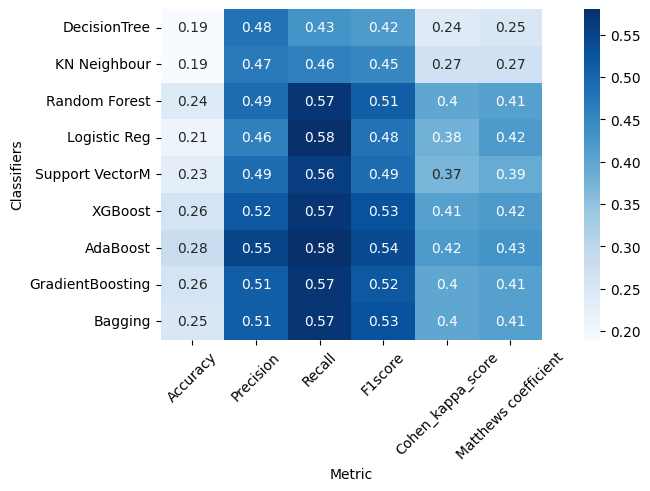


Process time 0.06104230880737305 seconds.


In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, matthews_corrcoef
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings("ignore")
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
              'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC','Pass','GPAM', 'GPA'], axis=1)
X = df.iloc[:, 0:11]
y = df['GPAA']  # Assuming 'GPAAA' is the column name for the target variable
label_encoder = LabelEncoder()
label_encoder.fit(y)
y_encoded = label_encoder.transform(y)
labels = label_encoder.classes_
classes = np.unique(y_encoded)
xtrain, xtest, ytrain, ytest = train_test_split(X, y_encoded, test_size=0.2, random_state=20)
def evaluate(model, xtest, ytest, name):
    ypred = model.predict(xtest)
    accuracy = np.round(balanced_accuracy_score(ytest, ypred), 2)
    precision = np.round(precision_score(ytest, ypred, average='weighted'), 2)
    recall = np.round(recall_score(ytest, ypred, average='weighted'), 2)
    f1score = np.round(f1_score(ytest, ypred, average='weighted'), 2)
    cohenkappa_score = np.round(cohen_kappa_score(ytest, ypred), 2)
    matthews_corrcoef_ = np.round(matthews_corrcoef(ytest, ypred), 2)
    return accuracy, precision, recall, f1score, cohenkappa_score, matthews_corrcoef_
def fit_data(xtrain, ytrain, xtest, ytest):
    ADB = OneVsRestClassifier(AdaBoostClassifier()).fit(xtrain, ytrain)
    XGB = OneVsRestClassifier(XGBClassifier(random_state=0)).fit(xtrain, ytrain)
    RF = OneVsRestClassifier(RandomForestClassifier(max_features=0.2)).fit(xtrain, ytrain)
    SVM = OneVsRestClassifier(SVC()).fit(xtrain, ytrain)
    KNN = OneVsRestClassifier(KNeighborsClassifier()).fit(xtrain, ytrain)
    LOGREG = OneVsRestClassifier(LogisticRegression(C=50, multi_class='multinomial', solver='lbfgs', max_iter=3000)).fit(xtrain, ytrain)
    DT = OneVsRestClassifier(DecisionTreeClassifier(random_state=0)).fit(xtrain, ytrain)
    gbc = OneVsRestClassifier(GradientBoostingClassifier()).fit(xtrain, ytrain)
    bag = OneVsRestClassifier(BaggingClassifier(DecisionTreeClassifier(random_state=0))).fit(xtrain, ytrain)
    performance_list = []
    performance_metrics = ['Accuracy', 'Precision', 'Recall', 'F1score', 'Cohen_kappa_score', 'Matthews coefficient']
    indices = []
    model_dict = {
        'DecisionTree': DT,
        'KN Neighbour': KNN,
        'Random Forest': RF,
        'Logistic Reg': LOGREG,
        'Support VectorM': SVM,
        'XGBoost': XGB,
        'AdaBoost': ADB,
        'GradientBoosting': gbc,
        'Bagging': bag    }
    for name, model in model_dict.items():
        performance = evaluate(model, xtest, ytest, name)
        performance_list.append(performance)
        indices.append(name)
    performance_frame = pd.DataFrame(performance_list, columns=performance_metrics, index=indices)
    return performance_frame
end = time.time()
result = fit_data(xtrain, ytrain, xtest, ytest)
result[result['F1score'] >= 0.10]  # .50 needs
plt.rcParams['figure.constrained_layout.use'] = True
sns.heatmap(result, annot=True, cmap='Blues')
plt.xlabel('Metric')
plt.ylabel('Classifiers')
plt.xticks(rotation=45)
plt.show()
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

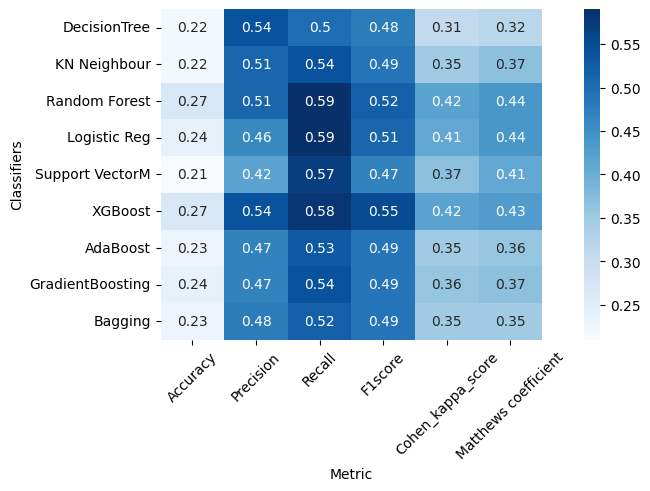


Process time 0.07004547119140625 seconds.


In [8]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsOneClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, matthews_corrcoef
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings("ignore")
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
              'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC','Pass','GPAM', 'GPA'], axis=1)
X = df.iloc[:, 0:11]
y = df['GPAA']  # Assuming 'GPAAA' is the column name for the target variable
label_encoder = LabelEncoder()
label_encoder.fit(y)
y_encoded = label_encoder.transform(y)
labels = label_encoder.classes_
classes = np.unique(y_encoded)
xtrain, xtest, ytrain, ytest = train_test_split(X, y_encoded, test_size=0.2, random_state=20)
def evaluate(model, xtest, ytest, name):
    ypred = model.predict(xtest)
    accuracy = np.round(balanced_accuracy_score(ytest, ypred), 2)
    precision = np.round(precision_score(ytest, ypred, average='weighted'), 2)
    recall = np.round(recall_score(ytest, ypred, average='weighted'), 2)
    f1score = np.round(f1_score(ytest, ypred, average='weighted'), 2)
    cohenkappa_score = np.round(cohen_kappa_score(ytest, ypred), 2)
    matthews_corrcoef_ = np.round(matthews_corrcoef(ytest, ypred), 2)
    return accuracy, precision, recall, f1score, cohenkappa_score, matthews_corrcoef_
def fit_data(xtrain, ytrain, xtest, ytest):
    ADB = OneVsOneClassifier(AdaBoostClassifier()).fit(xtrain, ytrain)
    XGB = OneVsOneClassifier(XGBClassifier(random_state=0)).fit(xtrain, ytrain)
    RF = OneVsOneClassifier(RandomForestClassifier(max_features=0.2)).fit(xtrain, ytrain)
    SVM = OneVsOneClassifier(SVC()).fit(xtrain, ytrain)
    KNN = OneVsOneClassifier(KNeighborsClassifier()).fit(xtrain, ytrain)
    LOGREG = OneVsOneClassifier(LogisticRegression(C=50, multi_class='multinomial', solver='lbfgs', max_iter=3000)).fit(xtrain, ytrain)
    DT = OneVsOneClassifier(DecisionTreeClassifier(random_state=0)).fit(xtrain, ytrain)
    gbc = OneVsOneClassifier(GradientBoostingClassifier()).fit(xtrain, ytrain)
    bag = OneVsOneClassifier(BaggingClassifier(DecisionTreeClassifier(random_state=0))).fit(xtrain, ytrain)
    performance_list = []
    performance_metrics = ['Accuracy', 'Precision', 'Recall', 'F1score', 'Cohen_kappa_score', 'Matthews coefficient']
    indices = []
    model_dict = {
        'DecisionTree': DT,
        'KN Neighbour': KNN,
        'Random Forest': RF,
        'Logistic Reg': LOGREG,
        'Support VectorM': SVM,
        'XGBoost': XGB,
        'AdaBoost': ADB,
        'GradientBoosting': gbc,
        'Bagging': bag }
    for name, model in model_dict.items():
        performance = evaluate(model, xtest, ytest, name)
        performance_list.append(performance)
        indices.append(name)        
    performance_frame = pd.DataFrame(performance_list, columns=performance_metrics, index=indices)
    return performance_frame
end = time.time()
result = fit_data(xtrain, ytrain, xtest, ytest)
result[result['F1score'] >= 0.10]  # Adjust the threshold as per your requirement
plt.rcParams['figure.constrained_layout.use'] = True
sns.heatmap(result, annot=True, cmap='Blues')
plt.xlabel('Metric')
plt.ylabel('Classifiers')
plt.xticks(rotation=45)
plt.show()
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
from sklearn import svm
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
import pandas as pd
import matplotlib.pyplot as plt
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=0)
svm_classifier = svm.SVC(kernel='poly', degree=2).fit(X_train, y_train)
y_pred = svm_classifier.predict(X_test)
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Confusion Matrix - SVM Classifier")
plt.show()
svm_accuracy = svm_classifier.score(X_test, y_test)
print(f"Accuracy of SVM: {svm_accuracy}")
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)
cross_val_scores = cross_val_score(svm_classifier, x, y, cv=2)
print("Cross-Validation Scores:", cross_val_scores)
visualizer = ROCAUC(svm_classifier)
visualizer.fit(x, y)
visualizer.score(x, y)
visualizer.show()

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, balanced_accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
import seaborn as sns
import matplotlib.pyplot as plt
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=0)
rf = RandomForestClassifier(n_estimators=950, min_samples_split=10, min_samples_leaf=2,
                            max_features='sqrt', max_depth=132, criterion='entropy')
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()
rf_accuracy = rf.score(X_test, y_test)
print(f"Accuracy of Random Forest Classifier: {rf_accuracy}")
print(classification_report(y_test, y_pred))
cv_scores = cross_val_score(rf, x, y, cv=2)
print("Cross-validation scores:", cv_scores)
print("Mean Cross Validation Score:", cv_scores.mean())
print("Standard Deviation of Cross Validation Scores:", cv_scores.std())
balanced_acc = balanced_accuracy_score(y_test, y_pred)
print("Balanced Accuracy Score:", balanced_acc)
visualizer = ROCAUC(rf)
visualizer.fit(x, y)
visualizer.score(x, y)
visualizer.show()

In [ ]:
import pandas as pd
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, classification_report, balanced_accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
import seaborn as sns
import matplotlib.pyplot as plt
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
gb = GradientBoostingClassifier(n_estimators=200, random_state=1, learning_rate=0.01)
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()
gb_accuracy = gb.score(X_test, y_test)
print(f"Accuracy of Gradient Boosting Classifier: {gb_accuracy}")
print(classification_report(y_test, y_pred))
cross_val_scores = cross_val_score(gb, X, y, cv=2)
print("Cross-validation scores:", cross_val_scores)
print("Mean Cross Validation Score:", cross_val_scores.mean())
print("Standard Deviation of Cross Validation Scores:", cross_val_scores.std())
balanced_acc = balanced_accuracy_score(y_test, y_pred)
print("Balanced Accuracy Score:", balanced_acc)
visualizer = ROCAUC(gb)
visualizer.fit(X, y)
visualizer.score(X, y)
visualizer.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
import xgboost as xgb
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].replace({'A': 0, 'A-': 1, 'B+': 2, 'B': 3, 'B-': 4, 'C+': 5, 'C': 6, 'C-': 7})
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=0)
gb = xgb.XGBClassifier(n_estimators=100, random_state=1, learning_rate=.01)
gb.fit(X_train, y_train)
pred = gb.predict(X_test)
cm = confusion_matrix(y_test, pred)
acc = accuracy_score(y_test, pred)
print("Confusion Matrix:\n", cm)
print("Accuracy:", acc)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
sns.heatmap(cm, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class") 
plt.ylabel("True Class")
plt.show()
print(classification_report(y_test, pred))
visualizer = ROCAUC(gb)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()
cv_scores = cross_val_score(gb, X, y, cv=5)
print("Cross Validation Scores:", cv_scores)
print("Mean Cross Validation Score:", cv_scores.mean())
print("Standard Deviation of Cross Validation Scores:", cv_scores.std())

[[ 8  3  0  1  0  0  0  0]
 [ 8 38  1  5  0  0  0  0]
 [ 0  5 10  2  3  0  0  0]
 [ 0 12  1  3  1  0  0  0]
 [ 0  4  2  1  4  0  0  0]
 [ 1  1  0  0  2  0  0  1]
 [ 0  1  2  0  2  0  0  0]
 [ 0  0  0  1  0  0  0  0]]


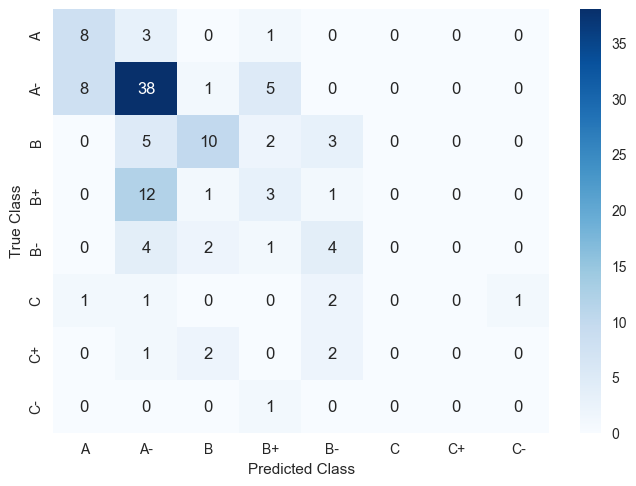

Accuracy of Bagging Classifier: 0.5121951219512195
              precision    recall  f1-score   support

           A       0.47      0.67      0.55        12
          A-       0.59      0.73      0.66        52
           B       0.62      0.50      0.56        20
          B+       0.23      0.18      0.20        17
          B-       0.33      0.36      0.35        11
           C       0.00      0.00      0.00         5
          C+       0.00      0.00      0.00         5
          C-       0.00      0.00      0.00         1

    accuracy                           0.51       123
   macro avg       0.28      0.30      0.29       123
weighted avg       0.46      0.51      0.48       123

Cross-validation scores: [0.45121951 0.35918367]
Mean Cross Validation Score: 0.4052015928322549
Standard Deviation of Cross Validation Scores: 0.046017919362867116
Balanced Accuracy Score: 0.3046928561634444


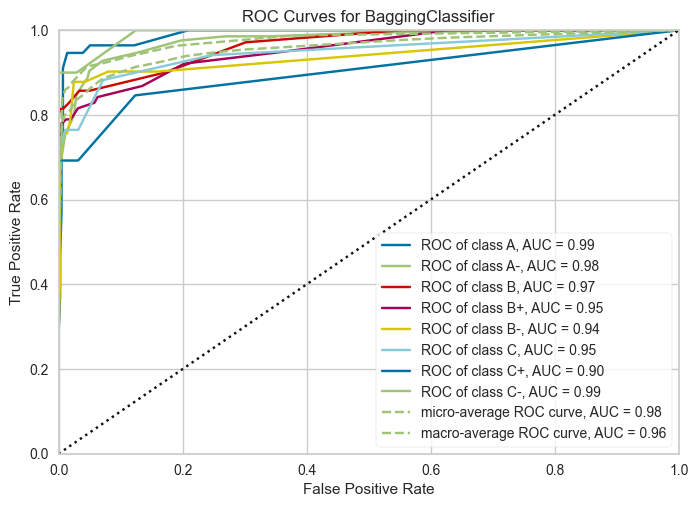

<Axes: title={'center': 'ROC Curves for BaggingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [45]:
import pandas as pd   #DTB
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, balanced_accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
import seaborn as sns
import matplotlib.pyplot as plt
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=0)
base_classifier = DecisionTreeClassifier(max_features=5, random_state=0)
bagging = BaggingClassifier(base_classifier, n_estimators=20, random_state=1)
bagging.fit(X_train, y_train)
y_pred = bagging.predict(X_test)
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()
bagging_accuracy = bagging.score(X_test, y_test)
print(f"Accuracy of Bagging Classifier: {bagging_accuracy}")
print(classification_report(y_test, y_pred))
cross_val_scores = cross_val_score(bagging, X, y, cv=2)
print("Cross-validation scores:", cross_val_scores)
print("Mean Cross Validation Score:", cross_val_scores.mean())
print("Standard Deviation of Cross Validation Scores:", cross_val_scores.std())
balanced_acc = balanced_accuracy_score(y_test, y_pred)
print("Balanced Accuracy Score:", balanced_acc)
visualizer = ROCAUC(bagging)
visualizer.fit(X, y)
visualizer.score(X, y)
visualizer.show()

[[ 3  5  0  1  0  0  0  0]
 [11 22  2  7  0  1  0  0]
 [ 0  3  5  4  2  2  0  0]
 [ 0  5  2  4  1  0  0  0]
 [ 1  2  1  3  1  0  1  0]
 [ 1  1  0  2  0  0  0  1]
 [ 1  0  0  1  2  0  0  0]
 [ 1  0  0  0  0  0  0  0]]


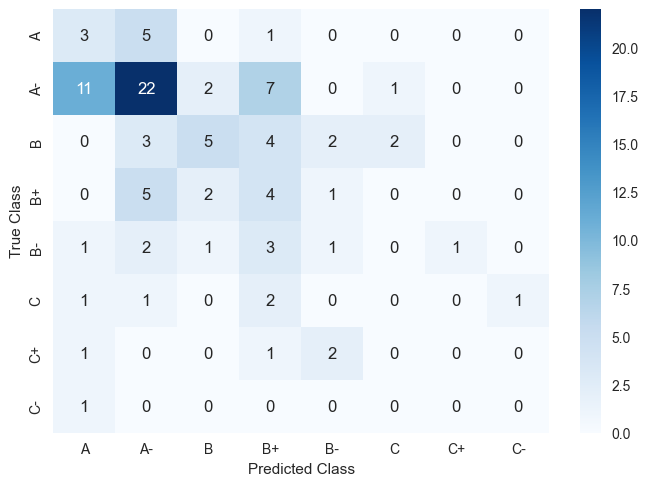

Accuracy of Boosting Classifier: 0.35353535353535354
              precision    recall  f1-score   support

           A       0.17      0.33      0.22         9
          A-       0.58      0.51      0.54        43
           B       0.50      0.31      0.38        16
          B+       0.18      0.33      0.24        12
          B-       0.17      0.11      0.13         9
           C       0.00      0.00      0.00         5
          C+       0.00      0.00      0.00         4
          C-       0.00      0.00      0.00         1

    accuracy                           0.35        99
   macro avg       0.20      0.20      0.19        99
weighted avg       0.38      0.35      0.36        99

Cross-validation scores: [0.26422764 0.29387755]
Mean Cross Validation Score: 0.2790525966484155
Standard Deviation of Cross Validation Scores: 0.014824954371992716
Balanced Accuracy Score: 0.20023821059431524


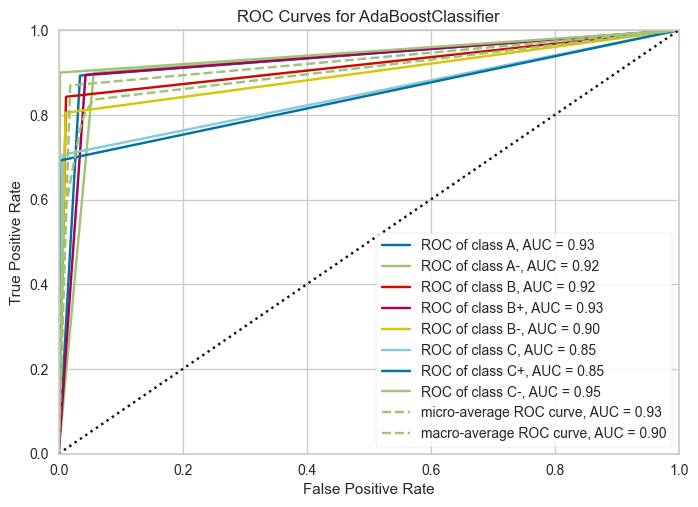

<Axes: title={'center': 'ROC Curves for AdaBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [47]:
import pandas as pd #DTBoost
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, balanced_accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
import seaborn as sns
import matplotlib.pyplot as plt
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
base_classifier = DecisionTreeClassifier(max_features=5, random_state=0)
boosting = AdaBoostClassifier(base_classifier, n_estimators=20, random_state=1)
boosting.fit(X_train, y_train)
y_pred = boosting.predict(X_test)
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()
boosting_accuracy = boosting.score(X_test, y_test)
print(f"Accuracy of Boosting Classifier: {boosting_accuracy}")
print(classification_report(y_test, y_pred))
cross_val_scores = cross_val_score(boosting, X, y, cv=2)
print("Cross-validation scores:", cross_val_scores)
print("Mean Cross Validation Score:", cross_val_scores.mean())
print("Standard Deviation of Cross Validation Scores:", cross_val_scores.std())
balanced_acc = balanced_accuracy_score(y_test, y_pred)
print("Balanced Accuracy Score:", balanced_acc)
visualizer = ROCAUC(boosting)
visualizer.fit(X, y)
visualizer.score(X, y)
visualizer.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv", encoding='latin1')
df.columns

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, balanced_accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix      #11
from sklearn.neighbors import KNeighborsClassifier
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2,random_state=0)
knn = KNeighborsClassifier(n_neighbors=3).fit(X_train,y_train)
#y_pred = xgc.predict_proba(X_test)[:, 1]
y_pred = gb.predict(X_test)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class") 
plt.ylabel("True Class")
plt.show()
nn_accuracy = gb.score(X_test, y_test)
print(f"Accuracy of XGb is:{nn_accuracy}")
print(classification_report(y_test,y_pred))
score=cross_val_score(gb,X,Y,cv=2) #score.mean()
print("Cross_val:", score)
balanced_acc = balanced_accuracy_score(y_test, y_pred)
print("Balanced Accuracy Score:", balanced_acc)
print("Mean Cross Validation Score:", score.mean())
print("Standard Deviation of Cross Validation Scores:", score.std())
visualizer = ROCAUC(knn)
visualizer.fit(X, Y)
visualizer.score(X, Y)
visualizer.show()

In [ ]:
import numpy as np #DTREST
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.tree import DecisionTreeClassifier
from itertools import cycle
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.25, random_state=0)
classifier = OneVsRestClassifier(DecisionTreeClassifier(max_features=5, random_state=0))
y_score = classifier.fit(X_train, y_train).predict_proba(X_test)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='AUC curve of class {0} (AUC = {1:0.2f})'.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='Micro-average AUC curve (AUC = {0:0.2f})'.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves - Decision Tree')
plt.legend(loc="lower right")
plt.show()
y_pred = classifier.predict(X_test)
confusion_mat = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))
plt.figure()
plt.imshow(confusion_mat, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix - Decision Tree')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
thresh = confusion_mat.max() / 2.
for i in range(confusion_mat.shape[0]):
    for j in range(confusion_mat.shape[1]):
        plt.text(j, i, format(confusion_mat[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if confusion_mat[i, j] > thresh else "black")
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.show()
report = classification_report(y_test, y_pred, target_names=classes)
print(report)
nn_accuracy = classifier.score(X_test, y_test)
print(f"Accuracy of decision tree: {nn_accuracy}")

In [ ]:
import numpy as np #DTONE
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix
from sklearn.multiclass import OneVsOneClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.tree import DecisionTreeClassifier
from itertools import cycle
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
y = np.argmax(label_binarize(y, classes=classes), axis=1)
n_classes = len(classes)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.25, random_state=0)
classifier = OneVsOneClassifier(RandomForestClassifier(max_features=5, random_state=0))
classifier.fit(X_train, y_train)
decision_scores = classifier.decision_function(X_test)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test, decision_scores[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(label_binarize(y_test, classes=classes).ravel(), decision_scores.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='AUC curve of class {0} (AUC = {1:0.2f})'.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='Micro-average AUC curve (AUC = {0:0.2f})'.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves - Decision Tree')
plt.legend(loc="lower right")
plt.show()
y_pred = classifier.predict(X_test)
confusion_mat = confusion_matrix(y_test, y_pred)
plt.figure()
plt.imshow(confusion_mat, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix - Decision Tree')
plt.colorbar()
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)
thresh = confusion_mat.max() / 2.
for i in range(confusion_mat.shape[0]):
    for j in range(confusion_mat.shape[1]):
        plt.text(j, i, format(confusion_mat[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if confusion_mat[i, j] > thresh else "black")
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.show()
report = classification_report(y_test, y_pred, target_names=classes)
print(report)
accuracy = np.mean(y_pred == y_test)
print(f"Accuracy of decision tree: {accuracy}")

In [ ]:
import pandas as pd #DT
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, balanced_accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
#df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
dt = DecisionTreeClassifier(max_features=5, random_state=0)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()
dt_accuracy = dt.score(X_test, y_test)
print(f"Accuracy of Decision Tree Classifier: {dt_accuracy}")
print(classification_report(y_test, y_pred))
cross_val_scores = cross_val_score(dt, X, y, cv=2)
print("Cross-validation scores:", cross_val_scores)
print("Mean Cross Validation Score:", cross_val_scores.mean())
print("Standard Deviation of Cross Validation Scores:", cross_val_scores.std())
balanced_acc = balanced_accuracy_score(y_test, y_pred)
print("Balanced Accuracy Score:", balanced_acc)
visualizer = ROCAUC(dt)
visualizer.fit(X, y)
visualizer.score(X, y)
visualizer.show()

In [ ]:
#ensambel Bosting ebl

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=0)
lr = LogisticRegression(max_iter=1000)
lr.fit(x_train, y_train)
pred_lr = lr.predict(x_test)
print("Prediction (Logistic Regression):", pred_lr)
cm_lr = confusion_matrix(y_test, pred_lr)
print(cm_lr)
accuracy_lr = lr.score(x_test, y_test)
print(f"Accuracy of Logistic Regression: {accuracy_lr}")
print(classification_report(y_test, pred_lr))
score_lr = cross_val_score(lr, x, y, cv=5)
print("Cross-validation scores (Logistic Regression):", score_lr)
rf = RandomForestClassifier()
rf.fit(x_train, y_train)
pred_rf = rf.predict(x_test)
print("Prediction (Random Forest):", pred_rf)
cm_rf = confusion_matrix(y_test, pred_rf)
print(cm_rf)
accuracy_rf = rf.score(x_test, y_test)
print(f"Accuracy of Random Forest: {accuracy_rf}")
print(classification_report(y_test, pred_rf))
score_rf = cross_val_score(rf, x, y, cv=5)
print("Cross-validation scores (Random Forest):", score_rf)
visualizer_lr = ROCAUC(lr)
visualizer_lr.fit(x, y)
visualizer_lr.score(x, y)
visualizer_lr.show()
visualizer_rf = ROCAUC(rf)
visualizer_rf.fit(x, y)
visualizer_rf.score(x, y)
visualizer_rf.show()

In [ ]:
import pandas as pd
from sklearn import svm
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=0)
svm_model = svm.SVC(kernel='poly', degree=2)
svm_model.fit(x_train, y_train)
pred_svm = svm_model.predict(x_test)
print("Prediction (SVM):", pred_svm)
cm_svm = confusion_matrix(y_test, pred_svm)
print(cm_svm)
accuracy_svm = svm_model.score(x_test, y_test)
print(f"Accuracy of SVM: {accuracy_svm}")
print(classification_report(y_test, pred_svm))
score_svm = cross_val_score(svm_model, x, y, cv=5)
print("Cross-validation scores (SVM):", score_svm)
visualizer_svm = ROCAUC(svm_model)
visualizer_svm.fit(x, y)
visualizer_svm.score(x, y)
visualizer_svm.show()

In [ ]:
import pandas as pd    #DT
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import confusion_matrix, classification_report
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
             'Parent_Education_Bachelor', 'Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['GPAA']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=0)
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)
pred = dt.predict(x_test)
print("Predictions:", pred)
cm = confusion_matrix(y_test, pred)
print("Confusion Matrix:")
print(cm)
accuracy = dt.score(x_test, y_test)
print(f"Accuracy of Decision Tree Classifier: {accuracy}")
report = classification_report(y_test, pred)
print("Classification Report:")
print(report)
scores = cross_val_score(dt, x, y, cv=5)
print("Cross-Validation Scores:")
print(scores)

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 2).fit(x_train,y_train)
pred=knn.predict(x_test)
print("prediction",pred) 
cm=confusion_matrix(y_test,pred)
print(cm)
nn_accuracy = knn.score(x_test, y_test)
print(f"Accuracy of svm is:{nn_accuracy}")
print(classification_report(y_test,pred))
score=cross_val_score(knn,x,y,cv=5)
#score.mean()
print("Cross_val")
score

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
import xgboost as xgb
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['Pass'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
rf = RandomForestClassifier(n_estimators=200)
adb = AdaBoostClassifier(n_estimators=200, random_state=1, learning_rate=0.01)
xgc = GradientBoostingClassifier(n_estimators=200, random_state=1, learning_rate=0.01)
xgf = xgb.XGBClassifier(n_estimators=200, random_state=1, learning_rate=0.01)
rf.fit(x_train, y_train)
adb.fit(x_train, y_train)
xgc.fit(x_train, y_train)
xgf.fit(x_train, y_train)
print('Random Forest:', rf.score(x_test, y_test))
print('AdaBoost:', adb.score(x_test, y_test))
print('Gradient Boosting:', xgc.score(x_test, y_test))
print('XGBoosting:', xgf.score(x_test, y_test))
visualizer_rf = ROCAUC(rf)
visualizer_rf.fit(x, y)
visualizer_rf.score(x, y)
visualizer_rf.show()
visualizer_adb = ROCAUC(adb)
visualizer_adb.fit(x, y)
visualizer_adb.score(x, y)
visualizer_adb.show()
visualizer_xgc = ROCAUC(xgc)
visualizer_xgc.fit(x, y)
visualizer_xgc.score(x, y)
visualizer_xgc.show()
visualizer_xgf = ROCAUC(xgf)
visualizer_xgf.fit(x, y)
visualizer_xgf.score(x, y)
visualizer_xgf.show()

In [ ]:
import pandas as pd   #ebl #voting
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
import xgboost as xgb
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA']
class_mapping = {'A': 0, 'A-': 1, 'B': 2, 'B+': 3, 'B-': 4, 'C': 5, 'C+': 6, 'C-': 7}
y = y.map(class_mapping)
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
rf = RandomForestClassifier()
adb = AdaBoostClassifier()
xgc = GradientBoostingClassifier()
xgf = xgb.XGBClassifier()
rf.fit(x_train, y_train)
adb.fit(x_train, y_train)
xgc.fit(x_train, y_train)
xgf.fit(x_train, y_train)
print('Random Forest:', rf.score(x_test, y_test))
print('AdaBoost:', adb.score(x_test, y_test))
print('Gradient Boosting:', xgc.score(x_test, y_test))
print('XGBoosting:', xgf.score(x_test, y_test))
class_names = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
visualizer_rf = ROCAUC(rf, classes=class_names, micro=True, macro=True, per_class=True)
visualizer_rf.fit(x_train, y_train)
visualizer_rf.score(x_test, y_test)
visualizer_rf.show()
visualizer_adb = ROCAUC(adb, classes=class_names, micro=True, macro=True, per_class=True)
visualizer_adb.fit(x_train, y_train)
visualizer_adb.score(x_test, y_test)
visualizer_adb.show()
visualizer_xgc = ROCAUC(xgc, classes=class_names, micro=True, macro=True, per_class=True)
visualizer_xgc.fit(x_train, y_train)
visualizer_xgc.score(x_test, y_test)
visualizer_xgc.show()
visualizer_xgf = ROCAUC(xgf, classes=class_names, micro=True, macro=True, per_class=True)
visualizer_xgf.fit(x_train, y_train)
visualizer_xgf.score(x_test, y_test)
visualizer_xgf.show()

In [ ]:
import time
start = time.time()
adb=cross_val_score(AdaBoostClassifier(n_estimators=20,random_state=1,learning_rate=.01),x,y,cv=5)
end = time.time()
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))
adb

In [ ]:
import time
start = time.time()
xgb=cross_val_score(xgb.XGBClassifier(n_estimators=20,random_state=1,learning_rate=.01),x,y,cv=5)
end = time.time()
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))
xgb

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
rf = RandomForestClassifier()
lr = LogisticRegression()
svm = SVC(probability=True)  
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_pred)
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)
lr_accuracy = accuracy_score(y_test, lr_pred)
svm.fit(X_train, y_train)
svm_pred = svm.predict(X_test)
svm_accuracy = accuracy_score(y_test, svm_pred)
voting_hard = VotingClassifier(estimators=[('rf', rf), ('lr', lr), ('svm', svm)], voting='hard')
voting_hard.fit(X_train, y_train)
hard_pred = voting_hard.predict(X_test)
hard_accuracy = accuracy_score(y_test, hard_pred)
voting_soft = VotingClassifier(estimators=[('rf', rf), ('lr', lr), ('svm', svm)], voting='soft')
voting_soft.fit(X_train, y_train)
soft_pred = voting_soft.predict(X_test)
soft_accuracy = accuracy_score(y_test, soft_pred)
print("Random Forest Accuracy:", rf_accuracy)
print("Logistic Regression Accuracy:", lr_accuracy)
print("SVM Accuracy:", svm_accuracy)
print("Hard Voting Accuracy:", hard_accuracy)
print("Soft Voting Accuracy:", soft_accuracy)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
species = ("Min", "Max", "TimeTaken")
penguin_means = {
    'RandomForestClassifier': (37,51,2.4),
    'AdaBoostClassifier': (52,38,1.88),
    'GradientBoostingClassifier': (52,45,8.3),
    'XGBClassifier': (49,36,3.16) }
x = np.arange(len(species))  # the label locations
width = 90 # the width of the bars
multiplier = 0
fig, ax = plt.subplots(layout='constrained')
for attribute, measurement in penguin_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=10)
    multiplier += 1
ax.set_ylabel('Length (mm)')
ax.set_title('Training Accuracy Score')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=2)
ax.set_ylim(0, 65)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from yellowbrick.classifier import ROCAUC
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['Pass'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.25, random_state=0)
knn = KNeighborsClassifier(n_neighbors=7).fit(X_train, y_train)
print("Knn: ", knn.score(X_test, y_test))
model = DecisionTreeClassifier(random_state=0)
model = model.fit(X_train, y_train)
print("Decision Tree Score: ", model.score(X_test, y_test))
rf = RandomForestClassifier(max_depth=4, n_estimators=300, max_features=2, random_state=43, n_jobs=-1)
rf = rf.fit(X_train, y_train)
print("Random Forest Score: ", rf.score(X_test, y_test))
bag = BaggingClassifier(model, n_estimators=100)
bag = bag.fit(X_train, y_train)
print("Bagging Score: ", bag.score(X_test, y_test))
ada = AdaBoostClassifier(rf, n_estimators=100, random_state=1, learning_rate=.01)
ada = ada.fit(X_train, y_train)
print("Boosting Score: ", ada.score(X_test, y_test))
lr = LogisticRegression()
dt = DecisionTreeClassifier()
svm = SVC(kernel='poly', degree=2)
knn = KNeighborsClassifier(n_neighbors=7)
evc = VotingClassifier(estimators=[('lr', lr), ('dt', dt), ('svm', svm), ('knn', knn),('rf', rf)], voting='hard')
evc = evc.fit(X_train, y_train)
print("LR DT SVM Knn: ", evc.score(X_test, y_test))
visualizer_knn = ROCAUC(knn, per_class=True, micro=True, macro=True)
visualizer_knn.fit(X, Y)
visualizer_knn.score(X, Y)
visualizer_knn.show()
visualizer_dt = ROCAUC(dt, per_class=True, micro=True, macro=True)
visualizer_dt.fit(X, Y)
visualizer_dt.score(X, Y)
visualizer_dt.show()
visualizer_ada = ROCAUC(ada, per_class=True, micro=True, macro=True)
visualizer_ada.fit(X, Y)
visualizer_ada.score(X, Y)
visualizer_ada.show()
visualizer_lr = ROCAUC(lr, per_class=True, micro=True, macro=True)
visualizer_lr.fit(X, Y)
visualizer_lr.score(X, Y)
visualizer_lr.show()
visualizer_svm = ROCAUC(svm, binary=True, per_class=True, micro=True, macro=True)
visualizer_svm.fit(X, Y)
visualizer_svm.score(X, Y)
visualizer_svm.show()
visualizer_evc = ROCAUC(rf, per_class=True, micro=True, macro=True)
visualizer_evc.fit(X, Y)
visualizer_evc.score(X, Y)
visualizer_evc.show()

In [ ]:
import numpy as np  #voting
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from yellowbrick.classifier import ROCAUC
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values
label_encoder = LabelEncoder()
Y_encoded = label_encoder.fit_transform(Y)
X_train, X_test, y_train, y_test = train_test_split(X, Y_encoded, test_size=0.25, random_state=0)
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)
print("Knn Score:", knn.score(X_test, y_test))
dt = DecisionTreeClassifier(random_state=0)
dt.fit(X_train, y_train)
print("Decision Tree Score:", dt.score(X_test, y_test))
rf = RandomForestClassifier( min_samples_split=5, n_estimators=300, n_jobs=-1,random_state=43)
rf.fit(X_train, y_train)
print("Random Forest Score:", rf.score(X_test, y_test))
bag = BaggingClassifier(dt, n_estimators=100)
bag.fit(X_train, y_train)
print("Bagging Score:", bag.score(X_test, y_test))
ada = AdaBoostClassifier(rf, n_estimators=100, random_state=1, learning_rate=0.01)
ada.fit(X_train, y_train)
print("Boosting Score:", ada.score(X_test, y_test))
lr = LogisticRegression()
lr.fit(X_train, y_train)
print("Logistic Regression Score:", lr.score(X_test, y_test))
svm = SVC(kernel='poly', degree=2, probability=True)
svm.fit(X_train, y_train)
print("Support Vector Score:", svm.score(X_test, y_test))
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
print("XGBoost Score:", xgb.score(X_test, y_test))
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)
print("Gradient Boosting Score:", gb.score(X_test, y_test))
evc = VotingClassifier(estimators=[('lr', lr), ('dt', dt), ('svm', svm), ('knn', knn), ('xgb', xgb), ('gb', gb),('bag',bag),('rf',rf)], voting='soft')
evc.fit(X_train, y_train)
print("LR DT SVM Knn XGBoost GB Score:", evc.score(X_test, y_test))
# Visualizing each estimator inside the VotingClassifier
visualizer_lr = ROCAUC(lr, classes=label_encoder.classes_,micro=True, macro=True, per_class=True)
visualizer_lr.fit(X_train, y_train)
visualizer_lr.score(X_test, y_test)
visualizer_lr.show()
visualizer_dt = ROCAUC(dt, classes=label_encoder.classes_,micro=True, macro=True, per_class=True)
visualizer_dt.fit(X_train, y_train)
visualizer_dt.score(X_test, y_test)
visualizer_dt.show()
visualizer_ada = ROCAUC(ada, classes=label_encoder.classes_,micro=True, macro=True, per_class=True)
visualizer_ada.fit(X_train, y_train)
visualizer_ada.score(X_test, y_test)
visualizer_ada.show()
visualizer_svm = ROCAUC(svm, classes=label_encoder.classes_, micro=True, macro=True, per_class=True)
visualizer_svm.fit(X_train, y_train)
visualizer_svm.score(X_test, y_test)
visualizer_svm.show()
visualizer_xgb = ROCAUC(xgb, classes=label_encoder.classes_,micro=True, macro=True, per_class=True)
visualizer_xgb.fit(X_train, y_train)
visualizer_xgb.score(X_test, y_test)
visualizer_xgb.show()
visualizer_gb = ROCAUC(gb, classes=label_encoder.classes_,micro=True, macro=True, per_class=True)
visualizer_gb.fit(X_train, y_train)
visualizer_gb.score(X_test, y_test)
visualizer_gb.show()
visualizer_evc = ROCAUC(evc, classes=label_encoder.classes_,micro=True, macro=True, per_class=True)
visualizer_evc.fit(X_train, y_train)
visualizer_evc.score(X_test, y_test)
visualizer_evc.show()

In [ ]:
import pandas as pd
from sklearn import model_selection
from sklearn. ensemble import AdaBoostClassifier
from sklearn.model_selection import KFold

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv")
print(df.head()) 
x=df.drop(['GPAM','Pf','Result','GPAAA','pff','Churn'],axis=1).values
y=df['Pf'].values
array=df.values
seed=7
num_trees=30

In [ ]:
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kfold=model_selection.KFold(n_splits=10,shuffle=True,random_state=seed)
model=AdaBoostClassifier(n_estimators=num_trees,random_state=seed)
result=model_selection.cross_val_score(model,x,y,cv=kfold)
result #print(result.mean())

In [ ]:
from sklearn import svm
from xgboost import XGBClassifier
XGBClassifier()
clf=XGBClassifier()
seed=7
num_trees=30
kfold=model_selection.KFold(n_splits=10,shuffle=True,random_state=seed)
model=XGBClassifier(n_estimators=num_trees,random_state=seed)
result=model_selection.cross_val_score(model,x,y,cv=10)
result

In [ ]:
from sklearn.datasets import load_iris
iris=load_iris()
print(iris)

In [ ]:
x=iris.data
y=iris.target
x,y

In [ ]:
from sklearn.model_selection import KFold
kf=KFold(n_splits=5,shuffle=True)

In [ ]:
print("training set    Test set")
for train_set,test_set in kf.split(x):
    print(train_set,test_set)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
rf=RandomForestClassifier(n_estimators=10)
print(cross_val_score(rf,x,y,scoring='accuracy',cv=10))
accuracy=cross_val_score(rf,x,y,scoring='accuracy',cv=10).mean()*100
print("Accuracy",accuracy)

In [ ]:
#Linear regression of categorial variables

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
dummy1 = pd.get_dummies(df["School_From"])
dummy2 = pd.get_dummies(df["Parent_Education"])
dummf = pd.concat([df, dummy1, dummy2], axis=1)
dummf.drop(["School_From", "Parent_Education"], inplace=True, axis=1)
formula = 'GPAM ~ Eng + Math + Physics + Chemistry + Plus_Two + Eng1 + Math2 + Mixed + Govt + Private + Bachelor + Master + PHD + PlusTwo'
model = sm.OLS.from_formula(formula, data=dummf)
res = model.fit()
print(res.summary())

In [ ]:
reg2=sm.OLS(dummf["GPAM"],sm.add_constant(dummf[["Math","Plus_Two","Physics"]])).fit()
print(reg2.summary())

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].replace({'A': 1, 'A-': 2, 'B+': 3, 'B': 4, 'B-': 5, 'C+': 6, 'C': 7, 'C-': 8, 'F': 9})
# df['gender'] = df['gender'].astype('category')
# df['gender'] = df['gender'].cat.codes
df.isnull().sum()
# x = df.drop(columns='salary')
# y = df['salary']
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)
lr = LinearRegression()
lr.fit(x_train, y_train)
c = lr.intercept_
print("Intercept:", c)
m = lr.coef_
print("Coefficients:", m)
y_pred = lr.predict(x_test)
print("y_pred:", y_pred)
plt.scatter(y_test, y_pred, c=np.sign(y_test - y_pred), cmap='coolwarm')
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.title('Actual vs Predicted values')
x_min, x_max = plt.xlim()
y_min, y_max = plt.ylim()
x_plot = np.linspace(x_min, x_max, 100)
y_plot = x_plot
plt.plot(x_plot, y_plot, 'k--')
plt.show()
y_pred = lr.predict(x_test)
r2 = r2_score(y_test, y_pred)
print("R-squared:", r2)

In [ ]:
import pandas as pd
import statsmodels.api as sm
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X =  df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].replace({'A': 1, 'A-': 2, 'B+': 3, 'B': 4, 'B-': 5, 'C+': 6, 'C': 7, 'C-': 8, 'F': 9})
X_with_intercept = sm.add_constant(X)  # Add constant term to the feature matrix
model = sm.OLS(Y, X_with_intercept).fit()
summary = model.summary()
summary_df = pd.read_html(summary.tables[1].as_html(), header=0, index_col=0)[0]
summary_df.rename(columns={'const': 'Intercept'}, inplace=True)
feature_names = df.drop(['School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'Pass',
       'GPAM','GPAA' ,'GPA'], axis=1).columns
summary_df.index = feature_names
print(summary_df)

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\cc.csv",encoding='latin1')
df.head()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
drop_columns = ['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA']
X = df.drop(drop_columns, axis=1).values
Y = df['GPAA'].replace({'A': 1, 'A-': 2, 'B+': 3, 'B': 4, 'B-': 5, 'C+': 6, 'C': 7, 'C-': 8, 'F': 9})
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=0)
model = LogisticRegression(multi_class="auto", solver="liblinear")
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print("R-squared score:", r2)
fig, ax = plt.subplots()
scatter = ax.scatter(y_test, y_pred, c=X_test[:, 1], cmap='coolwarm')
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Predicted vs. Actual Values")
plt.colorbar(scatter)
plt.show()
print("Intercept:", model.intercept_)
print("Coefficients:", model.coef_)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAM'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print("R-squared score:", r2)
fig, ax = plt.subplots()
scatter = ax.scatter(y_test, y_pred, c=X_test[:, 0], cmap='coolwarm')
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Predicted vs. Actual Values")
plt.colorbar(scatter)
x_min, x_max = plt.xlim()
y_min, y_max = plt.ylim()
x_plot = np.linspace(x_min, x_max, 100)
y_plot = x_plot
plt.plot(x_plot, y_plot, 'k--')
plt.show()
print("Intercept:", model.intercept_)
print("Coefficient:", model.coef_[0])

In [ ]:
#Categorical  ordinal Variables 

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\SalaryCopyCopy.csv",encoding='latin1')
df.sample(3)

In [ ]:
df=df.iloc[:,5:]# left up 5 columns than all

In [ ]:
df

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(df.iloc[:,0:1],df.iloc[:,-1],test_size=.2)#y=last column

In [ ]:
x_train,

In [ ]:
from sklearn.preprocessing import OrdinalEncoder
oe=OrdinalEncoder(categories=[['F','D+','C-','C','C+','B-','B','B+','A-','A']])

In [ ]:
oe.fit(x_train)

In [ ]:
x_train=oe.transform(x_train)
x_test=oe.transform(x_test)

In [ ]:
x_train

In [ ]:
#categorical data transformation

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\Salary - Copy.csv",encoding='latin1')
print(df.head()) 
df.dtypes

In [ ]:
df["Grade"].unique()

In [ ]:
df["gender"].unique()

In [ ]:
ohe = OneHotEncoder(categories='auto')
feature_arr = ohe.fit_transform(df[['Grade','gender']]).toarray()
feature_labels = ohe.get_feature_names_out()

In [ ]:
feature_labels = np.array(feature_labels).ravel()
feature_labels 

In [ ]:
features = pd.DataFrame(feature_arr, columns=feature_labels)

In [ ]:
features.head()

In [ ]:
features.rename(columns = {'x0_A':'A','x0_A-':'A-','x0_B':'B','x0_B+':'B+','x0_B-':'B-','x0_C':'C','x0_C-':'C-','x0_D':'D','x0_D+':'D+','x0_F':'F','x1_Female':'Female','x1_Male':'Male'}, inplace = True)

In [ ]:
features.head()

In [ ]:
final=pd.concat([df,features],axis=1)
final.head()

In [ ]:
#laber encoder target variables

In [ ]:
import pandas as pd
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\Salary - Copy.csv",encoding='latin1')
print(df.head()) 

In [ ]:
df.dtypes

In [ ]:
df["Grade"].unique()

In [ ]:
df["Grade"].value_counts()

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder=LabelEncoder()
df["Grade"]=label_encoder.fit_transform(df["Grade"])

In [ ]:
df.head(7)

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import skew
%matplotlib inline

In [ ]:
import matplotlib.pyplot as plt
plt.style.use("ggplot")
plt.rcParams['figure.figsize'] = (10, 10)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv")
print(df.head())
# Separate features (X) and target variable (y)
X = df.drop(['GPAM', 'Pf', 'Result', 'GPAAA', 'pff', 'Churn'], axis=1).values
y = df['GPAAA'].values 
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df.drop(['Unnamed: 0'], axis=1)
X = df.drop(['GPAA', 'GPA', 'GPAM', 'Pass'], axis=1).values
Y = df['GPAM'].values
df.columns

In [ ]:
import pandas as pd    #DT
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
import graphviz
from sklearn.metrics import accuracy_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1).values
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=0)
dtree_model = DecisionTreeClassifier(max_depth=2)
dtree_model.fit(X_train, y_train)
dtree_predictions = dtree_model.predict(X_test)
levels = sorted(pd.unique(y_test))
cm = confusion_matrix(y_test, dtree_predictions, labels=levels)
print(cm)
accuracy = accuracy_score(y_test, dtree_predictions)
print("Accuracy score:", accuracy)
dot_data = export_graphviz(dtree_model, out_file=None, feature_names=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'PhyAcc', 'CheEco', 'Mixed'],  
                           class_names=le.classes_, filled=True, rounded=True, special_characters=True)
graph = graphviz.Source(dot_data)  
graph.view()

In [ ]:
from sklearn.svm import LinearSVC, NuSVC, SVC    #DT
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.model_selection import FeatureImportances
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA'].values
labels = list(x.columns)
labels
dt=DecisionTreeClassifier(max_depth=10)
viz = FeatureImportances(dt, labels=labels, relative=False, topn=9)
viz.fit(x, y)
viz.show()

In [ ]:
from sklearn.linear_model import RidgeClassifier  #DT
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
#df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = DecisionTreeClassifier(max_depth=4)
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F'])
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

In [ ]:
# importing necessary libraries   Feature importance
import pandas as pd
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split  
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
le.classes_

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
rf = RandomForestClassifier(max_depth=4, n_estimators=300, max_features=2, random_state=43, n_jobs=-1)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy = rf.score(X_test, y_test)
print("Accuracy score:", accuracy)
levels = np.unique(y)
cm = confusion_matrix(y_test, y_pred, labels=levels)
print("Confusion matrix:")
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)

In [ ]:
cm_df = pd.DataFrame(cm,
                     index = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'], 
                     columns = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
df.head()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from yellowbrick.classifier import ROCAUC
from yellowbrick.model_selection import FeatureImportances
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA'].values
labels = list(x.columns)
rf = RandomForestClassifier(n_estimators=100, max_depth=6)
viz = FeatureImportances(rf, labels=labels, relative=False, topn=6)
viz.fit(x, y)
viz.show()
plt.show()
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RandomForestClassifier(n_estimators=100, max_depth=6)
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()
plt.show()
pred= model.predict(X_test)
accuracy =model.score(X_test, y_test)
print("Accuracy score",accuracy)
cm = confusion_matrix(y_test, pred)
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt
from yellowbrick.classifier import ROCAUC
from sklearn.metrics import confusion_matrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = SVC(kernel='rbf', probability=True)
model.fit(X_train, y_train)
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F'])
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()
plt.show()
y_pred = model.predict(X_test)
accuracy = model.score(X_test, y_test)
print("Accuracy score:", accuracy)
cm = confusion_matrix(y_test, y_pred)
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)

In [ ]:
import pandas as pd
import numpy as np
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from yellowbrick.model_selection import FeatureImportances
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
labels = list(X.columns)
SVM = svm.SVC(kernel='linear', probability=True, random_state=0)
viz = FeatureImportances(SVM, labels=labels, relative=False, topn=6)
viz.fit(X, y)
viz.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.svm import SVC
from itertools import cycle
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
#df = df[df["GPAA"] != 'F']
#df['GPAAA'] = df['GPAAA'].replace({'A':1,'A-':2,'B+':3,'B':4,'B-':5,'C+':6,'C':7,'C-':8,'D+':9})
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=0)
classifier = OneVsRestClassifier(SVC(kernel='sigmoid', probability=True, random_state=0))
#kernels = ['linear', 'poly', 'rbf', 'sigmoid']
y_score = classifier.fit(X_train, y_train).predict_proba(X_test)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curves SVM')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from yellowbrick.model_selection import FeatureImportances
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
labels = list(x.columns)
gb=GradientBoostingClassifier(n_estimators=100,learning_rate=.01)
viz = FeatureImportances(gb, labels=labels, relative=False, topn=6)
viz.fit(x, y)
viz.show()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.3, random_state=0)
pred= gb.predict(X_test)
accuracy = gb.score(X_test, y_test)
print("Accuracy score",accuracy)
cm = confusion_matrix(y_test, pred)
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report, accuracy_score
from sklearn.preprocessing import label_binarize
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
classifier = OneVsRestClassifier(GradientBoostingClassifier(random_state=0))
y_score = classifier.fit(X_train, y_train).predict_proba(X_test)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves Gradient')
plt.legend(loc="lower right")
plt.show()
y_pred = np.argmax(y_score, axis=1)
y_true = np.argmax(y_test, axis=1)
cm = confusion_matrix(y_true, y_pred)
classification_rep = classification_report(y_true, y_pred, target_names=classes)
accuracy = accuracy_score(y_true, y_pred)
print("Confusion Matrix:")
print(cm)
print("\nClassification Report:")
print(classification_rep)
print("\nAccuracy Score:", accuracy)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
from sklearn.linear_model import Lasso
from yellowbrick.datasets import load_concrete
from yellowbrick.model_selection import FeatureImportances
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
labels = list(df.columns)
# df['gender']=df['gender'].astype('category')
#df['gender']=df['gender'].cat.codes
df.isnull().sum()
#x=df.drop(columns='salary')
#y=df['salary']
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2)
lr=Lasso()
lr.fit(xtrain,ytrain)
viz = FeatureImportances(Lasso(), labels=labels, relative=False, topn=10)
viz.fit(x, y)
viz.show()

In [ ]:
from sklearn.linear_model import Lasso
from yellowbrick.datasets import load_bikeshare
from yellowbrick.regressor import prediction_error
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
visualizer = prediction_error(Lasso(), x, y)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
import xgboost as xgb
from yellowbrick.model_selection import FeatureImportances
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
labels = list(x.columns)
xgb=xgb.XGBClassifier(n_estimators=100,random_state=1,learning_rate=.01)
viz = FeatureImportances(xgb, labels=labels, relative=False, topn=6)
viz.fit(x, y)
viz.show()
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2)
pred= xgb.predict(xtest)
accuracy = xgb.score(xtest, ytest)
print("Accuracy score",accuracy)
cm = confusion_matrix(ytest, pred)
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import xgboost as xgb
from yellowbrick.model_selection import FeatureImportances
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
labels = list(x.columns)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1)
xgb_classifier = xgb.XGBClassifier(n_estimators=100, random_state=1, learning_rate=0.01)
xgb_classifier.fit(x_train, y_train)
viz = FeatureImportances(xgb_classifier, labels=labels, relative=False, topn=6)
viz.fit(x, y)
viz.show()
pred = xgb_classifier.predict(x_test)
accuracy = xgb_classifier.score(x_test, y_test)
print("Accuracy score:", accuracy)
cm = confusion_matrix(y_test, pred)
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)
print(classification_report(y_test, pred))

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import cycle
from xgboost import XGBClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
df["GPAA"]=df["GPAA"].astype("category")
y=df["GPAA"]
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.5, random_state=0)
classifier = OneVsRestClassifier(XGBClassifier(random_state=0))
y_score = classifier.fit(X_train, y_train).predict_proba(X_test)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves Xgb')
plt.legend(loc="lower right")
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
df.dropna(subset=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco', 'Mixed',
'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education'], inplace=True)
x = df.drop(['GPAM', 'GPA', 'GPAA', 'School_From', 'Parent_Education'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']

plt.subplots(3, 3, figsize=(15, 15))
for idx, col in enumerate(df.columns):
    ax = plt.subplot(3, 3, idx+1)
    ax.yaxis.set_ticklabels([])
    sns.distplot(df.loc[df.GPAA == 0][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'black', 'label': "A"})
    sns.distplot(df.loc[df.GPAA == 1][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'red', 'label': "A-"})
    sns.distplot(df.loc[df.GPAA == 2][col], hist=False, axlabel=False,
             kde_kws={'linestyle': '-', 'color': 'yellow', 'label': "B+"})
    sns.distplot(df.loc[df.GPAA == 3][col], hist=False, axlabel=False,
             kde_kws={'linestyle': '-', 'color': 'blue', 'label': "B"})
    sns.distplot(df.loc[df.GPAA == 4][col], hist=False, axlabel=False,
             kde_kws={'linestyle': '-', 'color': 'pink', 'label': "B-"})
    sns.distplot(df.loc[df.GPAA == 5][col], hist=False, axlabel=False,
             kde_kws={'linestyle': '-', 'color': 'orange', 'label': "C+"})
    sns.distplot(df.loc[df.GPAA == 6][col], hist=False, axlabel=False,
             kde_kws={'linestyle': '-', 'color': 'green', 'label': "C"})
    sns.distplot(df.loc[df.GPAA == 7][col], hist=False, axlabel=False,
             kde_kws={'linestyle': '-', 'color': 'green', 'label': "C-"})
    ax.set_title(col)
    ax.legend()
    handles, labels = ax.get_legend_handles_labels()
plt.figlegend(handles, labels, loc='upper right')

plt.subplot(3, 3, 9).set_visible(False)
plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
df.dropna(subset=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco', 'Mixed',
                  'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education'], inplace=True)
x=df.drop(['GPAM','GPA','GPAA', 'School_From', 'Parent_Education'],axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
plt.subplots(3, 3, figsize=(15, 15))
for idx, col in enumerate(df.columns):
    ax = plt.subplot(3, 3, idx+1)
    ax.yaxis.set_ticklabels([])
    sns.distplot(df.loc[df.GPAA == 0][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'black', 'label': "A"})
    sns.distplot(df.loc[df.GPAA == 1][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'red', 'label': "A-"})
    sns.distplot(df.loc[df.GPAA == 2][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'yellow', 'label': "B+"})
    sns.distplot(df.loc[df.GPAA == 3][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'blue', 'label': "B"})
    sns.distplot(df.loc[df.GPAA == 4][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'pink', 'label': "B-"})
    sns.distplot(df.loc[df.GPAA == 5][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'orange', 'label': "C+"})
    sns.distplot(df.loc[df.GPAA == 6][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'green', 'label': "C"})
    sns.distplot(df.loc[df.GPAA == 7][col], hist=False, axlabel=False,
                 kde_kws={'linestyle': '-', 'color': 'green', 'label': "C-"})
    ax.set_title(col)
    handles, labels = ax.get_legend_handles_labels()
plt.figlegend(handles, labels, loc='upper right')

plt.subplot(3, 3, 9).set_visible(False)
plt.show()
plt.subplot(3, 3, 9).set_visible(False)
plt.show()

In [ ]:
from yellowbrick.model_selection import FeatureImportances
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
#df = df[df["GPAA"] != 'F']
df.dropna(subset=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 
                  'Phy_Acc', 'Che_Eco', 'Mixed',    'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education'], inplace=True)
x=df.drop(['GPAM','GPA','GPAA', 'School_From', 'Parent_Education','Pass'],axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
dt_clf = DecisionTreeClassifier(random_state=0)
viz = FeatureImportances(dt_clf, stack=False, relative=False, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-'])
viz.fit(x, y)
viz.show()
bag_model=BaggingClassifier(
                 base_estimator=DecisionTreeClassifier(max_depth=2),
                 n_estimators=100,
                 max_samples=0.8,
                 oob_score=True,
                 random_state=0)
bag_model

In [ ]:
import numpy as np
import pandas as pd
from yellowbrick.model_selection import FeatureImportances
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.dropna(subset=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco',
                  'Mixed', 'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education'], inplace=True)
df = df[df["GPAA"] != 'F']
x=df.drop(['GPAM','GPA','GPAA', 'School_From', 'Parent_Education','Pass'],axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
labels = list(x.columns)
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.2, random_state=42)
bagging_clf = BaggingClassifier(base_estimator=dt_clf, max_samples=0.8, oob_score=True, random_state=0)
bagging_clf.fit(xtrain, ytrain)
base_estimators = bagging_clf.estimators_
feature_importances = []
for estimator in base_estimators:
    feature_importances.append(estimator.feature_importances_)
avg_feature_importances = np.mean(feature_importances, axis=0)
print(avg_feature_importances)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
y=df["GPAA"]
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.2, random_state=42)
dt_clf = DecisionTreeClassifier(random_state=0)
bagging_clf = BaggingClassifier(base_estimator=dt_clf, max_samples=0.8, oob_score=True, random_state=0)
bagging_clf.fit(xtrain, ytrain)
base_estimators = bagging_clf.estimators_
feature_importances = [estimator.feature_importances_ for estimator in base_estimators]
avg_feature_importances = np.mean(feature_importances, axis=0)
print("Average feature importances:", avg_feature_importances)
pred = bagging_clf.predict(xtest)
accuracy = accuracy_score(ytest, pred)
print("Accuracy score:", accuracy)
cm = confusion_matrix(ytest, pred)
print("Confusion matrix:")
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
y=df["GPAA"]
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.2, random_state=42)
dt_clf = DecisionTreeClassifier(random_state=0)
bagging_clf = BaggingClassifier(base_estimator=dt_clf, max_samples=0.8, oob_score=True, random_state=0)
bagging_clf.fit(xtrain, ytrain)
result = permutation_importance(bagging_clf, xtest, ytest, n_repeats=10, random_state=0)
importances = result.importances_mean
indices = np.argsort(importances)[::-1]
labels = x.columns
indices = indices[::-1]
importances = importances[::-1]
plt.barh(range(x.shape[1]), importances)
plt.yticks(range(x.shape[1]), labels[indices])
plt.title("Feature importances DT")
plt.show()

In [ ]:
from yellowbrick.model_selection import FeatureImportances
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
df["GPAA"]=df["GPAA"].astype("category")
y=df["GPAA"]
model = LogisticRegression(multi_class="auto", solver="liblinear")
viz = FeatureImportances(model, stack=True, relative=False,absolute=True,classes = [{0:'A', 1:'A-', 2:'B', 3:'B+', 4:'B-',5: 'C', 6:'C+', 7:'C-'}])
viz.fit(x, y)
viz.show()

In [ ]:
from yellowbrick.model_selection import FeatureImportances
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
y=df["GPAA"]
model = LogisticRegression(multi_class="auto", solver="liblinear")
model.fit(x, y)
viz = FeatureImportances(model, stack=True, relative=False, labels=labels, ylabel=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-'],classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-'])
viz.fit(x, y)
viz.show()


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from yellowbrick.classifier import DiscriminationThreshold
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
y = df["GPAA"]
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
for class_label in label_encoder.classes_:
    binary_y = (y_encoded == label_encoder.transform([class_label])[0])
    model = LogisticRegression(multi_class="auto", solver="liblinear")
    visualizer = DiscriminationThreshold(model, is_fitted=True)
    visualizer.fit(x, binary_y)
    visualizer.set_title(f"Discrimination Threshold ({class_label})")
    visualizer.show()

In [ ]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RidgeClassifier()
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()

In [ ]:
from sklearn.linear_model import RidgeCV
from yellowbrick.model_selection import LearningCurve
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAM']
model = RidgeCV()
visualizer = LearningCurve(model, scoring='r2')
visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show()   

In [ ]:
from sklearn.linear_model import RidgeCV
from yellowbrick.datasets import load_energy
from yellowbrick.model_selection import learning_curve
from sklearn.linear_model import RidgeCV
from yellowbrick.model_selection import LearningCurve
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
learning_curve(RidgeCV(), X, y, scoring='r2')

In [ ]:
from sklearn.linear_model import Ridge
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import residuals_plot
from sklearn.linear_model import RidgeCV
from yellowbrick.datasets import load_energy
from yellowbrick.model_selection import learning_curve
from sklearn.linear_model import RidgeCV
from yellowbrick.model_selection import LearningCurve
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
visualizer = residuals_plot(
    Ridge(), X, y, train_color="maroon", test_color="gold")

In [ ]:
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
kelbow_visualizer(KMeans(random_state=4), X, k=(2,10))

In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.cluster import InterclusterDistance
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
model = KMeans(6)
visualizer = InterclusterDistance(model)
visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()
intercluster_distance(MiniBatchKMeans(5, random_state=777), X)

In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.model_selection import LearningCurve
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from yellowbrick.cluster import InterclusterDistance
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
model = KMeans()
visualizer = LearningCurve(model, scoring="adjusted_rand_score", random_state=42)
visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show()

In [ ]:
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from yellowbrick.model_selection import RFECV
from sklearn.datasets import make_blobs
from yellowbrick.cluster import InterclusterDistance
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
visualizer = RFECV(SVC(kernel='linear', C=1))
visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show() 

In [ ]:
from sklearn.tree import DecisionTreeClassifier  #DT
from sklearn.datasets import make_classification
from yellowbrick.model_selection import RFECV
from sklearn.datasets import make_blobs
from yellowbrick.cluster import InterclusterDistance
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
from sklearn.tree import DecisionTreeClassifier
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
visualizer = RFECV(DecisionTreeClassifier(max_features=4, random_state=0))
visualizer.fit(X, y)  # Fit the data to the visualizer
visualizer.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from yellowbrick.model_selection import RFECV
from yellowbrick.datasets import load_credit
from sklearn.datasets import make_blobs
from yellowbrick.cluster import InterclusterDistance
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
cv = StratifiedKFold(2)
visualizer = RFECV(RandomForestClassifier(), cv=cv, scoring='f1_weighted')
visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show()

In [ ]:
from sklearn.svm import SVC
from yellowbrick.model_selection import DroppingCurve
from sklearn.datasets import make_blobs
from yellowbrick.cluster import InterclusterDistance
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
visualizer = DroppingCurve(SVC())
visualizer.fit(X, y)
visualizer.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier #DT
from yellowbrick.model_selection import DroppingCurve
from sklearn.datasets import make_blobs
from yellowbrick.cluster import InterclusterDistance
from sklearn.cluster import KMeans
from yellowbrick.cluster.elbow import kelbow_visualizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
from yellowbrick.cluster import intercluster_distance
from sklearn.cluster import MiniBatchKMeans
from sklearn.tree import DecisionTreeClassifier
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
visualizer = DroppingCurve(DecisionTreeClassifier())
visualizer.fit(X, y)
visualizer.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RandomForestClassifier()
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()  

In [ ]:
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model=svm.SVC()
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()  

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.multiclass import OneVsRestClassifier
from sklearn import svm
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = OneVsRestClassifier(svm.SVC())
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F'])
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
import xgboost as xgb 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = xgb.XGBClassifier(n_estimators=20,random_state=1,learning_rate=.01)
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()  

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
# Instaniate the classification model and visualizer
model = GradientBoostingClassifier(n_estimators=200,learning_rate=.01)
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()  

In [ ]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RidgeClassifier()
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show()  

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from yellowbrick.classifier import PrecisionRecallCurve
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
categories = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
df["GPAA"] = pd.Categorical(df["GPAA"], categories=categories)
y = df["GPAA"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
rfc = RandomForestClassifier(random_state=42)
viz = PrecisionRecallCurve(rfc, per_class=True, classes=categories)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier  #DT
from sklearn.model_selection import train_test_split
from yellowbrick.classifier import PrecisionRecallCurve
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
categories = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
df["GPAA"] = pd.Categorical(df["GPAA"], categories=categories)
y = df["GPAA"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
dtc = DecisionTreeClassifier(max_features=5, random_state=42)
viz = PrecisionRecallCurve(dtc, per_class=True, classes=categories)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
import matplotlib.pyplot as plt
from sklearn.linear_model import RidgeClassifier
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.model_selection import train_test_split as tts
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X_train, X_test, y_train, y_test = tts( X, y, test_size=0.2, shuffle=True, random_state=0)
viz = PrecisionRecallCurve(RidgeClassifier(random_state=0))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.linear_model import RidgeClassifier, LogisticRegression
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=0)
viz1 = PrecisionRecallCurve(RidgeClassifier(random_state=0))
viz2 = PrecisionRecallCurve(LogisticRegression(random_state=0))
viz1.fit(X_train, y_train)
viz1.score(X_test, y_test)
viz1.show()
viz2.fit(X_train, y_train)
viz2.score(X_test, y_test)
viz2.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import RidgeClassifier, LogisticRegression
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
df["GPAA"]=df["GPAA"].astype("category")
le = LabelEncoder()
label=le.fit_transform(df["GPAA"])
df=df.drop(["GPAA"],axis='columns')
df['GPAA']=label
y=df['GPAA']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=0)
viz1 = PrecisionRecallCurve(RidgeClassifier(random_state=0))
viz2 = PrecisionRecallCurve(LogisticRegression(random_state=0))
viz1.fit(X_train, y_train)
viz2.fit(X_train, y_train)
viz1.score(X_test, y_test)
viz2.score(X_test, y_test)
ridge_scores = viz1.decision_function(X_test)
ridge_precision, ridge_recall, _ = precision_recall_curve(y_test, ridge_scores)
logistic_probs = viz2.predict_proba(X_test)
logistic_precision, logistic_recall, _ = precision_recall_curve(y_test, logistic_probs[:, 1])
plt.figure(figsize=(8, 6))
plt.step(ridge_recall, ridge_precision, where='post', label='Ridge Classifier')
plt.step(logistic_recall, logistic_precision, where='post', label='Logistic Regression Classifier')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.legend(loc='lower left')
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from yellowbrick.classifier import PrecisionRecallCurve
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
categories = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
df["GPAA"] = pd.Categorical(df["GPAA"], categories=categories)
y = df["GPAA"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
rfc = RandomForestClassifier(random_state=42)
viz = PrecisionRecallCurve(rfc, per_class=True, classes=categories)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.ensemble import RandomForestClassifier
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
encoder = LabelEncoder()
y = encoder.fit_transform(y)
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2, shuffle=True)
viz = PrecisionRecallCurve(
    MultinomialNB(),
    classes=encoder.classes_,
    colors=["purple", "cyan", "blue"],
    iso_f1_curves=True,
    per_class=True,
    micro=False)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
encoder = LabelEncoder()
y = encoder.fit_transform(y)
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2, shuffle=True)
viz = PrecisionRecallCurve(
    SVC(),
    classes=encoder.classes_,
    colors=["purple", "cyan", "blue"],
    iso_f1_curves=True,
    per_class=True,
    micro=False)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.naive_bayes import MultinomialNB     #lg
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.ensemble import RandomForestClassifier
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
encoder = LabelEncoder()
y = encoder.fit_transform(y)
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2, shuffle=True)
viz = PrecisionRecallCurve(
    RandomForestClassifier(),
    classes=encoder.classes_,
    colors=["purple", "cyan", "blue"],
    iso_f1_curves=True,
    per_class=True,
    micro=False )
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.naive_bayes import MultinomialNB     #DT
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
encoder = LabelEncoder()
y = encoder.fit_transform(y)
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2, shuffle=True)
viz = PrecisionRecallCurve(    DecisionTreeClassifier(max_features=5, random_state=42),    classes=encoder.classes_,
    colors=["purple", "cyan", "blue"],    iso_f1_curves=True,     per_class=True,    micro=False )
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.naive_bayes import MultinomialNB     #lg
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y=df['GPAA']
X = OrdinalEncoder().fit_transform(X)
encoder = LabelEncoder()
y = encoder.fit_transform(y)
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2, shuffle=True)
viz = PrecisionRecallCurve(
    XGBClassifier(),
    classes=encoder.classes_,
    colors=["purple", "cyan", "blue"],
    iso_f1_curves=True,
    per_class=True,
    micro=False )
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import precision_recall_curve
from yellowbrick.datasets import load_spam
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y=df['GPAA']
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2, shuffle=True)
viz = precision_recall_curve(BernoulliNB(), X_train, y_train, X_test, y_test)

In [ ]:
from yellowbrick.datasets import load_spam
from sklearn.linear_model import LogisticRegression
from yellowbrick.classifier import PrecisionRecallCurve
from sklearn.model_selection import train_test_split as tts
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y=df['GPAA']
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2, shuffle=True, random_state=0)
weights = {0:0.2, 1:0.8}
viz = PrecisionRecallCurve( LogisticRegression(class_weight=weights, random_state=0))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.classifier import ClassPredictionError
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master','Parent_Education_PHD','Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model = RandomForestClassifier()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_filtered = np.array([label for label in y_pred if label != 'F'])
visualizer = ClassPredictionError(model, classes=classes)
visualizer.score(X_test, y_test)
visualizer.show()

In [ ]:
from sklearn.datasets import make_classification #DT
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from yellowbrick.classifier import ClassPredictionError
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
#df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master','Parent_Education_PHD','Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model = DecisionTreeClassifier(max_features=5, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_filtered = np.array([label for label in y_pred if label != 'F'])
visualizer = ClassPredictionError(model, classes=classes)
visualizer.score(X_test, y_test)
visualizer.show()

In [ ]:
import numpy as np  #DT
from yellowbrick.datasets import load_energy
from yellowbrick.model_selection import ValidationCurve
from sklearn.tree import DecisionTreeRegressor
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from yellowbrick.classifier import ClassPredictionError
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
#df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master','Parent_Education_PHD','Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y = df['GPAM']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
viz = ValidationCurve(
    DecisionTreeRegressor(), param_name="max_depth",
    param_range=np.arange(1, 11), cv=5, scoring="r2")
viz.fit(X, y)
viz.show()

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from yellowbrick.classifier import ClassPredictionError
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master','Parent_Education_PHD','Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model = SVC()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_filtered = np.array([label for label in y_pred if label != 'F'])
visualizer = ClassPredictionError(model, classes=classes)
visualizer.score(X_test, y_test)
visualizer.show()

In [ ]:
from sklearn.tree import DecisionTreeClassifier    #Dt
from sklearn.model_selection import train_test_split
from yellowbrick.classifier import ClassPredictionError
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
#df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model = DecisionTreeClassifier()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_filtered = np.array([label for label in y_pred if label != 'F'])
visualizer = ClassPredictionError(model, classes=classes)
visualizer.score(X_test, y_test)
visualizer.show()

In [ ]:
from sklearn.svm import SVC
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from yellowbrick.classifier import ClassPredictionError
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master','Parent_Education_PHD','Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
X = OneHotEncoder().fit_transform(X)
cv = StratifiedKFold(12)
param_range = np.logspace(-6, -1, 12)
viz = ValidationCurve(
    SVC(), param_name="gamma", param_range=param_range,
    logx=True, cv=cv, scoring="f1_weighted", n_jobs=8,)
viz.fit(X, y)
viz.show()

In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from yellowbrick.model_selection import ValidationCurve
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
#df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master','Parent_Education_PHD','Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
X = OneHotEncoder().fit_transform(X)
cv = StratifiedKFold(n_splits=12)
param_range = np.logspace(-6, -1, 12)
viz = ValidationCurve(
    DecisionTreeClassifier(), param_name="max_depth", param_range=param_range,
    logx=True, cv=cv, scoring="f1_weighted", n_jobs=8)
viz.fit(X, y)
viz.show()

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesClassifier
from yellowbrick.classifier import ClassPredictionError
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master','Parent_Education_PHD','Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model = ExtraTreesClassifier()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_filtered = np.array([label for label in y_pred if label != 'F'])
visualizer = ClassPredictionError(model, classes=classes)
visualizer.score(X_test, y_test)
visualizer.show()

In [ ]:
import pandas as pd #DT
import numpy as np
from sklearn.preprocessing import LabelEncoder
from yellowbrick.target import FeatureCorrelation
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y=df['GPAM']
features = np.array(X.columns)
visualizer = FeatureCorrelation(labels=features)
visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show() 

In [ ]:
from yellowbrick.datasets import load_concrete
from yellowbrick.features import joint_plot
import pandas as pd
from yellowbrick.target import ClassBalance
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo',
             'Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1)
y = df['GPAA'].values
visualizer = ClassBalance(labels=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
visualizer.fit(y)  # Fit the data to the visualizer
visualizer.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\20233prog.csv")
df.columns

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\20233prog.csv")
#df = df[df["GPAA"] != 'F']
X = df.drop(['Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['Program']
sns.swarmplot(data=df, x="GPAA", y="Program", hue="Faculty")
plt.show()

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df.columns

In [ ]:
from sklearn.metrics import f1_score      #lg
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC, NuSVC, SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression, SGDClassifier
from sklearn.ensemble import BaggingClassifier, ExtraTreesClassifier, RandomForestClassifier
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y=df['GPAA']
encoder = LabelEncoder()
y = encoder.fit_transform(y)
from yellowbrick.features import Manifold
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
viz = Manifold(manifold="tsne", classes=classes)
viz.fit_transform(X, y)  # Fit the data to the visualizer
viz.show()    

In [ ]:
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import ConfusionMatrix
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1).values
y=df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.2)
model = LogisticRegression(multi_class="auto", solver="liblinear")
cm = ConfusionMatrix(
    model, classes=classes,
    label_encoder={0: 'A', 1: 'A-', 2: 'B',3: 'B+', 4: 'B-',5: 'C+',6:'C-'})
cm.fit(X_train, y_train)
cm.score(X_test, y_test)
cm.show()

In [ ]:
from yellowbrick.datasets import load_credit
from yellowbrick.classifier import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split as tts
confusion_matrix(
    LogisticRegression(),
    X_train, y_train, X_test, y_test,
    classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
plt.tight_layout()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from yellowbrick.classifier import ROCAUC
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model = LogisticRegression(multi_class="auto", solver="liblinear")
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F'])
visualizer.fit(X_train, y_train)   # Fit the training data to the visualizer
visualizer.score(X_test, y_test)   # Evaluate the model on the test data
visualizer.show()

In [ ]:
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from yellowbrick.classifier import ROCAUC
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RidgeClassifier()
visualizer = ROCAUC(model, classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

In [ ]:
from yellowbrick.classifier.rocauc import roc_auc
from yellowbrick.datasets import load_credit
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
model = LogisticRegression()
roc_auc(model, X_train, y_train, X_test=X_test, y_test=y_test, classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])

In [ ]:
import pandas as pd    #lg
from sklearn import datasets
from yellowbrick.target import FeatureCorrelation
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1).values
y=df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
features = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
visualizer = FeatureCorrelation(
    method='mutual_info-classification', feature=features, sort=True)
visualizer = FeatureCorrelation(method='mutual_info-classification', feature=features, sort=True)
visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show()              # Finalize and render the figure

In [ ]:
import pandas as pd
from sklearn import datasets
from yellowbrick.target import FeatureCorrelation
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
y = df['GPAA']
features = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
X = df[features]
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
visualizer = FeatureCorrelation(
    method='mutual_info-classification', feature=features, sort=True)
visualizer.fit(X, y)
visualizer.show()

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df.columns

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from yellowbrick.target import FeatureCorrelation
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
y = df['GPAA']
features = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
X = df[features]
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
visualizer = FeatureCorrelation(
    method='mutual_info-classification', feature=features, sort=True)
visualizer.fit(X, y)
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(range(len(features)), visualizer.scores_, color='steelblue')
ax.set_yticks(range(len(features)))
ax.set_yticklabels(features)
for i, bar in enumerate(bars):
    value = visualizer.scores_[i]
    ax.text(bar.get_width(), bar.get_y() + bar.get_height() / 2, f'{value:.2f}', va='center')
plt.xlabel('Correlation Score')
plt.ylabel('Features')
plt.title('Feature Correlation')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
from sklearn import datasets
from sklearn.feature_selection import mutual_info_regression
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y=df['GPAM']
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, random_state=20)
mutual_info = mutual_info_regression(xtrain.fillna(0), ytrain)
mutual_info = pd.Series(mutual_info)
mutual_info.index = xtrain.columns
mutual_info.sort_values(ascending=False)
mutual_info.sort_values(ascending=False).plot.bar(figsize=(15,5))
from sklearn.feature_selection import SelectPercentile
selected_top_columns = SelectPercentile(mutual_info_regression, percentile=20)
selected_top_columns.fit(xtrain.fillna(0), ytrain)
#I(X ; Y) = H(X) – H(X | Y) and IG(S, a) = H(S) – H(S | a)
xtrain.columns[selected_top_columns.get_support()]

In [ ]:
import pandas as pd   #DT
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.feature_selection import mutual_info_regression, SelectPercentile
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y = df['GPAM']
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, random_state=20)
mutual_info = mutual_info_regression(xtrain.fillna(0), ytrain)
mutual_info = pd.Series(mutual_info)
mutual_info.index = xtrain.columns
mutual_info = mutual_info.sort_values(ascending=False)
fig, ax = plt.subplots(figsize=(15, 5))
mutual_info.plot.bar(ax=ax)
ax.set_ylabel("Mutual Information")
ax.set_xlabel("Features")
selected_features = xtrain.columns[selected_top_columns.get_support()]
for i, v in enumerate(mutual_info):
    feature_name = mutual_info.index[i]
    percentile = round((1 - (i+1) / len(mutual_info)) * 100, 2)
    ax.text(i, v + 0.01, f"{v:.2f}\n{percentile}%", ha='center')
plt.xticks(rotation=45)
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.feature_selection import mutual_info_regression, SelectPercentile
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y = df['GPAM']
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, random_state=20)
mutual_info = mutual_info_regression(xtrain.fillna(0), ytrain)
mutual_info = pd.Series(mutual_info)
mutual_info.index = xtrain.columns
mutual_info = mutual_info.sort_values(ascending=False)
fig, ax = plt.subplots(figsize=(15, 5))
mutual_info.plot.bar(ax=ax)
ax.set_ylabel("Mutual Information")
ax.set_xlabel("Features")
selected_features = xtrain.columns[selected_top_columns.get_support()]
for i, v in enumerate(mutual_info):
    feature_name = mutual_info.index[i]
    percentile = round((1 - (i+1) / len(mutual_info)) * 100, 2)
    ax.text(i, v + 0.01, f"{v:.2f}", ha='center')
    ax.text(i, v - 0.04, f"{percentile}%", ha='center')
plt.xticks(rotation=45)
plt.show()

In [ ]:
from sklearn.svm import SVC
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1).values
y=df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
svc_scores = []                         ##svm
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
for i in range(len(kernels)):
    svc_classifier = SVC(kernel = kernels[i])
    svc_classifier.fit(X_train, y_train)
    svc_scores.append(svc_classifier.score(X_test, y_test))

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.cm import rainbow
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
colors = rainbow(np.linspace(0, 1, len(kernels)))
plt.bar(kernels, svc_scores, color = colors)
for i in range(len(kernels)):
    plt.text(i, svc_scores[i], round(svc_scores[i], 2))
plt.xlabel('Kernels')
plt.ylabel('Scores')
plt.title('Support Vector Classifier scores for different kernels')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.svm import SVC
from itertools import cycle
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
#df = df[df["GPAA"] != 'F']
#df['GPAAA'] = df['GPAAA'].replace({'A':1,'A-':2,'B+':3,'B':4,'B-':5,'C+':6,'C':7,'C-':8,'D+':9})
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F']
y = label_binarize(y, classes=classes)
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=0)
classifier = OneVsRestClassifier(SVC(kernel='rbf', probability=True, random_state=0))
#kernels = ['linear', 'poly', 'rbf', 'sigmoid']
y_score = classifier.fit(X_train, y_train).predict_proba(X_test)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
plt.figure()
lw = 2
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'red', 'blue', 'green', 'purple', 'orange'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(classes[i], roc_auc[i]))
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
         ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curves SVM')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from yellowbrick.contrib.classifier import DecisionViz
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df[['SLC', 'Eng']] = df[['SLC', 'Eng']].apply(pd.to_numeric)
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA']
X = StandardScaler().fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.4, random_state=42)
selected_features = ['A', 'A-']
X_train_selected = X_train[:, df.columns.isin(selected_features)]
X_test_selected = X_test[:, df.columns.isin(selected_features)]
viz = DecisionViz(
    SVC(kernel="linear", C=0.025), title="Linear SVM",
    features=selected_features, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F'])
viz.fit(X_train_selected, y_train)
viz.draw(X_test_selected, y_test)
viz.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.multiclass import OneVsRestClassifier
from sklearn import svm
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
X = OrdinalEncoder().fit_transform(X)
y = LabelEncoder().fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = svm.SVC(kernel='rbf', probability=True)
visualizer = ROCAUC(model, classes=['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F'])
visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
visualizer.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
              'Parent_Education_Bachelor', 'Parent_Education_Master',
              'Parent_Education_PHD', 'Parent_Education_PlusTwo',
              'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
df.columns

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_curve, f1_score
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
                   'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                   'Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
ordinal_encoder = OrdinalEncoder(categories=[['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']])
df["GPAA"] = ordinal_encoder.fit_transform(df[["GPAA"]])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_scores = model.predict_proba(X_test)
precision = dict()
recall = dict()
f1 = dict()
for i, class_name in enumerate(ordinal_encoder.categories_[0]):
    class_label = i
    precision[class_name], recall[class_name], _ = precision_recall_curve(
        (y_test == class_label).astype(int), y_scores[:, i])
    f1[class_name] = 2 * (precision[class_name] * recall[class_name]) / (precision[class_name] + recall[class_name])
plt.figure()
for class_name in ordinal_encoder.categories_[0]:
    plt.plot(recall[class_name], precision[class_name], label=f'{class_name} (F1-score={max(f1[class_name]):.2f})')
    plt.text(0, 0, f"F1-score={max(f1[class_name]):.2f}", ha='right')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve for each class')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeClassifier
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
                   'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                   'Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
ordinal_encoder = OrdinalEncoder()
df["GPAA"] = ordinal_encoder.fit_transform(df[["GPAA"]])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')
print("Macro-average Precision:", precision)
print("Macro-average Recall:", recall)
print("Macro-average F1-score:", f1)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
                   'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                   'Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
ordinal_encoder = OrdinalEncoder()
df["GPAA"] = ordinal_encoder.fit_transform(df[["GPAA"]])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
precision = precision_score(y_test, y_pred, average='macro')
recall = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')
print("Macro-average Precision:", precision)
print("Macro-average Recall:", recall)
print("Macro-average F1-score:", f1)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')
print("Micro-average Precision:", precision)
print("Micro-average Recall:", recall)
print("Micro-average F1-score:", f1)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_splitfrom sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
                   'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                   'Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
ordinal_encoder = OrdinalEncoder()
df["GPAA"] = ordinal_encoder.fit_transform(df[["GPAA"]])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_scores = model.predict_proba(X_test)
precision = dict()
recall = dict()
for i, class_name in enumerate(classes):
    class_label = ordinal_encoder.transform([[class_name]])[0]
    precision[class_name], recall[class_name], _ = precision_recall_curve(
        (y_test == class_label).astype(int), y_scores[:, i])
plt.figure()
for class_name in classes:
    plt.plot(recall[class_name], precision[class_name], label=class_name)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve for each class')
plt.legend()
plt.show()
plt.figure()
for class_name in classes:
    plt.plot(recall[class_name], precision[class_name], label=class_name)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Recall-Precision curve for each class')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_curve, f1_score
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
                   'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                   'Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
ordinal_encoder = OrdinalEncoder()
df["GPAA"] = ordinal_encoder.fit_transform(df[["GPAA"]])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RandomForestClassifier(n_estimators=10, random_state=42)
model.fit(X_train, y_train)
y_scores = model.predict_proba(X_test)
precision = dict()
recall = dict()
f1 = dict()
for i, class_name in enumerate(classes):
    class_label = ordinal_encoder.transform([[class_name]])[0]
    precision[class_name], recall[class_name], _ = precision_recall_curve(
        (y_test == class_label).astype(int), y_scores[:, i])
    f1[class_name] = 2 * (precision[class_name] * recall[class_name]) / (precision[class_name] + recall[class_name])
plt.figure()
for class_name in classes:
    plt.plot(recall[class_name], precision[class_name], label=f'{class_name} (F1-score={max(f1[class_name]):.2f})')
    plt.text(0, 0, f"F1-score={max(f1[class_name]):.2f}")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve for each class')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.svm import SVC
from sklearn.metrics import precision_recall_curve, f1_score
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
                   'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                   'Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
ordinal_encoder = OrdinalEncoder()
df["GPAA"] = ordinal_encoder.fit_transform(df[["GPAA"]])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model = SVC(probability=True, random_state=42)
model.fit(X_train, y_train)
y_scores = model.predict_proba(X_test)
precision = dict()
recall = dict()
f1 = dict()
for i, class_name in enumerate(classes):
    class_label = ordinal_encoder.transform([[class_name]])[0]
    precision[class_name], recall[class_name], _ = precision_recall_curve(
        (y_test == class_label).astype(int), y_scores[:, i])
    f1[class_name] = 2 * (precision[class_name] * recall[class_name]) / (precision[class_name] + recall[class_name])
plt.figure()
for class_name in classes:
    plt.plot(recall[class_name], precision[class_name], label=f'{class_name} (F1-score={max(f1[class_name]):.2f})')
    plt.text(0, 0, f"F1-score={max(f1[class_name]):.2f}")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve for each class')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_recall_curve, f1_score
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
                   'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                   'Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
ordinal_encoder = OrdinalEncoder()
df["GPAA"] = ordinal_encoder.fit_transform(df[["GPAA"]])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
base_estimators = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('svm', SVC(probability=True, random_state=42))]
meta_classifier = LogisticRegression()
model = StackingClassifier(estimators=base_estimators, final_estimator=meta_classifier)
model.fit(X_train, y_train)
y_scores = model.predict_proba(X_test)
precision = dict()
recall = dict()
f1 = dict()
for i, class_name in enumerate(classes):
    class_label = ordinal_encoder.transform([[class_name]])[0]
    precision[class_name], recall[class_name], _ = precision_recall_curve(
        (y_test == class_label).astype(int), y_scores[:, i])
    f1[class_name] = 2 * (precision[class_name] * recall[class_name]) / (precision[class_name] + recall[class_name])
plt.figure()
for class_name in classes:
    plt.plot(recall[class_name], precision[class_name], label=f'{class_name} (F1-score={max(f1[class_name]):.2f})')
    plt.text(0, 0, f"F1-score={max(f1[class_name]):.2f}")
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall curve for each class')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_splitfrom sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private','Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo','Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
le = LabelEncoder()
df["GPAA"] = le.fit_transform(df["GPAA"])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
precision = precision_score(y_test, y_pred, average=None)
recall = recall_score(y_test, y_pred, average=None)
f1 = f1_score(y_test, y_pred, average=None)
class_labels = le.classes_
score_labels = ['Precision', 'Recall', 'F1 Score']
scores = [precision, recall, f1]
plt.figure()
for i, score in enumerate(scores):
    plt.bar([f"{label} {str(i)}" for label in class_labels], score, label=score_labels[i])
plt.xlabel('Class')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 Score for each class')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
columns_to_drop = ['Unnamed: 0', 'School_From_Govt', 'School_From_Private',
                   'Parent_Education_Bachelor', 'Parent_Education_Master',
                   'Parent_Education_PHD', 'Parent_Education_PlusTwo',
                   'Parent_Education_SLC', 'GPAM', 'GPA']
df = df.drop(columns_to_drop, axis=1)
le = LabelEncoder()
df["GPAA"] = le.fit_transform(df["GPAA"])
X = df.drop("GPAA", axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
precision = precision_score(y_test, y_pred, average=None)
recall = recall_score(y_test, y_pred, average=None)
f1 = f1_score(y_test, y_pred, average=None)
class_labels = le.classes_
score_labels = ['Precision', 'Recall', 'F1 Score']
scores = [precision, recall, f1]
plt.figure()
for i, score in enumerate(scores):
    plt.bar([f"{label} {str(i)}" for label in class_labels], score, label=score_labels[i])
plt.xlabel('Class')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 Score for each class')
plt.legend()
plt.show()

In [ ]:
from sklearn import svm
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=0)
svm_classifier = svm.SVC(kernel='rbf', degree=2)
svm_classifier.fit(X_train, y_train)
y_pred = svm_classifier.predict(X_test)
end = time.time()
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-', 'F']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Confusion Matrix - SVM Classifier")
plt.show()
svm_accuracy = svm_classifier.score(X_test, y_test)
print(f"Accuracy of SVM: {svm_accuracy}")
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)
cross_val_scores = cross_val_score(svm_classifier, X, y, cv=2)
print("Cross-Validation Scores:", cross_val_scores)
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values  # Categorical variables ['A',"A-","B+","B","B-","C+","C","C-']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.3, random_state=0)
classes = ['A', 'A-', 'B+', 'B', 'B-', 'C+', 'C', 'C-','F']
plt.figure()
for i, class_ in enumerate(classes):
    binary_y_train = (y_train == class_)  # Convert the target class to binary
    binary_y_test = (y_test == class_)    # Convert the target class to binary
    model = SVC(kernel='rbf', probability=True)
    model.fit(X_train, binary_y_train)
    y_pred_prob = model.predict_proba(X_test)[:, 1]  # Probability of the positive class
    fpr, tpr, _ = metrics.roc_curve(binary_y_test, y_pred_prob)
    auc = round(metrics.auc(fpr, tpr), 4)
    plt.plot(fpr, tpr, label="Class {}, AUC={}".format(class_, auc))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [ ]:
# importing necessary libraries Multiclass         lg KNN
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.multiclass import OneVsRestClassifier
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y=df['GPAA']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0)
from sklearn.preprocessing import MinMaxScaler
min_max_scaler=MinMaxScaler()
X_train_norm=min_max_scaler.fit_transform(X_train)
X_test_norm=min_max_scaler.fit_transform(X_test)
rf = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=10, criterion='entropy', random_state=42)
rf = OneVsRestClassifier(rf)
rf.fit(X_train_norm,y_train)
accuracy = rf.score(X_test_norm, y_test)
print (accuracy)
y_pred = rf.predict(X_test_norm) 
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(metrics.classification_report(y_test, y_pred))

In [ ]:
labels = list(set(y_test))
labels.sort()
labels
print("Total labels: %s -> %s" % (len(labels), labels))
dff = pd.DataFrame(data=confusion_matrix(y_test, y_pred, labels=labels),columns=labels,index=labels )
dff
df=dff
#local                      #lg
tps = {}
fps = {}
fns = {}
precision_local = {}
recall_local = {}
f1_local = {}
accuracy_local = {}
for label in labels:
    tps[label] = df.loc[label, label]
    fps[label] = df[label].sum() - tps[label]
    fns[label] = df.loc[label].sum() - tps[label]
    tp, fp, fn = tps[label], fps[label], fns[label]    
    precision_local[label] = tp / (tp + fp) if (tp + fp) > 0. else 0.
    recall_local[label] = tp / (tp + fn) if (tp + fp) > 0. else 0.
    p, r = precision_local[label], recall_local[label]    
    f1_local[label] = 2. * p * r / (p + r) if (p + r) > 0. else 0.
    accuracy_local[label] = tp / (tp + fp + fn) if (tp + fp + fn) > 0. else 0.
print("#-- Local measures --#")
print("True Positives:", tps)
print("False Positives:", fps)
print("False Negatives:", fns)
print("Precision:", precision_local)
print("Recall:", recall_local)
print("F1-Score:", f1_local)
print("Accuracy:", accuracy_local)

In [ ]:
micro_averages = {} 
macro_averages = {}
correct_predictions = sum(tps.values())
den = sum(list(tps.values()) + list(fps.values()))
micro_averages["Precision"] = 1. * correct_predictions / den if den > 0. else 0.
den = sum(list(tps.values()) + list(fns.values()))
micro_averages["Recall"] = 1. * correct_predictions / den if den > 0. else 0.
micro_avg_p, micro_avg_r = micro_averages["Precision"], micro_averages["Recall"]
micro_averages["F1-score"] = 2. * micro_avg_p * micro_avg_r / (micro_avg_p + micro_avg_r) if (micro_avg_p + micro_avg_r) > 0. else 0.
macro_averages["Precision"] = np.mean(list(precision_local.values()))
macro_averages["Recall"] = np.mean(list(recall_local.values()))
macro_avg_p, macro_avg_r = macro_averages["Precision"], macro_averages["Recall"]
macro_averages["F1-Score"] = 2. * macro_avg_p * macro_avg_r / (macro_avg_p + macro_avg_r) if (macro_avg_p + macro_avg_r) > 0. else 0.
total_predictions = df.values.sum()
accuracy_global = correct_predictions / total_predictions if total_predictions > 0. else 0.
print("#-- Global measures --#")
print("Micro-Averages:", micro_averages)
print("Macro-Averages:", macro_averages)
print("Correct predictions:", correct_predictions)
print("Total predictions:", total_predictions)
print("Accuracy:", accuracy_global)

In [ ]:
tns = {}
for label in set(y_test):
    tns[label] = len(y_test) - (tps[label] + fps[label] + fns[label])
print("True Negatives:", tns)

In [ ]:
accuracy_local_new = {}
for label in labels:
    tp, fp, fn, tn = tps[label], fps[label], fns[label], tns[label]
    accuracy_local_new[label] = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0. else 0.
total_true = sum(list(tps.values()) + list(tns.values()))
total_predictions = sum(list(tps.values()) + list(tns.values()) + list(fps.values()) + list(fns.values()))
accuracy_global_new = 1. * total_true / total_predictions if total_predictions > 0. else 0.
print("Accuracy (per class), with TNs:", accuracy_local_new)
print("Accuracy (per class), without TNs:", accuracy_local)
print("Accuracy (global), with TNs:", accuracy_global_new)
print("Accuracy (global), without TNs:", accuracy_global)

In [ ]:
y_pred.shape,y_test.shape

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
print("Accuracy (global), using sklearn:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, digits=4))

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
sns.heatmap(df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(7,7))
sns.heatmap(df.corr(), cmap="YlGnBu", annot=True)
plt.xlabel("Predicated")
plt.ylabel("Truth")

In [1]:
# multinominal
import pandas as pd
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
X=df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y=df['GPAA'] 
label_encoder=LabelEncoder()
df["GPAA"]=label_encoder.fit_transform(df["GPAA"])
xtrain,xtest,ytrain,ytest=train_test_split(df[["Phy_Acc","Eng","Math","Physics","Chemistry","Plus_Two","Eng1",
                                               "Math2","Che_Eco","Mixed","School_From_Govt"]],df["GPAA"],test_size=.3)
model=LogisticRegression(max_iter=1000).fit(xtrain,ytrain)
predict=model.predict(xtest)
model.score(xtest,ytest)

In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 711 entries, 0 to 710
Data columns (total 23 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Unnamed: 0                 711 non-null    int64  
 1   SLC                        711 non-null    float64
 2   Eng                        711 non-null    float64
 3   Math                       711 non-null    float64
 4   Physics                    711 non-null    float64
 5   Chemistry                  711 non-null    float64
 6   Plus_Two                   711 non-null    float64
 7   Eng1                       711 non-null    float64
 8   Math2                      711 non-null    float64
 9   Phy_Acc                    711 non-null    float64
 10  Che_Eco                    711 non-null    float64
 11  Mixed                      711 non-null    float64
 12  School_From_Govt           711 non-null    float64
 13  School_From_Private        711 non-null    float64

In [3]:
df.dtypes

Unnamed: 0                     int64
SLC                          float64
Eng                          float64
Math                         float64
Physics                      float64
Chemistry                    float64
Plus_Two                     float64
Eng1                         float64
Math2                        float64
Phy_Acc                      float64
Che_Eco                      float64
Mixed                        float64
School_From_Govt             float64
School_From_Private          float64
Parent_Education_Bachelor    float64
Parent_Education_Master      float64
Parent_Education_PHD         float64
Parent_Education_PlusTwo     float64
Parent_Education_SLC         float64
GPAA                          object
Pass                           int64
GPAM                           int64
GPA                          float64
dtype: object

In [4]:
df["GPAA"]=df["GPAA"].astype("category")
df.columns

Index(['Unnamed: 0', 'SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two',
       'Eng1', 'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed', 'School_From_Govt',
       'School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD',
       'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'],
      dtype='object')

In [9]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['GPAA']
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3)
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
accuracy = model.score(X_test, y_test)
print("Accuracy:", accuracy)

Accuracy: 0.46621621621621623


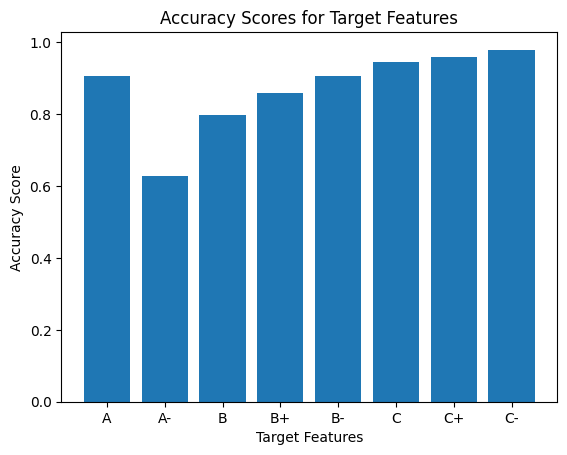

In [15]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['GPAA']

# Encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Initialize a list to store accuracy scores
accuracy_scores = []

# Iterate through each target feature
for feature in classes:
    # Select rows where GPAA matches the target feature
    y_feature = np.where(df["GPAA"] == feature, 1, 0)
    
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y_feature, test_size=0.3)
    
    # Create and train the logistic regression model
    model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    predictions = model.predict(X_test)
    
    # Calculate and store the accuracy score
    accuracy = model.score(X_test, y_test)
    accuracy_scores.append(accuracy)

# Plotting the accuracy scores
plt.bar(classes, accuracy_scores)
plt.xlabel('Target Features')
plt.ylabel('Accuracy Score')
plt.title('Accuracy Scores for Target Features')
plt.show()


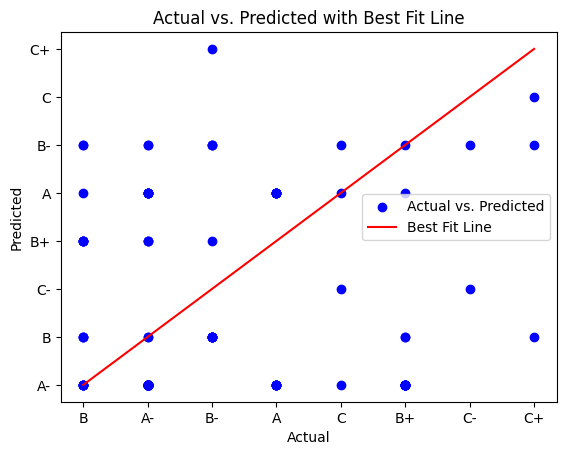

In [21]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df = df[df["GPAA"] != 'F']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['GPAA']
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3)
model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)
model.fit(X_train, y_train)
predictions = model.predict(X_test)
accuracy = model.score(X_test, y_test)

# Reverse label encoding for visualization
y_test_decoded = label_encoder.inverse_transform(y_test)
predictions_decoded = label_encoder.inverse_transform(predictions)

# Create scatter plot
plt.scatter(y_test_decoded, predictions_decoded, color='blue', label='Actual vs. Predicted')

# Create best fit line
x = np.linspace(0, len(classes)-1, len(classes))
y = x
plt.plot(x, y, color='red', label='Best Fit Line')

plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted with Best Fit Line')
plt.legend()
plt.show()


In [6]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix,confusion_matrix
cm=confusion_matrix(ytest,predict)
cm

array([[ 2, 12,  0,  0,  0,  0,  0,  0,  1],
       [ 3, 57,  0,  0,  0,  0,  0,  0,  3],
       [ 1,  8,  0,  0,  0,  1,  0,  0, 14],
       [ 0, 19,  0,  0,  1,  0,  0,  0,  5],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 14],
       [ 0,  2,  0,  0,  0,  0,  0,  0,  3],
       [ 0,  1,  0,  0,  0,  0,  0,  0,  5],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  2],
       [ 0, 12,  0,  0,  0,  0,  0,  1, 47]], dtype=int64)

In [7]:
from sklearn.metrics import classification_report, accuracy_score
print("Accuracy (global), using sklearn:", accuracy_score(ytest,predict))
print(classification_report(ytest,predict, digits=4))

Accuracy (global), using sklearn: 0.4953271028037383
              precision    recall  f1-score   support

           0     0.3333    0.1333    0.1905        15
           1     0.5135    0.9048    0.6552        63
           2     0.0000    0.0000    0.0000        24
           3     0.0000    0.0000    0.0000        25
           4     0.0000    0.0000    0.0000        14
           5     0.0000    0.0000    0.0000         5
           6     0.0000    0.0000    0.0000         6
           7     0.0000    0.0000    0.0000         2
           8     0.5000    0.7833    0.6104        60

    accuracy                         0.4953       214
   macro avg     0.1496    0.2024    0.1618       214
weighted avg     0.3147    0.4953    0.3774       214



C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
df.head()
#!pip install scikit_learn

In [ ]:
from sklearn import metrics
from sklearn.metrics import accuracy_score
print(metrics.classification_report(ytest,predict))

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv",encoding='latin1')
df.columns

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler,OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import label_binarize
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import chi2
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv",encoding='latin1')
X = df.drop(['Pass','GPA', 'GPAM', 'GPAA'], axis=1)
y = df['GPAA']
num = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1',
       'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy="mean")), ("scaler", StandardScaler())])
cat = ['School_From', 'Parent_Education']
categorical_transformer = Pipeline(    steps=[
        ("encoder", OneHotEncoder(handle_unknown="ignore")),
        ("selector", SelectPercentile(chi2, percentile=50)),    ])
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, num),
        ("cat", categorical_transformer, cat),    ])
preprocessor
clf = Pipeline(
    steps=[("preprocessor", preprocessor), ("classifier", DecisionTreeClassifier())])
clf
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
clf.fit(X_train, y_train)
print("model score: %.3f" % clf.score(X_test, y_test))
preds=clf.predict(X_test)
cm = confusion_matrix(y_test, preds)
print(cm)
from sklearn.metrics import classification_report, accuracy_score
print("Accuracy (global), using sklearn:", accuracy_score(y_test, preds))
print(classification_report(y_test, preds, digits=4))
labels = list(set(y_test))
labels.sort()
labels
print("Total labels: %s -> %s" % (len(labels), labels))
dff = pd.DataFrame(
    data=confusion_matrix(y_test, preds, labels=labels),columns=labels,index=labels )
dff
df=dff
#local                      #lg
tps = {}
fps = {}
fns = {}
precision_local = {}
recall_local = {}
f1_local = {}
accuracy_local = {}
for label in labels:
    tps[label] = df.loc[label, label]
    fps[label] = df[label].sum() - tps[label]
    fns[label] = df.loc[label].sum() - tps[label]
    tp, fp, fn = tps[label], fps[label], fns[label]    
    precision_local[label] = tp / (tp + fp) if (tp + fp) > 0. else 0.
    recall_local[label] = tp / (tp + fn) if (tp + fp) > 0. else 0.
    p, r = precision_local[label], recall_local[label]    
    f1_local[label] = 2. * p * r / (p + r) if (p + r) > 0. else 0.
    accuracy_local[label] = tp / (tp + fp + fn) if (tp + fp + fn) > 0. else 0.
print("#-- Local measures --#")
print("True Positives:", tps)
print("False Positives:", fps)
print("False Negatives:", fns)
print("Precision:", precision_local)
print("Recall:", recall_local)
print("F1-Score:", f1_local)
print("Accuracy:", accuracy_local)
clf

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler,OneHotEncoder
from sklearn.linear_model import LogisticRegression
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv",encoding='latin1')
X = df.drop(['Pass','GPA', 'GPAM', 'GPAA'], axis=1)
y = df['GPAA']
num = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1',
       'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy="mean")), ("scaler", StandardScaler())])
cat = ['School_From', 'Parent_Education']
categorical_transformer = Pipeline(    steps=[
        ("encoder", OneHotEncoder(handle_unknown="ignore")),
        ("selector", SelectPercentile(chi2, percentile=50)),    ])
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, num),
        ("cat", categorical_transformer, cat),    ])
preprocessor
clf = Pipeline(
    steps=[("preprocessor", preprocessor), ("classifier", RandomForestClassifier())])
clf
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
clf.fit(X_train, y_train)
print("model score: %.3f" % clf.score(X_test, y_test))
preds=clf.predict(X_test)
cm = confusion_matrix(y_test, preds)
print(cm)
from sklearn.metrics import classification_report, accuracy_score
print("Accuracy (global), using sklearn:", accuracy_score(y_test, preds))
print(classification_report(y_test, preds, digits=4))
labels = list(set(y_test))
labels.sort()
labels
print("Total labels: %s -> %s" % (len(labels), labels))
dff = pd.DataFrame(
    data=confusion_matrix(y_test, preds, labels=labels),columns=labels,index=labels )
dff
df=dff
#local                      #lg
tps = {}
fps = {}
fns = {}
precision_local = {}
recall_local = {}
f1_local = {}
accuracy_local = {}
for label in labels:
    tps[label] = df.loc[label, label]
    fps[label] = df[label].sum() - tps[label]
    fns[label] = df.loc[label].sum() - tps[label]
    tp, fp, fn = tps[label], fps[label], fns[label]    
    precision_local[label] = tp / (tp + fp) if (tp + fp) > 0. else 0.
    recall_local[label] = tp / (tp + fn) if (tp + fp) > 0. else 0.
    p, r = precision_local[label], recall_local[label]    
    f1_local[label] = 2. * p * r / (p + r) if (p + r) > 0. else 0.
    accuracy_local[label] = tp / (tp + fp + fn) if (tp + fp + fn) > 0. else 0.
print("#-- Local measures --#")
print("True Positives:", tps)
print("False Positives:", fps)
print("False Negatives:", fns)
print("Precision:", precision_local)
print("Recall:", recall_local)
print("F1-Score:", f1_local)
print("Accuracy:", accuracy_local)

In [ ]:
confusion_matrix(y_test,preds)

In [ ]:
clf.classes_

In [ ]:
confusion_matrix(y_test,preds,labels=('A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-'))

In [ ]:
class_index = 0 # index of class 'A' in the labels tuple
TP = cm[class_index, class_index]
FN = np.sum(cm[class_index, :]) - TP
FP = np.sum(cm[:, class_index]) - TP
TN = np.sum(cm) - TP - FN - FP
precision=tp/(tp+fn)
precision
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,fbeta_score,matthews_corrcoef
k = precision_score(y_test, preds, average='micro')
print("Precision score:",k)
print("reacall score:",recall_score(y_test, preds, average=None))
print("F1 score:",f1_score(y_test,preds, average=None))
print("Fbeta score:",fbeta_score(y_test,preds, average=None,beta=.5))
print("mathews score:",matthews_corrcoef(y_test,preds))

In [ ]:
y_test.value_counts()

In [ ]:
#conda update scikit-learn
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df)
sns.pairplot(df,x_vars=['Math'],y_vars='Eng',height=5,aspect=.7)

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df.columns

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, StackingClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['GPAA']
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
base_estimator = RandomForestClassifier()
rf_clf = RandomForestClassifier()
bagging_clf = BaggingClassifier(base_estimator=base_estimator, n_estimators=10, random_state=42)
boosting_clf = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=10, random_state=42)
stacking_clf = StackingClassifier(estimators=[('lr', RandomForestClassifier()), ('dt', RandomForestClassifier())],
                                  final_estimator=RandomForestClassifier())
voting_clf = VotingClassifier(estimators=[('bagging', bagging_clf),
                                          ('boosting', boosting_clf),
                                          ('stacking', stacking_clf),
                                          ('randomforest', rf_clf)],
                              voting='hard')
rf_clf.fit(X_train, y_train)
bagging_clf.fit(X_train, y_train)
boosting_clf.fit(X_train, y_train)
stacking_clf.fit(X_train, y_train)
voting_clf.fit(X_train, y_train)
bagging_preds = bagging_clf.predict(X_test)
boosting_preds = boosting_clf.predict(X_test)
stacking_preds = stacking_clf.predict(X_test)
voting_preds = voting_clf.predict(X_test)
rf_preds = rf_clf.predict(X_test)
bagging_acc = accuracy_score(y_test, bagging_preds)
boosting_acc = accuracy_score(y_test, boosting_preds)
stacking_acc = accuracy_score(y_test, stacking_preds)
voting_acc = accuracy_score(y_test, voting_preds)
rf_acc = accuracy_score(y_test, rf_preds)
print("Bagging accuracy score:", bagging_acc)
print("Boosting accuracy score:", boosting_acc)
print("Stacking accuracy score:", stacking_acc)
print("Voting accuracy score:", voting_acc)
print("Random forest accuracy score:", rf_acc)
visualizer_bagging = ROCAUC(bagging_clf)
visualizer_bagging.fit(X_train, y_train)
visualizer_bagging.score(X_test, y_test)
visualizer_bagging.show()
visualizer_boosting = ROCAUC(boosting_clf)
visualizer_boosting.fit(X_train, y_train)
visualizer_boosting.score(X_test, y_test)
visualizer_boosting.show()
visualizer_stacking = ROCAUC(stacking_clf)
visualizer_stacking.fit(X_train, y_train)
visualizer_stacking.score(X_test, y_test)
visualizer_stacking.show()
visualizer_voting = ROCAUC(rf_clf)
visualizer_voting.fit(X_train, y_train)
visualizer_voting.score(X_test, y_test)
visualizer_voting.show()

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.stats import skew
%matplotlib inline

In [ ]:
import matplotlib.pyplot as plt
plt.style.use("ggplot")
plt.rcParams['figure.figsize']=(12,10)
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv")
label_encoder=LabelEncoder()
df["GPAAA"]=label_encoder.fit_transform(df["GPAAA"])

In [ ]:
df.info()

In [ ]:
sns.pairplot(df,x_vars=["Plus","Math","Bio"],y_vars=["GPAAA"], height=5,aspect=1)

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
x=df[['SLC','Math','Physics']]
y=df[['GPAM']]#dependent
label_encoder=LabelEncoder()
df["GPAAA"]=label_encoder.fit_transform(df["GPAAA"])

In [ ]:
lr=LinearRegression()
lr.fit(x,y)
print(lr.intercept_)
print(lr.coef_)

In [ ]:
list(zip(['SLC'],lr.coef_))

In [ ]:
sns.heatmap(df.corr(),annot=True)

In [ ]:
#neural network
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd

In [ ]:
# Binary Classification with Sonar Dataset: Baseline
from pandas import read_csv
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
x=df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y=df['GPAA'].values 
print(x.shape)

In [ ]:
encoder = LabelEncoder()
encoder.fit(y)
encoded_Y = encoder.transform(y)
def create_baseline():
    model = Sequential()
    model.add(Dense(10, input_shape=(11,), activation='relu'))
    model.add(Dense(1, activation='sigmoid'))# Compile model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model
estimator = KerasClassifier(model=create_baseline, epochs=3, batch_size=5, verbose=0)
kfold = StratifiedKFold(n_splits=10, shuffle=True)
results = cross_val_score(estimator, x, encoded_Y, cv=kfold)
print("Baseline: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
estimators = []
estimators.append(('standardize', StandardScaler()))
estimators.append(('mlp', KerasClassifier(model=create_baseline, epochs=5, batch_size=5, verbose=0)))
pipeline = Pipeline(estimators)
kfold = StratifiedKFold(n_splits=10, shuffle=True)
results = cross_val_score(pipeline, x, encoded_Y, cv=kfold)
print("Standardized: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
model = Sequential()
model.add(Dense(20, input_dim=10, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
print(model.summary())

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD
from keras.utils import to_categorical
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
x=df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y=df['GPAA'].values 
encoder = LabelEncoder()
y = encoder.fit_transform(y)
y = to_categorical(y)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
model = Sequential()
model.add(Dense(64, input_dim=x.shape[1], activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(y.shape[1], activation='softmax'))
model.compile(loss='categorical_crossentropy',optimizer='adadelta',   metrics=['accuracy'])
model.fit(X_train, y_train,          epochs=20,          batch_size=16)
score = model.evaluate(X_test, y_test, batch_size=16)

In [ ]:
train_score = model.evaluate(X_train, y_train, verbose=0)
test_score = model.evaluate(X_test, y_test, verbose=0)
print("Train accuracy:", train_score[1])
print("Test accuracy:", test_score[1])
from sklearn.metrics import confusion_matrix
y_pred = model.predict(X_test)
y_pred = y_pred.argmax(axis=-1)
y_true = y_test.argmax(axis=-1)
cm = confusion_matrix(y_true, y_pred)
print(cm)
print(metrics.classification_report(y_test, y_pred))

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
x=df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y=df['GPAA'].values 
encoder = LabelEncoder()
y = encoder.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)
model = Sequential()
model.add(Dense(64, input_dim=x.shape[1], activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(loss='categorical_crossentropy',              optimizer='adadelta',              metrics=['accuracy'])
model.fit(X_train, y_train_cat,         epochs=20,          batch_size=16)
y_pred = model.predict(X_test)
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(encoder.classes_)):
    fpr[i], tpr[i], _ = roc_curve(y_test_cat[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
plt.figure()
for i in range(len(encoder.classes_)):
    plt.plot(fpr[i], tpr[i], lw=2, label='ROC curve (area = %0.2f)' % roc_auc[i])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\20233prog.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\20233prog.csv", encoding='latin1')
df.groupby(['Program'])['GPAA'].count().plot(kind='bar')
plt.title('Count of GPA by Program')
plt.xlabel('Program')
plt.ylabel('Count')
plt.show()
df.groupby(['ï»¿Faculty'])['GPAA'].count().plot(kind='bar')
plt.title('Count of GPA by Faculty')
plt.xlabel('Faculty')
plt.ylabel('Count')
plt.show()
#df = df[df["GPAA"] != 'F']
#df.dropna(subset=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus Two', 'Eng1',       'Math2', 'Phy/Acc', 'Che/Eco', 'Mixed', 'GPA', 'GPAM', 'GPAA','School From', 'Parent Education'], inplace=True)
#X = df.drop(['GPA','GPAM','GPAA'], axis=1)
#y = df['GPAA']

In [ ]:
import pandas as pd
import seaborn as sns
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\20233.csv", encoding='latin1')
sns.kdeplot(data=df, x='GPA', hue='GPAA', fill=True)
sns.despine()
plt.title('Density Plot of GPAA by Program')
plt.xlabel('GPAA')
plt.ylabel('Density')
plt.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, Binarizer
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectPercentile, chi2
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
df.dropna(subset=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco',
                 'Mixed', 'GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'], inplace=True)
num_features = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2']
cat_features = ['School_From', 'Parent_Education']
num_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())])
cat_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore', sparse=False)),
    ('selector', SelectPercentile(chi2, percentile=50))])
binarizer = Binarizer(threshold=3.5)
GPA_bin = binarizer.transform(df['GPA'].values.reshape(-1, 1))
GPA_bin_df = pd.DataFrame(GPA_bin, columns=['GPA_bin'])
df = pd.concat([df, GPA_bin_df], axis=1)
num_cat_features = num_features + cat_features + ['GPA_bin']
preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, num_features),
        ('cat', cat_transformer, cat_features),
        ('gpa', 'passthrough', ['GPA_bin'])     ])
preprocessor

In [ ]:
#ROC Curve for multiclass classification
#Classifier: Random Forest
#The dataset used in this tutorial is from this paper:
#Morang’a, C.M., Amenga–Etego, L., Bah, S.Y. et al. Machine learning approaches classify clinical malaria outcomes based on haematological parameters. BMC Med 18, 375 (2020). https://doi.org/10.1186/s12916-020-01823-3

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1') #uppp
df = df[df["GPAA"] != 'F']
df.tail()
df.columns

In [ ]:
#Imputer
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectPercentile, chi2
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1') #uppp
df = df[df["GPAA"] != 'F']
df.dropna(subset=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco', 'Mixed', 'GPA', 'GPAM', 'GPAA',
       'School_From', 'Parent_Education', 'Pass'], inplace=True)
num_features = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
cat_features = ['School_From', 'Parent_Education']
X = df.drop(['GPA','GPAM','GPAA'], axis=1)
y = df['GPAA']
num_imputer = SimpleImputer(strategy="mean")
X_num = num_imputer.fit_transform(X[num_features])
num_scaler = StandardScaler()
X_num_scaled = num_scaler.fit_transform(X_num)
df_num = pd.DataFrame(X_num_scaled, columns=num_features)
cat_encoder = OneHotEncoder(handle_unknown="ignore", sparse=False)
X_cat = cat_encoder.fit_transform(X[cat_features])
cat_feature_names = cat_encoder.get_feature_names_out(cat_features)
df_cat = pd.DataFrame(X_cat, columns=cat_feature_names) 
cat_imputer = SimpleImputer(strategy="most_frequent")
X_cat_imputed = cat_imputer.fit_transform(X[cat_features])
X_cat_imputed_encoded = cat_encoder.transform(X_cat_imputed)
df_cat_imputed_encoded = pd.DataFrame(X_cat_imputed_encoded, columns=cat_feature_names) 
cat_selector = SelectPercentile(chi2, percentile=50)
X_cat_selected = cat_selector.fit_transform(X_cat_imputed_encoded, y)
selected_cat_feature_names = [cat_feature_names[i] for i in cat_selector.get_support(indices=True)]
df_cat_selected = pd.DataFrame(X_cat_selected, columns=selected_cat_feature_names)
df_transformed = pd.concat([df_num, df_cat_imputed_encoded, df_cat_selected], axis=1)
df_transformed['GPAA'] = y
print(df_transformed.columns.duplicated())
df_transformed = df_transformed.loc[:, ~df_transformed.columns.duplicated()]
df_transformed = df_transformed.iloc[:, 1:]
df_transformed.head()
dff = df_transformed.dropna(subset=['GPAA'])
dff.to_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv",index=True)
dff.tail()

In [ ]:
import pandas as pd        
import numpy as np         
import matplotlib.pyplot as plt   
import seaborn as sns
from yellowbrick.target import class_balance
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\20233.csv", encoding='latin1') #uppp
df = df[df["GPAA"] != 'F']
df.isnull().sum()
df.head()
X=dff
y=df['GPAA']
df['GPAA'].value_counts().plot.bar()

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df.columns

In [ ]:
import matplotlib.pyplot as plt
from yellowbrick.datasets import load_credit
from yellowbrick.target import ClassBalance
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
x=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
y=df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C+', 'C', 'C-']
visualizer = ClassBalance(labels=classes)
visualizer.fit(y)
visualizer.show()

In [ ]:
#d#f.corr()
df.iloc[:,0:].describe().transpose()

In [ ]:
print(df.columns)
print(df.info())
print(df.isnull().sum())
df.dropna(inplace=True)

In [ ]:
df['GPAA'].unique()
df['GPAA'].value_counts()
#print(df['GPAA'].value_counts().sum())

In [ ]:
#X=df.iloc[:,0:12] #y=df.iloc[:,12:13]
ax = y.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Over-sampling")

In [ ]:
#upsampling
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(sampling_strategy="not majority") # String
X_res, y_res = ros.fit_resample(X, y)
print("upsampling X",X_res.shape)
print("upsampling Y",y_res.shape)
ax = y_res.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Over-sampling")

In [ ]:
#under sampling
from imblearn.under_sampling import RandomUnderSampler
#rus = RandomUnderSampler(sampling_strategy=1) # Numerical value
rus = RandomUnderSampler(sampling_strategy="not minority") # String
X_res, y_res = rus.fit_resample(X, y)
print("downsampling X",X_res.shape)
print("downsampling Y",y_res.shape)
ax = y_res.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Under-sampling")

In [ ]:
#Upsampling Random forest  1
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df['GPAA']
classes = Y.unique()
max_class_count = max(Y.value_counts())
# Upsample underrepresented classes to match maximum count
for c in classes:
    c_count = Y.value_counts()[c]
    if c_count < max_class_count:
        class_indices = Y[Y == c].index
        upsampled_indices = resample(class_indices, replace=True, n_samples=max_class_count-c_count)
        X = pd.concat([X, X.loc[upsampled_indices]])
        Y = pd.concat([Y, Y.loc[upsampled_indices]])
label_encoder = LabelEncoder()
label_encoder.fit(Y)
Y = label_encoder.transform(Y)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
RF = OneVsRestClassifier(RandomForestClassifier(max_features=0.2))
RF.fit(X_train_norm, y_train)
y_pred = RF.predict(X_test_norm)
pred_prob = RF.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred) # convert predicted labels to original class labels
y_test = label_encoder.inverse_transform(y_test) # convert actual labels to original class labels
def sort_classes(classes):
    def get_num(label):
        try:
            return int(label.split('_')[1])
        except IndexError:
            return -1 # handle class labels that don't contain an underscore and integer
    return sorted(classes, key=get_num)
classes_sorted = sort_classes(classes)
y_test_cat = pd.Categorical(y_test, categories=classes_sorted)
y_pred_cat = pd.Categorical(y_pred, categories=classes_sorted)
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes_sorted))

In [ ]:
#OverSampling Random forest ROC
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df['GPAA'].values 
label_encoder = LabelEncoder()
Y = label_encoder.fit_transform(Y)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.transform(X_test)
ros = RandomOverSampler(random_state=0)
X_train_norm, y_train = ros.fit_resample(X_train_norm, y_train)
RF = OneVsRestClassifier(RandomForestClassifier(max_features=0.2))
RF.fit(X_train_norm, y_train)
y_pred = RF.predict(X_test_norm)
pred_prob = RF.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
roc_auc = {}
for i in range(n_class):    
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
def sort_classes(classes):
    def get_num(label):
        try:
            return int(label.split('_')[1])
        except IndexError:
            return -1 # handle class labels that don't contain an underscore and integer
    return sorted(classes, key=get_num)
classes_sorted = sort_classes(classes)
y_test_cat = pd.Categorical(y_test, categories=classes_sorted)
y_pred_cat = pd.Categorical(y_pred, categories=classes_sorted)
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes_sorted))

In [ ]:
X_train_norm.shape, y_train.shape

In [ ]:
#This is required by scikit learn when dealing with categorical data. #Lets encode target labels (y) with values between 0 and n_classes-1.
#We will use the LabelEncoder to do this.  Grade Multiclass  #Sefault samplingimport pandas as pdimport pandas as pd
import pandas as pd
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
level = ['A', 'A-', 'B', 'B+', 'B-', 'C+','C','C-']
label_encoder = LabelEncoder()
label_encoder.fit(level)
Y = label_encoder.transform(df['GPAA'])
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.transform(X_test)
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_norm, y_train)
y_pred = rf.predict(X_test_norm)
pred_prob = rf.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh = {}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
def sort_classes(classes):
    def get_num(label):
        try:
            return int(label.split('_')[1])
        except IndexError:
            return -1 # handle class labels that don't contain an underscore and integer
    return sorted(classes, key=get_num)
classes_sorted = sort_classes(classes)
y_test_cat = pd.Categorical(y_test, categories=classes_sorted)
y_pred_cat = pd.Categorical(y_pred, categories=classes_sorted)
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes_sorted))

In [ ]:
# down sampling classes to match maximum count  RF
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df['GPAA']
classes = Y.unique()
max_class_count = max(Y.value_counts())
for c in classes:
    c_count = Y.value_counts()[c]
    if c_count < max_class_count:
        class_indices = Y[Y == c].index
        downsampled_indices = resample(class_indices, replace=True, n_samples=max_class_count-c_count)
        X = pd.concat([X, X.loc[downsampled_indices]])
        Y = pd.concat([Y, Y.loc[downsampled_indices]])
label_encoder = LabelEncoder()
label_encoder.fit(Y)
Y = label_encoder.transform(Y)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
RF = OneVsRestClassifier(RandomForestClassifier(max_features=0.2))
RF.fit(X_train_norm, y_train)
y_pred = RF.predict(X_test_norm)
pred_prob = RF.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred) # convert predicted labels to original class labels
y_test = label_encoder.inverse_transform(y_test) # convert actual labels to original class labels
def sort_classes(classes):
    def get_num(label):
        try:
            return int(label.split('_')[1])
        except IndexError:
            return -1 # handle class labels that don't contain an underscore and integer
    return sorted(classes, key=get_num)
classes_sorted = sort_classes(classes)
y_test_cat = pd.Categorical(y_test, categories=classes_sorted)
y_pred_cat = pd.Categorical(y_pred, categories=classes_sorted)
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes_sorted))

In [ ]:
X_train.shape, y_train.shape

In [ ]:
#under  Sampler to balance the classes in training data RF
import pandas as pd
import numpy as np
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, classification_report
from sklearn.utils import resample
from imblearn.under_sampling import RandomUnderSampler
import seaborn as sns
import matplotlib.pyplot as plt
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C+','C','C-']
rus = RandomUnderSampler(random_state=0)
X_resampled, Y_resampled = rus.fit_resample(X, Y)
label_encoder = LabelEncoder()
Y_resampled_encoded = label_encoder.fit_transform(Y_resampled)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X_resampled, Y_resampled_encoded, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.transform(X_test)
RF = OneVsRestClassifier(RandomForestClassifier(max_features=0.4))
RF.fit(X_train_norm, y_train)
y_pred = RF.predict(X_test_norm)
pred_prob = RF.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh = {}
roc_auc = {}
for i in range(n_class - 1):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    if np.isnan(roc_auc[i]):
        roc_auc[i] = 0.0
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
def sort_classes(classes):
    def get_num(label):
        try:
            return int(label.split('_')[1])
        except IndexError:
            return -1
    return sorted(classes, key=get_num)
classes_sorted = sort_classes(classes)
y_test_cat = pd.Categorical(y_test, categories=classes_sorted)
y_pred_cat = pd.Categorical(y_pred, categories=classes_sorted)
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes_sorted))

In [ ]:
X_train.shape, y_train.shape

In [ ]:
#Down Sampling samplin SVM
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df['GPAA']
classes = Y.unique()
max_class_count = max(Y.value_counts())
for c in classes:
    c_count = Y.value_counts()[c]
    if c_count < max_class_count:
        class_indices = Y[Y == c].index
        downsampled_indices = resample(class_indices, replace=True, n_samples=max_class_count-c_count)
        X = pd.concat([X, X.loc[downsampled_indices]])
        Y = pd.concat([Y, Y.loc[downsampled_indices]])
label_encoder = LabelEncoder()
label_encoder.fit(Y)
Y = label_encoder.transform(Y)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
RF = OneVsRestClassifier(SVC(kernel='linear', probability=True))
RF.fit(X_train_norm, y_train)
y_pred = RF.predict(X_test_norm)
pred_prob = RF.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred) # convert predicted labels to original class labels
y_test = label_encoder.inverse_transform(y_test) # convert actual labels to original class labels
def sort_classes(classes):
    def get_num(label):
        try:
            return int(label.split('_')[1])
        except IndexError:
            return -1 # handle class labels that don't contain an underscore and integer
    return sorted(classes, key=get_num)
classes_sorted = sort_classes(classes)
y_test_cat = pd.Categorical(y_test, categories=classes_sorted)
y_pred_cat = pd.Categorical(y_pred, categories=classes_sorted)
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes_sorted))

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1') #uppp
df.columns

In [ ]:
#underRF2
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import classification_report, confusion_matrix
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1') #uppp
df = df[df["GPAA"] != 'F']
df.dropna(subset=['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco', 'Mixed', 'GPA', 'GPAM', 'GPAA',
       'School_From', 'Parent_Education', 'Pass'], inplace=True)
X = df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'], axis=1)
Y = df['GPAA']
label_encoder = LabelEncoder()
label_encoder.fit(Y)
Y = label_encoder.transform(Y)
classes = label_encoder.classes_
rus = RandomUnderSampler(random_state=42)
X_resampled, Y_resampled = rus.fit_resample(X, Y)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, Y_resampled, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
RF = OneVsRestClassifier(RandomForestClassifier(max_features=0.2))
RF.fit(X_train_norm, y_train)
y_pred = RF.predict(X_test_norm)
pred_prob = RF.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
def sort_classes(classes):
    def get_num(label):
        try:
            return int(label.split('_')[1])
        except IndexError:
            return -1 
    return sorted(classes, key=get_num)
classes_sorted = sort_classes(classes)
y_test_cat = pd.Categorical(y_test, categories=classes_sorted)
y_pred_cat = pd.Categorical(y_pred, categories=classes_sorted)
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes_sorted))

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv",encoding='latin1') #uppp
df.columns

In [ ]:
#SVM  Normal
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv",encoding='latin1') #uppp
df = df[df["GPAA"] != 'F']
df.dropna(subset=['Unnamed: 0', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1','Math2', 'Phy_Acc', 'Che_Eco', 'Mixed', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], inplace=True)
X = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df['GPAA']
df.isnull().sum()
level = ['A', 'A-', 'B', 'B+', 'B-', 'C+','C','C-']
label_encoder = LabelEncoder()
label_encoder.fit(level)
Y = label_encoder.transform(df['GPAA'])
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.4)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
svm = SVC(kernel='linear', probability=True)
svm.fit(X_train_norm, y_train)
y_pred = svm.predict(X_test_norm)
pred_prob = svm.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh = {}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
cm = confusion_matrix(y_test, y_pred, labels=level)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=level, yticklabels=level)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=level))

In [ ]:
# SVM over sampling
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from imblearn.over_sampling import RandomOverSampler
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
df.isnull().sum()
level = ['A', 'A-', 'B', 'B+', 'B-', 'C+','C','C-']
label_encoder = LabelEncoder()
label_encoder.fit(level)
Y = label_encoder.transform(df['GPAA'])
classes = label_encoder.classes_
X=df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.4)
oversampler = RandomOverSampler(random_state=42)
X_train, y_train = oversampler.fit_resample(X_train, y_train)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
svm = SVC(kernel='linear', probability=True)
svm.fit(X_train_norm, y_train)
y_pred = svm.predict(X_test_norm)
pred_prob = svm.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(Y))
fpr = {}
tpr = {}
thresh = {}
roc_auc = dict()
for i in range(n_class):
    if np.sum(y_test_binarized[:, i]) > 1:
        fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        plt.plot(fpr[i], tpr[i], linestyle='--', label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
cm = confusion_matrix(y_test, y_pred, labels=level)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=level, yticklabels=level)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=level))

In [ ]:
#SVM undersampler
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from imblearn.under_sampling import RandomUnderSampler
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
df.isnull().sum()
level = ['A', 'A-', 'B', 'B+', 'B-', 'C+','C','C-']
label_encoder = LabelEncoder()
label_encoder.fit(level)
Y = label_encoder.transform(df['GPAA'])
classes = label_encoder.classes_
X = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
undersampler = RandomUnderSampler(random_state=42)
X_train, y_train = undersampler.fit_resample(X_train, y_train)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
svm = SVC(kernel='linear', probability=True)
svm.fit(X_train_norm, y_train)
y_pred = svm.predict(X_test_norm)
pred_prob = svm.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(Y))
fpr = {}
tpr = {}
thresh = {}
roc_auc = dict()
for i in range(n_class):
    if np.sum(y_test_binarized[:, i]) > 1 and np.sum(pred_prob[:, i]) > 1:
        fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        plt.plot(fpr[i], tpr[i], linestyle='--', label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
cm = confusion_matrix(y_test, y_pred, labels=level)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=level, yticklabels=level)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=level))

In [ ]:
# Resample underrepresented classes to match maximum count  SVM
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
df.isnull().sum()
level = ['A', 'A-', 'B', 'B+', 'B-', 'C+','C','C-']
label_encoder = LabelEncoder()
label_encoder.fit(level)
Y = label_encoder.transform(df['GPAA'])
classes = label_encoder.classes_
X = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df["GPAA"]
classes = Y.unique()
max_class_count = max(Y.value_counts())
for c in classes:
    c_count = Y.value_counts()[c]
    if c_count < max_class_count:
        class_indices = Y[Y == c].index
        downsampled_indices = resample(class_indices, replace=True, n_samples=max_class_count-c_count)
X = pd.concat([X, X.loc[downsampled_indices]])
Y = pd.concat([Y, Y.loc[downsampled_indices]])
label_encoder = LabelEncoder()
label_encoder.fit(Y)
Y = label_encoder.transform(Y)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
SVM = OneVsRestClassifier(SVC(probability=True))
SVM.fit(X_train_norm, y_train)
y_pred = SVM.predict(X_test_norm)
pred_prob = SVM.predict_proba(X_test_norm)
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:, i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
y_pred = label_encoder.inverse_transform(y_pred) # convert predicted labels to original class labels
y_test = label_encoder.inverse_transform(y_test) # convert actual labels to original class labels
def sort_classes(classes):
    def get_num(label):
        try:
            return int(label.split('_')[1])
        except IndexError:
            return -1 # handle class labels that don't contain an underscore and integer
        return sorted(classes, key=get_num)
classes_sorted = sort_classes(classes)
y_test_cat = pd.Categorical(y_test, categories=classes_sorted)
y_pred_cat = pd.Categorical(y_pred, categories=classes_sorted)
cm = pd.crosstab(y_test_cat, y_pred_cat, rownames=['Actual'], colnames=['Predicted'])
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=level, yticklabels=level)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=level))

In [ ]:
#NearMiss random forest model 
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report
from imblearn.under_sampling import NearMiss
from sklearn.svm import SVC
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
level = ['A', 'A-', 'B', 'B+', 'B-', 'C+','C','C-']
X = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df["GPAA"]
classes = np.unique(Y)
n_samples = dict(zip(classes, [len(Y[Y==c]) for c in classes]))
nm = NearMiss(version=3, sampling_strategy=n_samples, n_neighbors=3)
X, Y = nm.fit_resample(X, Y)
label_encoder = LabelEncoder()
label_encoder.fit(Y)
Y = label_encoder.transform(Y)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.fit_transform(X_test)
clf = OneVsRestClassifier(RandomForestClassifier(max_features=0.2))
clf.fit(X_train_norm, y_train)
y_pred = clf.predict(X_test_norm)
pred_prob = clf.predict_proba(X_test_norm)
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test == classes[i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
cm = confusion_matrix(y_test, y_pred, labels=classes)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes))

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
# Nearmiss SVM
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report
from imblearn.under_sampling import NearMiss
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\20233.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['GPA', 'GPAM', 'GPAA','School From', 'Parent Education'], axis=1)
Y = df['GPAA']
classes = np.unique(Y)
n_samples = dict(zip(classes, [len(Y[Y==c]) for c in classes]))
nm = NearMiss(version=3, sampling_strategy=n_samples, n_neighbors=3)
X, Y = nm.fit_resample(X, Y)
label_encoder = LabelEncoder()
label_encoder.fit(Y)
Y = label_encoder.transform(Y)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.transform(X_test)
clf = OneVsRestClassifier(SVC(probability=True))
clf.fit(X_train_norm, y_train)
y_pred = clf.predict(X_test_norm)
pred_prob = clf.predict_proba(X_test_norm)
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test == classes[i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
cm = confusion_matrix(y_test, y_pred, labels=classes)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes))

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelBinarizer, StandardScaler
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
from sklearn.neural_network import MLPClassifier
from keras.utils import np_utils
plt.style.use('ggplot')
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'], axis=1)
y = df['GPAA']
encoder = LabelBinarizer()
y = encoder.fit_transform(y)
y = np.squeeze(y)  # Convert y to a 1-dimensional array
scaler = StandardScaler()
X = scaler.fit_transform(X)
y_binary = np.where(y <= 2, 0, 1)
X_train, X_test, y_train, y_test = train_test_split(X, y_binary, test_size=0.2, random_state=0)
mlpc = MLPClassifier(random_state=0)
mlpc.fit(X_train, y_train)
y_pred = mlpc.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
f1_weighted = f1_score(y_test, y_pred, average='weighted')
print("Accuracy:", accuracy)
print("f1_weighted:", f1_weighted)

In [ ]:
#Cross Validation Process Parameters for CV created in dictionary structure # INFORMATION ABOUT THE INPUTED PARAMETERS
# alpha: float, default = 0.0001 L2 penalty (regularization term) parameter. (penalty parameter)   
mlpc_params = {"alpha": [0.1, 0.01, 0.0001],
              "hidden_layer_sizes": [(10,10,10), (100,100,100)],
              "solver" : ["lbfgs","adam","sgd"],
              "activation": ["relu","logistic"]}
from sklearn.model_selection import GridSearchCV
mlpc = MLPClassifier(random_state = 0) # ANN model object created
mlpc_cv_model = GridSearchCV(mlpc, mlpc_params, 
                         cv = 3, # To make a 5-fold CV
                         n_jobs = -1, # Number of jobs to be run in parallel (-1: means to use all processors)
                         verbose = 2) # Controls the level of detail: higher means more messages gets value as integer.
mlpc_cv_model.fit(X_train, y_train) 
print("The best parameters: " + str(mlpc_cv_model.best_params_))

In [ ]:
mlpc_tuned = mlpc_cv_model.best_estimator_
mlpc_tuned.fit(X_train, y_train)

In [ ]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kf = KFold(shuffle=True, n_splits=5) # To make a 5-fold CV
cv_results_kfold = cross_val_score(mlpc_tuned, X_test, np.argmax(y_test, axis=1), cv=kf, scoring= 'f1_weighted')
print("K-fold Cross Validation f1_weigted Results: ",cv_results_kfold)
print("K-fold Cross Validation f1_weigted Results Mean: ",cv_results_kfold.mean())
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
kf = KFold(shuffle=True, n_splits=5) # To make a 5-fold CV
cv_results_kfold = cross_val_score(mlpc_tuned, X_test, np.argmax(y_test, axis=1), cv=kf, scoring= 'accuracy')
print("K-fold Cross Validation accuracy Results: ",cv_results_kfold)
print("K-fold Cross Validation accuracy Results Mean: ",cv_results_kfold.mean())

In [ ]:
y_pred = mlpc_tuned.predict(X_test)

In [ ]:
import sklearn.metrics as metrics
print("f1_weighted:",metrics.f1_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1),average='weighted'))
print("accuracy:",metrics.accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1)))
from sklearn.metrics import confusion_matrix, classification_report
model_report = classification_report(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
print(model_report)
model_conf = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
print(model_conf)

In [ ]:
from scipy import interp
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
n_classes = 7 # number of class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_pred[:, i], )
    roc_auc[i] = auc(fpr[i], tpr[i])
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

In [ ]:
plt.figure()
lw = 2 # line_width
plt.plot(fpr[2], tpr[2], color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2]) # Drawing Curve according to 3. class 
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Eğrisi')
plt.legend(loc="lower right")
plt.show()

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
df.columns

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report
from imblearn.under_sampling import NearMiss
import seaborn as sns
import matplotlib.pyplot as plt
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y=df['GPAA']
classes = np.unique(Y)
n_samples = dict(zip(classes, [len(Y[Y == c]) for c in classes]))
nm = NearMiss(version=3, sampling_strategy=n_samples, n_neighbors=3)
X, Y = nm.fit_resample(X, Y)
label_encoder = LabelEncoder()
label_encoder.fit(Y)
Y = label_encoder.transform(Y)
classes = label_encoder.classes_
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
min_max_scaler = MinMaxScaler()
X_train_norm = min_max_scaler.fit_transform(X_train)
X_test_norm = min_max_scaler.transform(X_test)
mlp = MLPClassifier(random_state=0)
mlp.fit(X_train_norm, y_train)
y_pred = mlp.predict(X_test_norm)
pred_prob = mlp.predict_proba(X_test_norm)
y_pred = label_encoder.inverse_transform(y_pred)
y_test = label_encoder.inverse_transform(y_test)
fpr = {}
tpr = {}
thresh = {}
roc_auc = {}
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test == classes[i], pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)' % (classes[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'b--')
plt.xlim([0, 1])
plt.ylim([0, 1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()
cm = confusion_matrix(y_test, y_pred, labels=classes)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
print(classification_report(y_test, y_pred, target_names=classes))

In [ ]:
#This is required by scikit learn when dealing with categorical data.
#Lets encode target labels (y) with values between 0 and n_classes-1.#We will use the LabelEncoder to do this.  Grade Multiclass  Number encoded
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv")
X=df.drop(['GPAM','Pf','Result','pff','GPAAA','Churn'],axis=1)
label_encoder=LabelEncoder()
df["GPAAA"]=label_encoder.fit_transform(df["GPAAA"])
Y=df['GPAAA'] 
from sklearn.preprocessing import LabelEncoder
label_encoder=LabelEncoder()
label_encoder.fit(Y)
Y=label_encoder.transform(Y)
classes=label_encoder.classes_
X_train,X_test,y_train,y_test=train_test_split(X,Y,test_size=0.3)
from sklearn.preprocessing import MinMaxScaler
min_max_scaler=MinMaxScaler()
X_train_norm=min_max_scaler.fit_transform(X_train)
X_test_norm=min_max_scaler.fit_transform(X_test)
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve,auc
RF=OneVsRestClassifier(RandomForestClassifier(max_features=0.2))
RF.fit(X_train_norm,y_train)
y_pred =RF.predict(X_test_norm)
pred_prob = RF.predict_proba(X_test_norm)
from sklearn.preprocessing import label_binarize
y_test_binarized=label_binarize(y_test,classes=np.unique(y_test))
fpr = {}
tpr = {}
thresh ={}
roc_auc = dict()
n_class = classes.shape[0]
for i in range(n_class-1):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], linestyle='--', 
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))
plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
X=df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master', 
           'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1)
Y = df['GPAA']
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3)
clf = SVC(kernel='linear')
clf.fit(X_train, y_train)
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
cm = confusion_matrix(y_test, y_test_pred)
cm_df = pd.DataFrame(cm,
                     index=['A-', 'B+', 'A',  'B-', 'B', 'C', 'C+','C-'],
                     columns=['A-', 'B+', 'A', 'B-', 'B', 'C', 'C+','C-'])
plt.figure(figsize=(6, 5))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

In [ ]:
plt.figure(figsize=(5,4))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

In [ ]:
from sklearn import datasets
from yellowbrick.target import FeatureCorrelation
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
features = ['SLC', 'Plus', 'Physics','Math','Bio','Chemistry']

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
from sklearn import datasets
from yellowbrick.target import FeatureCorrelation
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X=df.drop([ 'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
y=df['Pass'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
features = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
visualizer = FeatureCorrelation(labels=features)
visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.show() 

In [ ]:
!pip install --upgrade yellowbrick

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from yellowbrick.features import FeatureImportances
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X=df.drop([ 'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
y=df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
fig, axes = plt.subplots(2, 2)
model = LogisticRegression()
visualgrid = [    FeatureImportances(model, ax=axes[0][0]),
    ConfusionMatrix(model, ax=axes[0][1]),
    ClassificationReport(model, ax=axes[1][0]),
    ROCAUC(model, ax=axes[1][1])]
for viz in visualgrid:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)
    viz.finalize()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from yellowbrick.features import FeatureImportances
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X = df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
fig, axes = plt.subplots(2, 2)
model = SVC()
visualgrid = [
FeatureImportances(model, ax=axes[0][0]),
ConfusionMatrix(model, ax=axes[0][1]),
ClassificationReport(model, ax=axes[1][0]),
ROCAUC(model, ax=axes[1][1])]
for viz in visualgrid:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)
    viz.finalize()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from yellowbrick.features import FeatureImportances
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X=df.drop([ 'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
y=df['Pass'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
fig, axes = plt.subplots(2, 2)
model = LogisticRegression()
visualgrid = [    FeatureImportances(model, ax=axes[0][0]),
    ConfusionMatrix(model, ax=axes[0][1]),
    ClassificationReport(model, ax=axes[1][0]),
    ROCAUC(model, ax=axes[1][1])]
for viz in visualgrid:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)
    viz.finalize()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.inspection import permutation_importance
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X = df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'], axis=1).values
y = df['Pass'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
fig, axes = plt.subplots(2, 2)
model = SVC()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")
result = permutation_importance(model, X_train, y_train, n_repeats=10, random_state=42)
feature_importances = result.importances_mean
visualgrid = [
    ConfusionMatrix(model, ax=axes[0][1]),
    ClassificationReport(model, ax=axes[1][0]),
    ROCAUC(model, ax=axes[1][1]) ]
for viz in visualgrid:
    viz.fit(X_train, y_train)
plt.subplot(2, 2, 1)
plt.bar(df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'], axis=1).columns, feature_importances)
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

In [ ]:
from yellowbrick.datasets import load_game
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.classifier import class_prediction_error
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X=df.drop([ 'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
y=df['GPAA'].values
X = OneHotEncoder().fit_transform(X)
visualizer = class_prediction_error( RandomForestClassifier(n_estimators=10), X, y)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from yellowbrick.regressor import PredictionError
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'], axis=1)
Y = df['GPAA']  
label_encoder = LabelEncoder()
Y = label_encoder.fit_transform(Y)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
model = PredictionError(LinearRegression())
model.fit(X_train, y_train)
score = model.score(X_test, y_test)
print("Model score:", score)
model.finalize()
model.ax.set_xlabel("measured concrete strength")
model.ax.set_ylabel("predicted concrete strength")
plt.savefig("peplot.pdf")

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from yellowbrick.regressor import PredictionError
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
visualizers = [
    ClassificationReport(rfc, classes=classes),
    ConfusionMatrix(rfc, classes=classes),]
for viz in visualizers:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)
    viz.show()

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from yellowbrick.regressor import PredictionError
import pandas as pd
from yellowbrick.classifier import ClassificationReport, ConfusionMatrix
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
svm = SVC()
svm.fit(X_train, y_train)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
visualizers = [ClassificationReport(svm, classes=classes),
ConfusionMatrix(svm, classes=classes),]
for viz in visualizers:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)
    viz.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from yellowbrick.classifier import ClassificationReport
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model = RandomForestClassifier(n_estimators=10, criterion='entropy')
visualizer = ClassificationReport(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.finalize()
plt.savefig("classification_report.png")

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from yellowbrick.regressor import PredictionError
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model = RandomForestRegressor(n_estimators=100)
visualizer = PredictionError(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.finalize()
visualizer.show()

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from yellowbrick.regressor import PredictionError
from sklearn.neighbors import KNeighborsRegressor
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
model = KNeighborsRegressor(n_neighbors=5)
visualizer = PredictionError(model)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.finalize()
visualizer.show()

In [ ]:
from yellowbrick.features import parallel_coordinates
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA']
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
visualizer = parallel_coordinates(X, y, normalize="standard")

In [ ]:
from yellowbrick.datasets import load_game
from yellowbrick.target import class_balance
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA'].values
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
visualizer = class_balance(y, labels=classes)

In [ ]:
import pandas as pd
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv")
df.head()

In [ ]:
import lazypredict
import sklearn
from lazypredict.Supervised import LazyClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
data = load_breast_cancer()
X = data.data
y= data.target
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=.5,random_state =123)
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
models
predictions

In [ ]:
#!pip install lazypredict
#conda install -c conda-forge xgboost
#conda install -c conda-forge lightgbm
#!pip uninstall scikit-learn -y
#!pip install scikit-learn==0.24
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
#Execution time Many model accuracy Lazy # Import libraries
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
x=df.drop(['GPA', 'GPAM', 'GPAA','School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['Pass']     # needs to be 1 0 otherwise ROC  Non
X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=.2,random_state =42)
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models_train,predictions_train = clf.fit(X_train, X_train, y_train, y_train)
models_test,predictions_test = clf.fit(X_train, X_test, y_train, y_test)
models_train

In [ ]:
models_test

In [ ]:
grid_results = pd.concat([pd.DataFrame(models_train),pd.DataFrame(models_test)],axis=1)
grid_results.head()

In [ ]:
grid_results.to_csv("C:\\Users\\Rimal\\Desktop\\BE\\grid_results.csv",index=True)#models_train['Accuracy']

In [ ]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\grid_results.csv")
df.head() 

In [ ]:
def f(x, y): 
    return np.sin(x) ** 10 + np.cos(10 + y * x) * np.cos(x)
x = df['Accuracy'].values 
y = df['Accuracy.1'].values 
x = np.linspace(54, 97, 90) 
y = np.linspace(44, 72, 70) 
X, Y = np.meshgrid(x, y) 
Z = f(X, Y) 
plt.contour(X, Y, Z, colors='black') 
plt.contour(X, Y, Z, 20, cmap='RdGy')

In [ ]:
plt.contourf(X, Y, Z, 50, cmap='RdGy')
plt.colorbar()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
fig = plt.subplots(figsize=(20, 5))
sns.lineplot(x='Model', y='Accuracy.1', data=df, marker='*', markerfacecolor='limegreen', markersize=20).set(title='Accuracy Score', xlabel='Model', ylabel='Percentage')
sns.set_theme(style='white', font_scale=3)

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\grid_results.csv")
df.head()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model
%matplotlib inline
#df.drop(['Balanced Accuracy'],inplace=True,axis=1)
df=pd.DataFrame(df)
#table = pd.pivot_table(data=df,index=['Model','Accuracy','F1 Score','ROC AUC'],values=['Time Taken'], aggfunc=np.mean).rename(columns={'Model':'Accuracy':'F1 Score':'ROC AUC':'Time Taken'})
table = pd.pivot_table(data=df, index=['Model','Accuracy','Balanced Accuracy','ROC AUC','F1 Score','Time Taken','Accuracy.1','Balanced Accuracy.1','ROC AUC.1','F1 Score.1','Time Taken.1'])
table=pd.DataFrame(table)
df.groupby('Accuracy')[['Model']].mean()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.barplot(x = 'Time Taken',y = 'F1 Score.1',data = df)
plt.show()

In [ ]:
df.head()

In [ ]:
df = pd.DataFrame(df)
df['Time Taken'].tolist()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
species = ("Accuracy", "ROCAUC", "F1")
penguin_means = {
    'RandomForestClassifier': (97,97,97),
    'AdaBoostClassifier': (79,78,79),
    'LogisticRegression': (61,58,59),
    'DummyClassifier': (50,50,41)}
x = np.arange(len(species))  # the label locations
width = 30 # the width of the bars
multiplier = 0
fig, ax = plt.subplots(layout='constrained')
for attribute, measurement in penguin_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1
ax.set_ylabel('Length (mm)')
ax.set_title('Training Accuracy Score')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 100)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
species = ("Accuracy", "ROCAUC", "F1")
penguin_means = {
    'RandomForestClassifier': (58,57,59),
    'AdaBoostClassifier': (63,60,61),
    'LogisticRegression': (50,51,47),
    'DummyClassifier': (50,51,33)}
x = np.arange(len(species))  # the label locations
width = 20 # the width of the bars
multiplier = 0
fig, ax = plt.subplots(layout='constrained')
for attribute, measurement in penguin_means.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=5)
    multiplier += 1
ax.set_ylabel('Length (mm)')
ax.set_title('Testing Accuracy Score')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=2)
ax.set_ylim(0, 70)

In [ ]:
models_train

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 5))
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=models_train.index, y="Balanced Accuracy", data=models_train)
plt.xticks(rotation=90)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(5, 10))
sns.set_theme(style="whitegrid")
ax = sns.barplot(y=models_train.index, x="Balanced Accuracy", data=models_test)

In [ ]:
#pip uninstall scikit-learn -y
#pip install scikit-learn==0.23.1
#pip install lazypredict

In [ ]:
#! pip install lazypredict
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
data = load_breast_cancer()
X = data.data
y= data.target
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=.30,random_state =123)
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
from sklearn import datasets
import pandas as pd
import lazypredict
from lazypredict.Supervised import LazyClassifier
from lazypredict.Supervised import LazyRegressor
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
x=df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['Pass'].values
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y,test_size=.2,random_state =42)
reg = LazyRegressor(verbose=0,ignore_warnings=False, custom_metric=None)
models_train,predictions_train = reg.fit(X_train, X_train, y_train, y_train)
models_test,predictions_test = reg.fit(X_train, X_test, y_train, y_test)
models_train

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
#train["R-Squared"] = [0 if i < 0 else i for i in train.iloc[:,0] ]
plt.figure(figsize=(10, 5))
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=models_train.index, y="R-Squared", data=models_train)
ax.set(ylim=(0, 1))
plt.xticks(rotation=90)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
models_train["R-Squared"] = [0 if i < 0 else i for i in models_train.iloc[:,0] ]
plt.figure(figsize=(5, 10))
sns.set_theme(style="whitegrid")
ax = sns.barplot(y=models_train.index, x="R-Squared", data=models_train)
ax.set(xlim=(0, 1))

In [ ]:
models_dict = reg.provide_models(X_train, X_train, y_train, y_train)
models_dict

In [ ]:
models_dict.keys()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x=df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA'].values
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=5)
knn=KNeighborsClassifier(n_neighbors=8).fit(x_train,y_train)
ypred=knn.predict(x_test)
metrics.accuracy_score(y_test,ypred)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.model_selection import validation_curve
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA'].values
cv = StratifiedKFold(4)
param_range = np.arange(3, 20, 2)
oz = ValidationCurve(
    KNeighborsClassifier(), param_name="n_neighbors",
    param_range=param_range, cv=cv, scoring="f1_weighted", n_jobs=4,)
oz.fit(X, y)
oz.show()

In [ ]:
import numpy as np #DT
from yellowbrick.datasets import load_energy
from yellowbrick.model_selection import validation_curve
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['GPAA'].values
viz = validation_curve(
    DecisionTreeRegressor(), X, y, param_name="max_depth",
    param_range=np.arange(1, 11), cv=10, scoring="r2",)

In [ ]:
k_range=range(1,20)
scores=[]
for k in k_range:
    knn=KNeighborsClassifier(n_neighbors=k)
    knn.fit(x_train,y_train)
    y_pred=knn.predict(x_test)
    scores.append(metrics.accuracy_score(y_test,y_pred))
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(k_range,scores)
plt.xlabel("Value in k fro KNN")
plt.ylabel("Teating Accuracy")

In [ ]:
knn=KNeighborsClassifier(n_neighbors=3)# from chart
knn.fit(x_train,y_train)
ypred=knn.predict(x_test)
metrics.accuracy_score(y_test,ypred)

In [ ]:
# cross validation is the techniques which involves reserving a particular sample of the data set on which we do not trainthe model
#later we test the model on this sample before finalizing the model  we researved the fixed sample  different for each model validation


In [ ]:
from sklearn.model_selection import cross_val_score
knn=KNeighborsClassifier(n_neighbors=8)
print(cross_val_score(knn,x,y,cv=10,scoring='accuracy'))
pp=cross_val_score(knn,x,y,cv=10,scoring='accuracy').mean()
pp.mean()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
logreg=LogisticRegression()
logreg.fit(x,y)

In [ ]:
model = LogisticRegression(solver='liblinear', C=10.0, random_state=0)
model.fit(x, y)
p_pred = model.predict_proba(x)
y_pred = model.predict(x)
score_ = model.score(x, y)
conf_m = confusion_matrix(y, y_pred)
report = classification_report(y, y_pred)
print("Score is",score_)
print("Score is",conf_m)
print("Score is",report)

In [ ]:
import pandas as pd
import seaborn as sns
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\Breast.csv")
print(df.head()) 
df=df.dropna(axis=1, how='all')

In [ ]:
print(df.describe().T)# normalized
print(df.isnull().sum())
df=df.rename(columns={'diagnosis':'Label'})

In [ ]:
sns.countplot(x="SLC",data=df)

In [ ]:
y=df["Label"].values

In [ ]:
from sklearn.preprocessing import LabelEncoder
labelenocder=LabelEncoder()# m=0 B=1
y=labelenocder.fit_transform(y)

In [ ]:
X=df.drop(labels=['Label',"id"],axis=1)

In [ ]:
from sklearn .preprocessing import MinMaxScaler
scaler=MinMaxScaler()
scaler.fit(X)
X=scaler.transform(X)

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test= train_test_split(X,y,test_size=0.2,random_state=0)#rand

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rf=RandomForestClassifier(n_estimators=10,random_state=42)
rf.fit(x_train,y_train)
pred=rf.predict(x_test)
accuracy=accuracy_score(y_test,pred)
print("acccuracy",accuracy*100,"%")
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, pred)
print(cm)
print(metrics.classification_report(y_test, y_pred))
sns.heatmap(cm,annot=True)

In [ ]:
from xgboost import XGBClassifier 
from sklearn.metrics import accuracy_score
model = XGBClassifier()
model.fit(x_train, y_train)
pred=model.predict(x_test)
accuracy=accuracy_score(y_test,pred)
print("acccuracy",accuracy*100,"%")
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, pred)
cm
sns.heatmap(cm,annot=True)

In [ ]:
#counter tree 3D Shape 
import pandas as pd
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
#df = df[df["GPAA"] != 'F']
x=df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['Pass'].values
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2,random_state=42)
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rf = RandomForestClassifier(max_features=5, n_estimators=100)
rf.fit(X_train, Y_train) #rf.score(X_test, Y_test)
Y_pred = rf.predict(X_test)
print("normal",Y_pred)
acc=accuracy_score(Y_pred, Y_test)#Y_pred, Y_test
print(" acc",acc)

In [ ]:
from sklearn.model_selection import GridSearchCV
import numpy as np
max_features_range = np.arange(1,6,1)
n_estimators_range = np.arange(10,250,50)
param_grid = dict(max_features=max_features_range, n_estimators=n_estimators_range)
rf = RandomForestClassifier()
grid = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f",grid.best_params_, grid.best_score_)
import pandas as pd
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])],axis=1)
grid_results.head()
grid_contour = grid_results.groupby(['max_features','n_estimators']).mean()
grid_contour

In [ ]:
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'Accuracy']
grid_pivot = grid_reset.pivot('max_features', 'n_estimators')
grid_pivot
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values

In [ ]:
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'Accuracy']
grid_pivot = grid_reset.pivot('max_features', 'n_estimators')
grid_pivot
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
import plotly.graph_objects as go
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(text='n_estimators')),
             yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='max_features')) )
fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )
fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500,margin=dict(l=65, r=50, b=65, t=90))
fig.show()
import plotly.graph_objects as go
fig = go.Figure(data= [go.Surface(z=z, y=y, x=x)], layout=layout )
fig.update_layout(title='Hyperparameter tuning',
                  scene = dict(
                    xaxis_title='n_estimators',
                    yaxis_title='max_features',
                    zaxis_title='Accuracy'),
                  autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

<IPython.core.display.Javascript object>

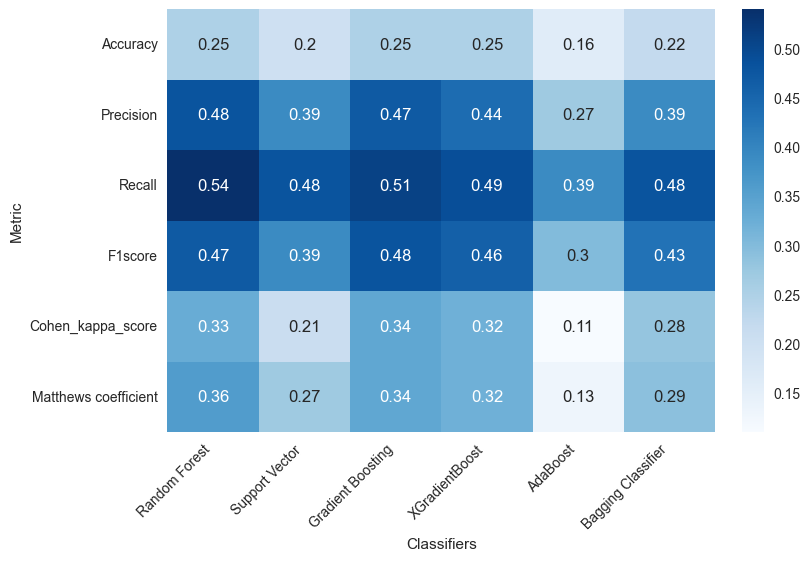

In [4]:
import pandas as pd #3D
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, matthews_corrcoef
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
df = df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
            'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC','Pass','GPAM', 'GPA'], axis=1)
X = df.iloc[:, 0:11]
y = df['GPAA']  # Assuming 'GPAAA' is the column name for the target variable
label_encoder = LabelEncoder()
label_encoder.fit(y)
y_encoded = label_encoder.transform(y)
labels = label_encoder.classes_
classes = np.unique(y_encoded)
xtrain, xtest, ytrain, ytest = train_test_split(X, y_encoded, test_size=0.2, random_state=20)
def evaluate(model, xtest, ytest, name):
    ypred = model.predict(xtest)
    accuracy = np.round(balanced_accuracy_score(ytest, ypred), 2)
    precision = np.round(precision_score(ytest, ypred, average='weighted'), 2)
    recall = np.round(recall_score(ytest, ypred, average='weighted'), 2)
    f1score = np.round(f1_score(ytest, ypred, average='weighted'), 2)
    cohenkappa_score = np.round(cohen_kappa_score(ytest, ypred), 2)
    matthews_corrcoef_ = np.round(matthews_corrcoef(ytest, ypred), 2)
    return accuracy, precision, recall, f1score, cohenkappa_score, matthews_corrcoef_
def fit_data(xtrain, ytrain, xtest, ytest):
    ADB = AdaBoostClassifier().fit(xtrain, ytrain)
    XGB = XGBClassifier(num_class=len(classes), eval_metric='mlogloss', use_label_encoder=False).fit(xtrain, ytrain)
    RF = RandomForestClassifier(max_features=0.2).fit(xtrain, ytrain)
    SVM = SVC().fit(xtrain, ytrain)
    BAG = BaggingClassifier().fit(xtrain, ytrain)
    gbc = GradientBoostingClassifier().fit(xtrain, ytrain)
    performance_list = []
    performance_metrics = ['Accuracy', 'Precision', 'Recall', 'F1score', 'Cohen_kappa_score', 'Matthews coefficient']
    indices = []
    model_dict = {'Random Forest': RF, 'Support Vector': SVM, 'Gradient Boosting': gbc,'XGradientBoost': XGB, 'AdaBoost': ADB, 'Bagging Classifier': BAG}
    for name, model in model_dict.items():
        performance = evaluate(model, xtest, ytest, name)
        performance_list.append(performance)
        indices.append(name)
    performance_frame = pd.DataFrame(performance_list, columns=performance_metrics, index=indices)
    return performance_frame
result = fit_data(xtrain, ytrain, xtest, ytest)
result[result['F1score'] >= 0.10]  # Filter based on F1score threshold

plt.rcParams['figure.constrained_layout.use'] = True
sns.heatmap(result.transpose(), annot=True, cmap='Blues')  # Transpose the result DataFrame
plt.xlabel('Classifiers')  # Swap x and y labels
plt.ylabel('Metric')
plt.xticks(rotation=45, ha='right')  # Rotate xticks and align them to the right
plt.show()


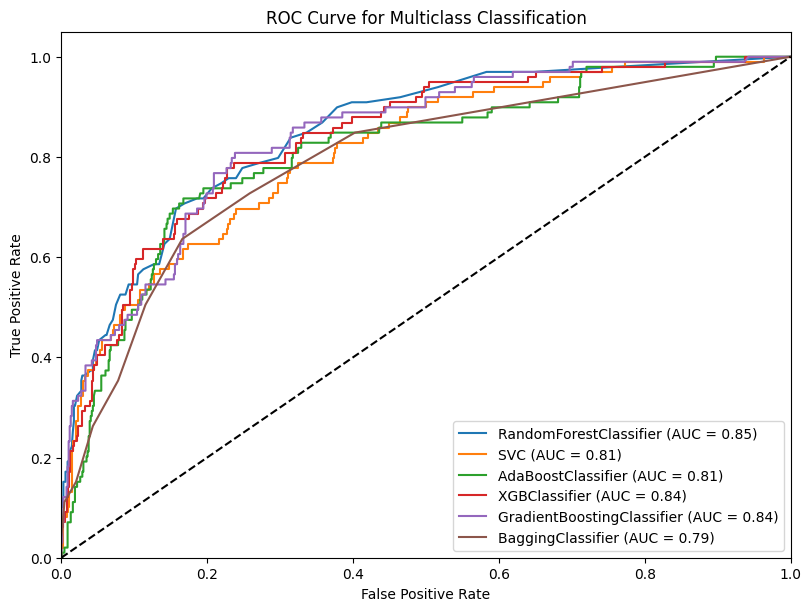


Process time 24.719943523406982 seconds.


In [13]:
from sklearn.datasets import make_classification       #lg2
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn. ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
import matplotlib.pyplot as plt
import numpy as np
import time
start = time.time()
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
    'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
y = label_binarize(y, classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-'])
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
classifiers = [
    RandomForestClassifier(),
    SVC(probability=True),
    AdaBoostClassifier(),
    XGBClassifier(),
    GradientBoostingClassifier(),
    BaggingClassifier()]
plt.figure(figsize=(8, 6))
for classifier in classifiers:
    clf = OneVsRestClassifier(classifier)
    clf.fit(X_train, y_train)
    end = time.time()
    y_score = clf.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.plot(fpr["micro"], tpr["micro"], label=classifier.__class__.__name__+' (AUC = %0.2f)' % roc_auc["micro"])
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))

In [22]:
import pandas as pd #3dRandom GPA
import numpy as np
import plotly.graph_objects as go
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD',
       'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
#rf = RandomForestClassifier(n_estimators= 100,min_samples_split= 10,min_samples_leaf= 2,max_features= 5,criterion= 'entropy')
rf = RandomForestClassifier()
rf.fit(X_train, Y_train)
Y_pred = rf.predict(X_test)
print("normal", Y_pred)
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)
max_features_range = np.arange(1, 6, 1)
n_estimators_range = np.arange(50, 300, 50)
param_grid = dict(max_features=max_features_range, n_estimators=n_estimators_range)
rf = RandomForestClassifier()
grid = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),
                          pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])], axis=1)
grid_contour = grid_results.groupby(['max_features', 'n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'Accuracy']
grid_pivot = grid_reset.pivot('max_features', 'n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
layout = go.Layout(
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text='n_estimators')),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='max_features')))
fig = go.Figure(data=[go.Contour(z=z, x=x, y=y)], layout=layout)
fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500, margin=dict(l=65, r=50, b=65, t=90))
fig.show()
fig = go.Figure(data=[go.Surface(z=z, y=y, x=x)], layout=layout)
fig.update_layout(title='Random Forest Hyperparameter tuning',
                  scene=dict(xaxis_title='n_estimators',
                             yaxis_title='max_features',
                             zaxis_title='Accuracy'),
                  autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

normal [1 1 2 5 1 0 1 1 1 1 1 2 1 1 1 1 0 2 1 1 3 1 4 1 2 3 1 1 1 2 1 2 1 1 1 3 1
 3 1 1 1 4 2 3 1 2 3 0 0 2 2 2 1 1 4 1 2 3 1 1 1 2 1 1 1 1 0 1 1 3 4 1 1 5
 4 3 1 1 3 1 1 1 1 3 2 1 1 1 4 1 1 1 1 0 1 4 1 1 1]
Accuracy: 0.46464646464646464
The best parameters are {'max_features': 4, 'n_estimators': 50} with a score of 0.54


In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsOneClassifier
from sklearn.metrics import accuracy_score

# Read the dataset
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']

# Prepare the data
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD',
             'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
             'GPAM', 'GPA'], axis=1).values

label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Create the Random Forest classifier with best parameters
rf = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=2,
                            min_samples_leaf=1, max_features='auto', bootstrap=True, random_state=0)

# Create the One-vs-One classifier
ovo_rf = OneVsOneClassifier(rf)

# Fit the classifier to the training data
ovo_rf.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred = ovo_rf.predict(X_test)
print("Predictions:", Y_pred)

# Calculate the accuracy
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for 

Predictions: [2 1 2 4 1 0 1 1 0 1 1 5 0 1 1 1 0 4 1 1 3 1 4 1 2 3 1 1 1 2 1 2 1 1 1 3 1
 3 1 1 1 2 2 3 0 2 3 0 3 2 2 3 1 1 4 1 2 3 1 1 1 1 1 1 1 1 0 1 1 3 4 1 1 6
 4 3 1 1 3 1 1 1 0 2 2 1 1 0 4 1 1 1 3 0 1 3 1 1 1]
Accuracy: 0.494949494949495


In [1]:
import pandas as pd #3DRandom OneVOne
import numpy as np
import plotly.graph_objects as go
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.multiclass import OneVsOneClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD',
             'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
             'GPAM', 'GPA'], axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
rf = RandomForestClassifier()
ovo_rf = OneVsOneClassifier(rf)
ovo_rf.fit(X_train, Y_train)
Y_pred = ovo_rf.predict(X_test)
print("normal", Y_pred)
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)
max_features_range = [2, 4]
n_estimators_range = np.arange(50, 300, 50)
param_grid = dict(estimator__max_features=max_features_range, estimator__n_estimators=n_estimators_range)
rf = RandomForestClassifier(random_state=0)
ovo_rf = OneVsOneClassifier(rf)
grid = GridSearchCV(estimator=ovo_rf, param_grid=param_grid, cv=5)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),
                          pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])], axis=1)
grid_contour = grid_results.groupby(['estimator__max_features', 'estimator__n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'Accuracy']
grid_pivot = grid_reset.pivot('max_features', 'n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
layout = go.Layout(
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text='n_estimators')),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='max_features')))
fig = go.Figure(data=[go.Contour(z=z, x=x, y=y)], layout=layout)
fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500, margin=dict(l=65, r=50, b=65, t=90))
fig.show()
fig = go.Figure(data=[go.Surface(z=z, y=y, x=x)], layout=layout)
fig.update_layout(title='Random Forest Hyperparameter tuning',
                  scene=dict(xaxis_title='n_estimators',
                             yaxis_title='max_features',
                             zaxis_title='Accuracy'),
                  autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

<IPython.core.display.Javascript object>

normal [2 1 2 4 1 1 1 1 0 1 1 2 0 1 1 1 0 4 0 1 3 1 4 1 2 3 1 1 1 2 1 2 1 1 1 3 1
 3 1 1 1 2 1 3 0 2 3 0 3 2 2 3 1 1 4 0 1 3 1 1 1 1 1 1 1 1 0 1 1 1 4 1 1 5
 4 3 1 1 3 3 1 1 0 3 2 1 1 0 4 1 1 1 1 0 0 3 1 1 1]
Accuracy: 0.4444444444444444
The best parameters are {'estimator__max_features': 4, 'estimator__n_estimators': 50} with a score of 0.55


In [2]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD',
             'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
             'GPAM', 'GPA'], axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
rf = RandomForestClassifier()
ovr_rf = OneVsRestClassifier(rf)
ovr_rf.fit(X_train, Y_train)
Y_pred = ovr_rf.predict(X_test)
print("normal", Y_pred)
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)
max_features_range = [2, 4]
n_estimators_range = np.arange(50, 300, 50)

param_grid = dict(estimator__max_features=max_features_range, estimator__n_estimators=n_estimators_range)
rf = RandomForestClassifier(random_state=0)
ovr_rf = OneVsRestClassifier(rf)
grid = GridSearchCV(estimator=ovr_rf, param_grid=param_grid, cv=5)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),
                          pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["Accuracy"])], axis=1)
grid_contour = grid_results.groupby(['estimator__max_features', 'estimator__n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'Accuracy']
grid_pivot = grid_reset.pivot('max_features', 'n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
layout = go.Layout(
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text='n_estimators')),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='max_features')))
fig = go.Figure(data=[go.Contour(z=z, x=x, y=y)], layout=layout)
fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500, margin=dict(l=65, r=50, b=65, t=90))
fig.show()
fig = go.Figure(data=[go.Surface(z=z, y=y, x=x)], layout=layout)
fig.update_layout(title='Random Forest Hyperparameter tuning',
                  scene=dict(xaxis_title='n_estimators',
                             yaxis_title='max_features',
                             zaxis_title='Accuracy'),
                  autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

<IPython.core.display.Javascript object>

normal [2 1 2 4 1 0 1 1 1 1 1 2 1 1 1 1 0 2 1 1 3 1 4 1 2 3 1 1 1 2 1 2 1 1 1 3 1
 1 1 1 1 4 2 3 1 4 3 0 3 2 2 3 1 1 4 1 1 3 1 1 1 1 1 1 1 1 0 1 1 3 4 1 1 6
 2 3 1 1 3 1 1 1 0 3 1 1 1 0 4 1 1 1 1 0 1 3 1 1 1]
Accuracy: 0.47474747474747475
The best parameters are {'estimator__max_features': 4, 'estimator__n_estimators': 250} with a score of 0.51


Accuracy of Decision Tree: 0.5121951219512195


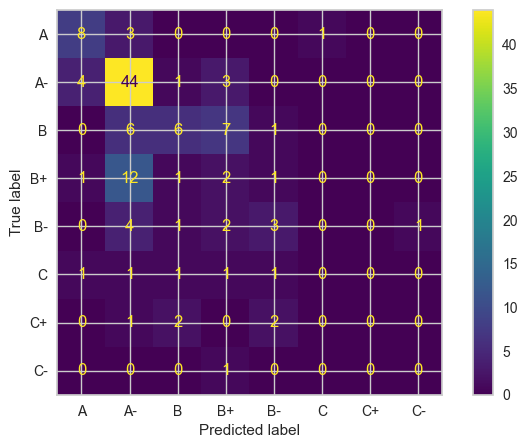

C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           A       0.57      0.67      0.62        12
          A-       0.62      0.85      0.72        52
           B       0.50      0.30      0.37        20
          B+       0.12      0.12      0.12        17
          B-       0.38      0.27      0.32        11
           C       0.00      0.00      0.00         5
          C+       0.00      0.00      0.00         5
          C-       0.00      0.00      0.00         1

    accuracy                           0.51       123
   macro avg       0.27      0.28      0.27       123
weighted avg       0.45      0.51      0.47       123



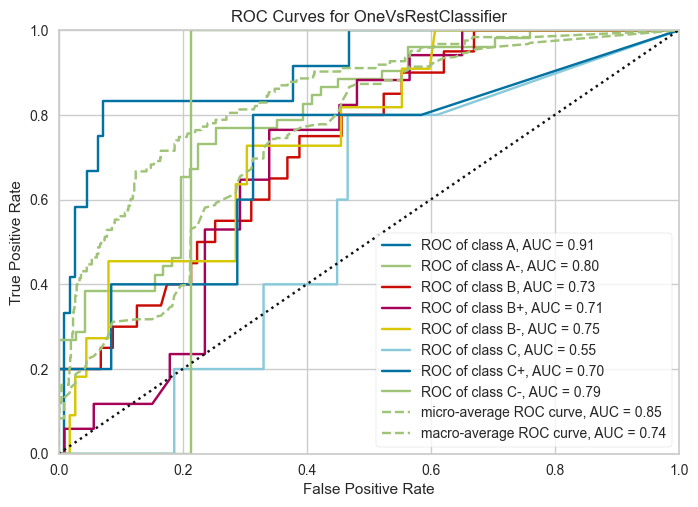

<Axes: title={'center': 'ROC Curves for OneVsRestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [3]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, random_state=0)




dt_score = model.score(x_test, y_test)
print(f"Accuracy of Decision Tree: {dt_score}")

y_pred = model.predict(x_test)

classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']

fig, ax = plt.subplots(figsize=(8, 5))
cmp = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred), display_labels=classes)
cmp.plot(ax=ax)
plt.show()

print(metrics.classification_report(y_test, y_pred))

visualizer = ROCAUC(model)
visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()


[[11  4  0  0  1  0  0  0]
 [ 6 53  0  3  0  0  0  0]
 [ 0  6  9  4  4  0  0  0]
 [ 0 16  2  1  3  0  0  0]
 [ 0  5  1  2  3  0  0  0]
 [ 1  2  1  1  1  1  0  0]
 [ 0  2  2  0  2  0  0  0]
 [ 0  1  0  0  0  0  0  0]]


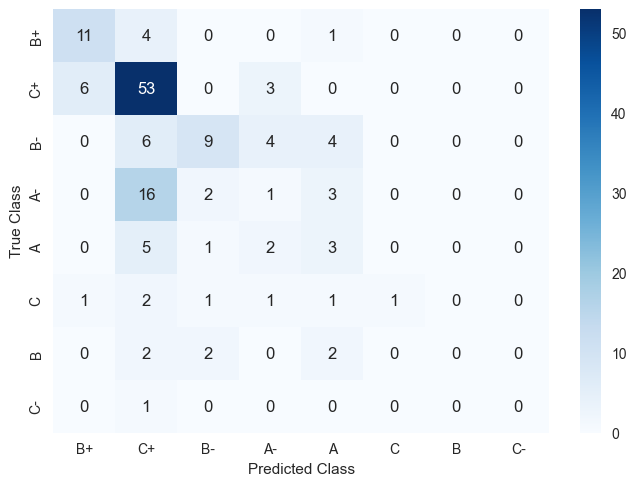

Accuracy of RandomForestClassifier is: 0.527027027027027
              precision    recall  f1-score   support

           A       0.61      0.69      0.65        16
          A-       0.60      0.85      0.70        62
           B       0.60      0.39      0.47        23
          B+       0.09      0.05      0.06        22
          B-       0.21      0.27      0.24        11
           C       1.00      0.14      0.25         7
          C+       0.00      0.00      0.00         6
          C-       0.00      0.00      0.00         1

    accuracy                           0.53       148
   macro avg       0.39      0.30      0.30       148
weighted avg       0.49      0.53      0.48       148



C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross validation score: 0.4255765720922515
X_train shape: (343, 11)
y_test shape: (148,)


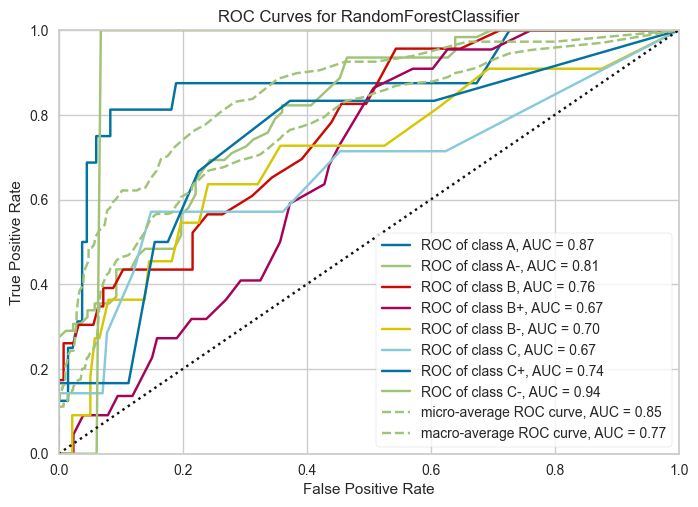

<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics
from yellowbrick.classifier import ROCAUC

df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']

X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.3, random_state=0)

rfc = RandomForestClassifier().fit(X_train, y_train)
y_pred = rfc.predict(X_test)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
print(confusion_matrix)

classes = df['GPAA'].unique()
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

accuracy = rfc.score(X_test, y_test)
print(f"Accuracy of RandomForestClassifier is: {accuracy}")

print(metrics.classification_report(y_test, y_pred))

score = cross_val_score(rfc, X, Y, cv=2)
print("Cross validation score:", score.mean())

print("X_train shape:", X_train.shape)
print("y_test shape:", y_test.shape)

visualizer = ROCAUC(rfc)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()


In [23]:
import pandas as pd #3DSVM
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
svc = SVC(kernel='linear', C=1.2, probability=True)
#svc = SVC() #42.3
svc.fit(X_train, Y_train)
Y_pred = svc.predict(X_test)
print("Normal prediction:", Y_pred)
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)
param_grid = {'C': [0.1, 1, 10], 'gamma': [0.1, 0.01, 0.001]}
grid = GridSearchCV(estimator=SVC(), param_grid=param_grid, cv=5)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
results = grid.cv_results_
grid_results = pd.DataFrame(results["params"])
grid_results['Accuracy'] = results["mean_test_score"]
grid_pivot = grid_results.pivot('C', 'gamma', 'Accuracy')
x = grid_pivot.columns.values
y = grid_pivot.index.values
z = grid_pivot.values
layout = go.Layout(
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text='gamma')),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='C')))
fig_contour = go.Figure(data=[go.Contour(z=z, x=x, y=y)], layout=layout)
fig_contour.update_layout(
    title='SVM Hyperparameter tuning (Contour)',
    autosize=False,
    width=500,
    height=500,
    margin=dict(l=65, r=50, b=65, t=90))
fig_contour.show()
fig_surface = go.Figure(data=[go.Surface(z=z, y=y, x=x)], layout=layout)
fig_surface.update_layout(
    title='SVM Hyperparameter tuning (3D Surface)',
    scene=dict(xaxis_title='gamma',
               yaxis_title='C',
               zaxis_title='Accuracy'),
    autosize=False,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90))
fig_surface.show()

Normal prediction: [1 1 2 4 1 1 1 1 0 1 1 7 1 1 1 1 0 4 1 1 3 1 4 1 3 1 1 1 1 2 1 2 2 1 1 3 1
 1 1 1 1 2 1 2 0 2 1 0 1 1 2 3 1 1 4 1 2 1 1 1 2 1 1 1 1 1 0 1 1 1 4 1 1 6
 4 3 1 1 1 1 1 1 1 2 2 1 1 0 4 1 1 1 1 0 1 3 1 1 1]
Accuracy: 0.4444444444444444
The best parameters are {'C': 1, 'gamma': 0.1} with a score of 0.48


<IPython.core.display.Javascript object>

Accuracy of Decision Tree: 0.43089430894308944


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

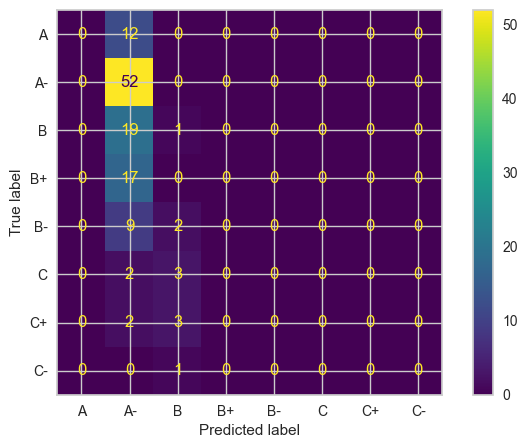

<IPython.core.display.Javascript object>

              precision    recall  f1-score   support

           A       0.00      0.00      0.00        12
          A-       0.46      1.00      0.63        52
           B       0.10      0.05      0.07        20
          B+       0.00      0.00      0.00        17
          B-       0.00      0.00      0.00        11
           C       0.00      0.00      0.00         5
          C+       0.00      0.00      0.00         5
          C-       0.00      0.00      0.00         1

    accuracy                           0.43       123
   macro avg       0.07      0.13      0.09       123
weighted avg       0.21      0.43      0.28       123



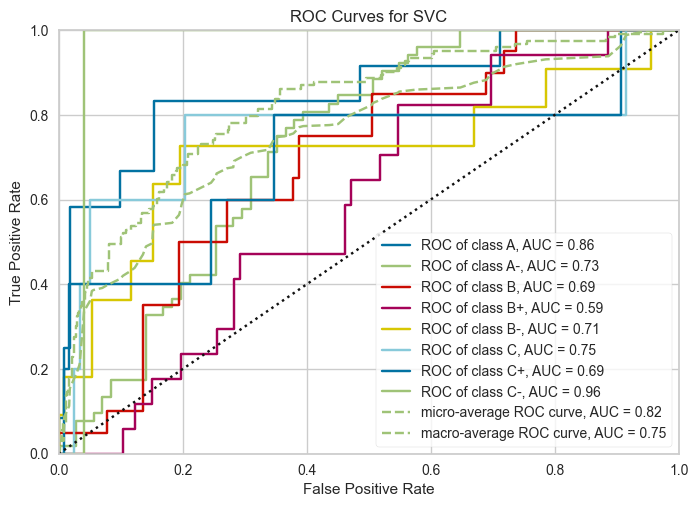

<Axes: title={'center': 'ROC Curves for SVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [3]:
from sklearn.svm import SVC
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo','Parent_Education_SLC','GPAA', 'Pass','GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y,  random_state=0)
model = SVC(C=1,gamma=0.01)
model.fit(x_train, y_train)
dt_score = model.score(x_test, y_test)
print(f"Accuracy of Support vector: {dt_score}")
y_pred = model.predict(x_test)
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
fig, ax = plt.subplots(figsize=(8, 5))
cmp = ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred),display_labels=classes,)
cmp.plot(ax=ax)
plt.show()
print(metrics.classification_report(y_test, y_pred))
visualizer = ROCAUC(model)
visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()

[[ 6 10  0  0  0  0  0  0]
 [ 3 58  0  1  0  0  0  0]
 [ 0 11  6  3  3  0  0  0]
 [ 0 21  1  0  0  0  0  0]
 [ 0  5  1  2  3  0  0  0]
 [ 1  2  2  1  0  0  0  1]
 [ 0  2  1  1  2  0  0  0]
 [ 0  0  1  0  0  0  0  0]]


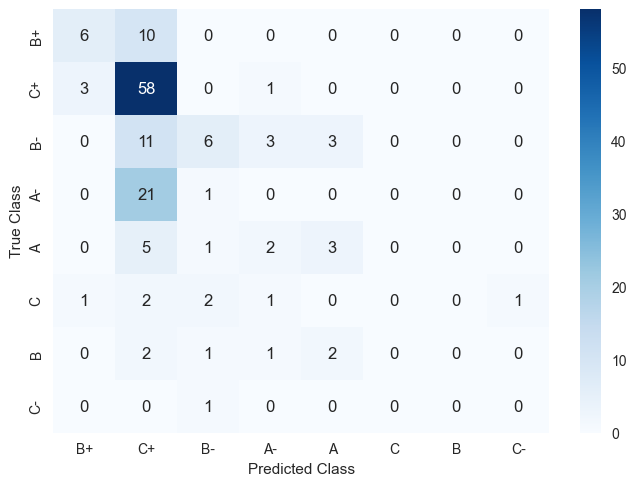

Accuracy of SVM Classifier is: 0.49324324324324326
              precision    recall  f1-score   support

           A       0.60      0.38      0.46        16
          A-       0.53      0.94      0.68        62
           B       0.50      0.26      0.34        23
          B+       0.00      0.00      0.00        22
          B-       0.38      0.27      0.32        11
           C       0.00      0.00      0.00         7
          C+       0.00      0.00      0.00         6
          C-       0.00      0.00      0.00         1

    accuracy                           0.49       148
   macro avg       0.25      0.23      0.22       148
weighted avg       0.39      0.49      0.41       148



C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross validation score: 0.429732868757259
X_train shape: (343, 11)
y_test shape: (148,)


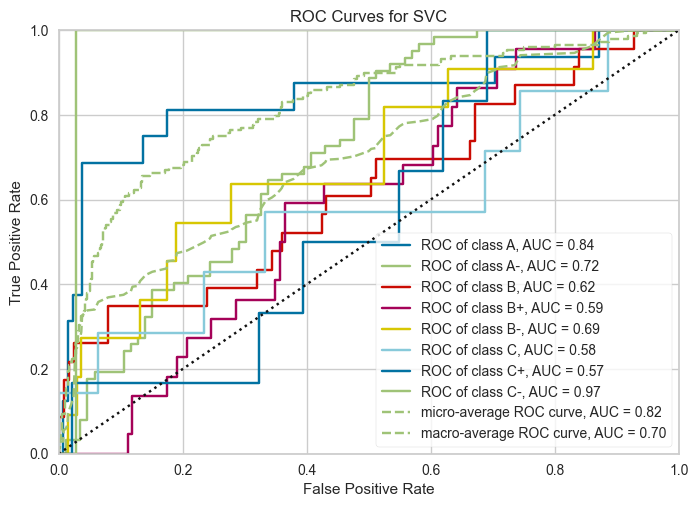

<Axes: title={'center': 'ROC Curves for SVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics
from yellowbrick.classifier import ROCAUC

df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']

X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.3, random_state=0)

svc = SVC().fit(X_train, y_train)
y_pred = svc.predict(X_test)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
print(confusion_matrix)

classes = df['GPAA'].unique()
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

accuracy = svc.score(X_test, y_test)
print(f"Accuracy of SVM Classifier is: {accuracy}")

print(metrics.classification_report(y_test, y_pred))

score = cross_val_score(svc, X, Y, cv=2)
print("Cross validation score:", score.mean())

print("X_train shape:", X_train.shape)
print("y_test shape:", y_test.shape)

visualizer = ROCAUC(svc)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()


[[ 1  6  0  0  0  0  0  2]
 [ 0 42  1  0  0  0  0  4]
 [ 0 10  0  0  0  0  0  2]
 [ 0 10  0  0  0  0  0  5]
 [ 0  7  0  0  0  0  0  1]
 [ 0  1  0  0  0  0  0  1]
 [ 0  2  0  0  0  0  0  1]
 [ 1 29  0  0  0  0  0 17]]


<IPython.core.display.Javascript object>

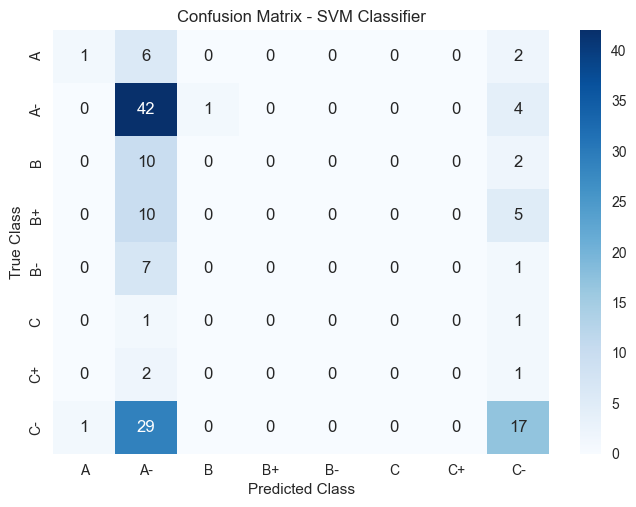

Accuracy of SVM: 0.4195804195804196
              precision    recall  f1-score   support

           A       0.50      0.11      0.18         9
          A-       0.39      0.89      0.55        47
           B       0.00      0.00      0.00        12
          B+       0.00      0.00      0.00        15
          B-       0.00      0.00      0.00         8
          C+       0.00      0.00      0.00         2
          C-       0.00      0.00      0.00         3
           F       0.52      0.36      0.43        47

    accuracy                           0.42       143
   macro avg       0.18      0.17      0.14       143
weighted avg       0.33      0.42      0.33       143

Cross-Validation Scores: [0.29775281 0.28450704]


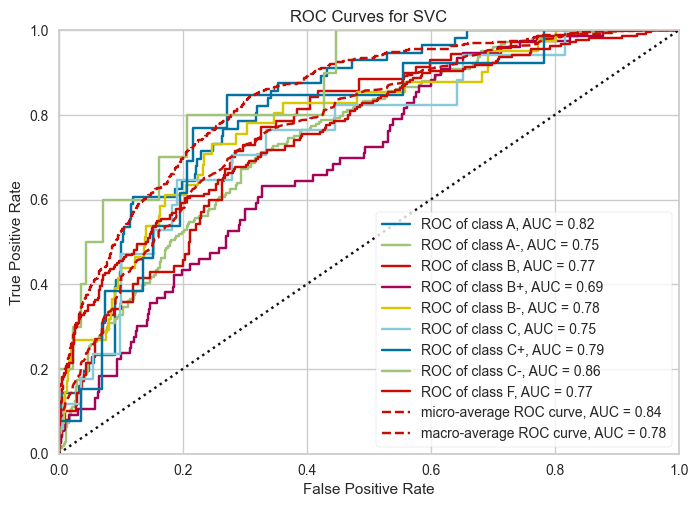

<Axes: title={'center': 'ROC Curves for SVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [24]:
from sklearn import svm
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
import pandas as pd
import matplotlib.pyplot as plt
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
             'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=0)
svm_classifier = svm.SVC(kernel='poly', degree=2).fit(X_train, y_train)
y_pred = svm_classifier.predict(X_test)
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-']
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Confusion Matrix - SVM Classifier")
plt.show()
svm_accuracy = svm_classifier.score(X_test, y_test)
print(f"Accuracy of SVM: {svm_accuracy}")
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)
cross_val_scores = cross_val_score(svm_classifier, x, y, cv=2)
print("Cross-Validation Scores:", cross_val_scores)
visualizer = ROCAUC(svm_classifier)
visualizer.fit(x, y)
visualizer.score(x, y)
visualizer.show()

In [25]:
import pandas as pd    #3DXgb
import numpy as np
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
#xgb = XGBClassifier(max_depth=3, learning_rate=0.1, n_estimators=100)#50
#xgb = XGBClassifier()#44
xgb = XGBClassifier(objective='multi:softmax', num_class=len(np.unique(Y)), eval_metric='mlogloss')#44
xgb.fit(X_train, Y_train)
Y_pred = xgb.predict(X_test)
print("Normal prediction:", Y_pred)
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)
param_grid = {'max_depth': [3, 4, 5], 'n_estimators': [100, 200, 300]}
grid = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
results = grid.cv_results_
grid_results = pd.DataFrame(results["params"])
grid_results['Accuracy'] = results["mean_test_score"]
grid_pivot = grid_results.pivot_table(values='Accuracy', index='max_depth', columns='n_estimators')
x = grid_pivot.columns.values
y = grid_pivot.index.values
z = grid_pivot.values
layout = go.Layout(
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text='n_estimators')),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='max_depth')))
fig_contour = go.Figure(data=[go.Contour(z=z, x=x, y=y)], layout=layout)
fig_contour.update_layout(
    title='XGBoost Hyperparameter tuning (Contour)',
    autosize=False,
    width=500,
    height=500,
    margin=dict(l=65, r=50, b=65, t=90))
fig_contour.show()
fig_surface = go.Figure(data=[go.Surface(z=z, y=y, x=x)], layout=layout)
fig_surface.update_layout(
    title='XGBoost Hyperparameter tuning (3D Surface)',
    scene=dict(
        xaxis_title='n_estimators',
        yaxis_title='max_depth',
        zaxis_title='Accuracy'    ),
    autosize=False,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90))
fig_surface.show()

Normal prediction: [2 1 2 5 1 0 1 1 0 0 1 5 1 1 1 1 0 2 0 1 4 1 4 1 2 3 1 1 1 2 1 2 1 1 3 3 1
 5 1 3 1 4 2 3 0 2 3 1 3 2 2 3 1 1 4 1 2 3 1 1 1 4 1 1 1 1 0 1 1 1 4 1 1 2
 2 3 1 1 3 1 1 1 1 3 5 1 1 1 2 1 1 1 3 0 1 4 1 1 1]
Accuracy: 0.4444444444444444
The best parameters are {'max_depth': 3, 'n_estimators': 200} with a score of 0.50


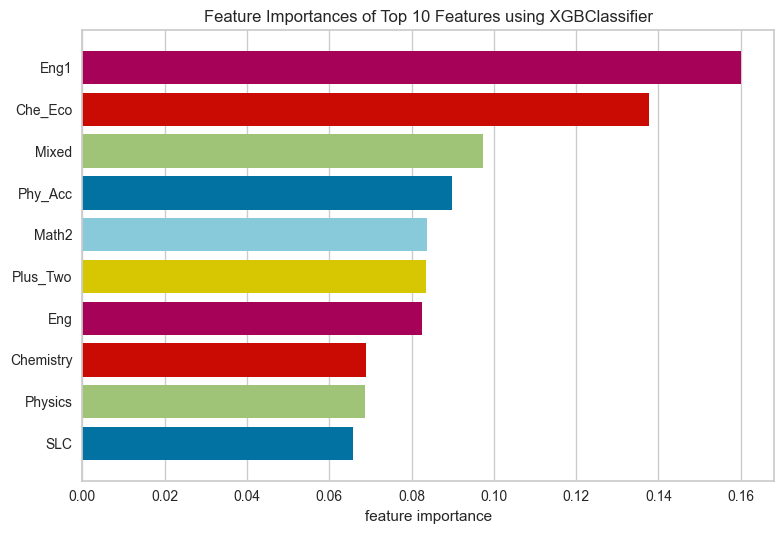

Accuracy score: 0.5365853658536586
[[ 7  7  0  0  0  0  0  0]
 [ 3 44  3  1  1  0  0  0]
 [ 0  7  7  2  2  0  0  0]
 [ 0  9  4  5  0  0  1  0]
 [ 0  4  4  0  2  0  0  0]
 [ 1  1  0  1  0  1  0  0]
 [ 0  1  0  0  2  0  0  0]
 [ 0  2  0  0  0  1  0  0]]
Prediction error: 0.926829268292683
              precision    recall  f1-score   support

           0       0.64      0.50      0.56        14
           1       0.59      0.85      0.69        52
           2       0.39      0.39      0.39        18
           3       0.56      0.26      0.36        19
           4       0.29      0.20      0.24        10
           5       0.50      0.25      0.33         4
           6       0.00      0.00      0.00         3
           7       0.00      0.00      0.00         3

    accuracy                           0.54       123
   macro avg       0.37      0.31      0.32       123
weighted avg       0.50      0.54      0.50       123



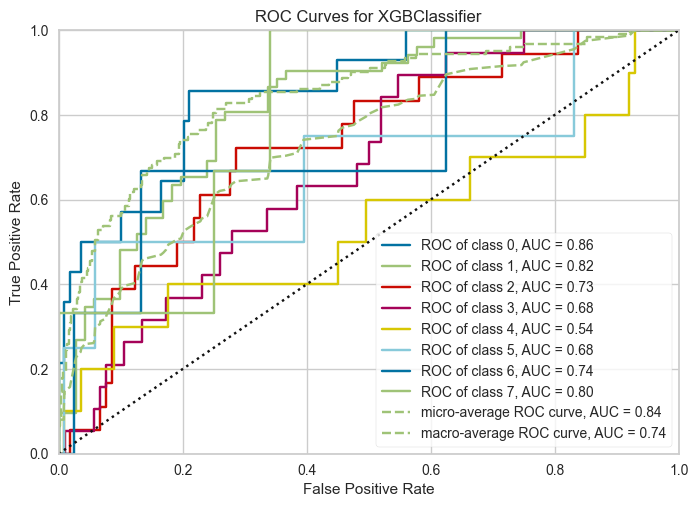

<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [13]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score
from yellowbrick.classifier import ROCAUC
from yellowbrick.model_selection import FeatureImportances
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
              'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
              'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
df["GPAA"] = df["GPAA"].astype("category")
le = LabelEncoder()
label = le.fit_transform(df["GPAA"])
df = df.drop(["GPAA"], axis='columns')
df['GPAA'] = label
y = df['GPAA']
labels = list(x.columns)
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y, stratify=y, random_state=10)
xgb_classifier = xgb.XGBClassifier(n_estimators=100, random_state=1, learning_rate=0.01)
xgb_classifier.fit(x_train, y_train)
viz = FeatureImportances(xgb_classifier, labels=labels, relative=False, topn=10)
viz.fit(x, y)
viz.show()
pred = xgb_classifier.predict(x_test)
accuracy = xgb_classifier.score(x_test, y_test)
print("Accuracy score:", accuracy)
cm = confusion_matrix(y_test, pred)
print(cm)
fp = cm.sum(axis=0) - np.diag(cm)
fn = cm.sum(axis=1) - np.diag(cm)
tp = np.diag(cm)
tn = cm.sum() - (fp + fn + tp)
error = (fp + fn).sum() / cm.sum()
print("Prediction error:", error)
print(classification_report(y_test, pred))
visualizer = ROCAUC(xgb_classifier)
visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()

In [26]:
import pandas as pd #3DGB
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD',
       'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
#gboost = GradientBoostingClassifier(max_depth=3, learning_rate=0.1, n_estimators=100) #50.5
gboost = GradientBoostingClassifier() #51
gboost.fit(X_train, Y_train)
Y_pred = gboost.predict(X_test)
print("Normal prediction:", Y_pred)
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)
param_grid = {'max_depth': [3, 4, 5],  'n_estimators': [100, 200, 300]}
grid = GridSearchCV(estimator=gboost, param_grid=param_grid, cv=5, n_jobs=-1)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
results = grid.cv_results_
grid_results = pd.DataFrame(results["params"])
grid_results['Accuracy'] = results["mean_test_score"]
grid_pivot = grid_results.pivot_table(values='Accuracy', index='max_depth', columns='n_estimators')
x = grid_pivot.columns.values
y = grid_pivot.index.values
z = grid_pivot.values
layout = go.Layout(
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text='n_estimators')),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='max_depth')))
fig_contour = go.Figure(data=[go.Contour(z=z, x=x, y=y)], layout=layout)
fig_contour.update_layout(
    title='Gradient Boosting Hyperparameter Tuning (Contour)',
    autosize=False,
    width=500,
    height=500,
    margin=dict(l=65, r=50, b=65, t=90))
fig_contour.show()
fig_surface = go.Figure(data=[go.Surface(z=z, y=y, x=x)], layout=layout)
fig_surface.update_layout(
    title='Gradient Boosting Hyperparameter Tuning (3D Surface)',
    scene=dict(
        xaxis_title='n_estimators',
        yaxis_title='max_depth',
        zaxis_title='Accuracy'    ),
    autosize=False,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90))
fig_surface.show()

Normal prediction: [2 1 2 4 1 0 1 1 1 0 1 5 1 1 1 1 0 2 1 1 4 1 4 1 2 3 1 1 1 2 1 2 1 1 1 3 1
 1 1 2 1 2 2 3 0 2 3 0 1 2 2 7 1 1 5 1 4 3 1 1 1 1 1 1 1 1 0 1 1 1 2 1 1 5
 4 3 1 1 3 1 1 1 0 3 2 1 1 0 4 1 1 1 1 0 7 4 1 1 1]
Accuracy: 0.5151515151515151
The best parameters are {'max_depth': 3, 'n_estimators': 100} with a score of 0.49


[[10  5  0  0  0  1  0  0]
 [ 5 51  1  5  0  0  0  0]
 [ 0  7  6  6  1  0  0  3]
 [ 3 13  2  3  1  0  0  0]
 [ 0  3  1  1  4  0  2  0]
 [ 1  2  2  0  1  1  0  0]
 [ 0  1  2  1  2  0  0  0]
 [ 0  0  0  1  0  0  0  0]]


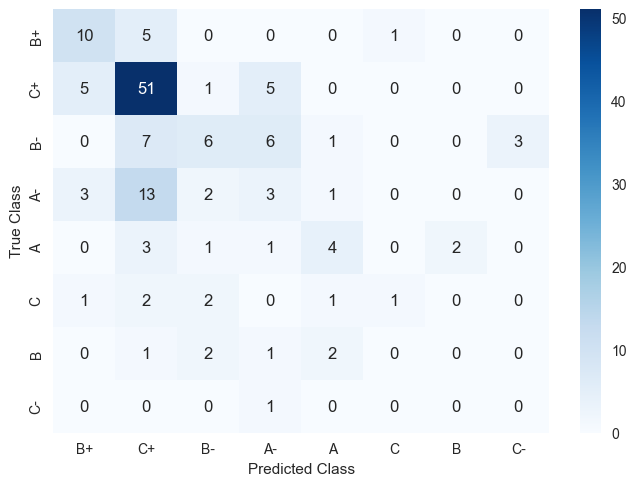

Accuracy of GBC is: 0.5067567567567568
              precision    recall  f1-score   support

           A       0.53      0.62      0.57        16
          A-       0.62      0.82      0.71        62
           B       0.43      0.26      0.32        23
          B+       0.18      0.14      0.15        22
          B-       0.44      0.36      0.40        11
           C       0.50      0.14      0.22         7
          C+       0.00      0.00      0.00         6
          C-       0.00      0.00      0.00         1

    accuracy                           0.51       148
   macro avg       0.34      0.29      0.30       148
weighted avg       0.47      0.51      0.47       148

Cross val 0.3481997677119628
(343, 11)
(148,)


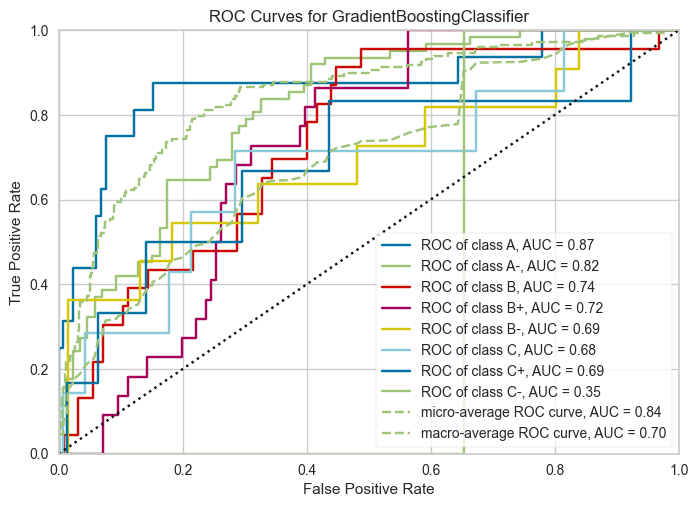

<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [1]:
import pandas as pd     #GB
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn import metrics
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master',
'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.3, random_state=0)
gbc = GradientBoostingClassifier().fit(X_train, y_train)
y_pred = gbc.predict(X_test)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = df['GPAA'].unique()
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()
nn_accuracy = gbc.score(X_test, y_test)
print(f"Accuracy of GBC is: {nn_accuracy}")
print(metrics.classification_report(y_test, y_pred))
score = cross_val_score(gbc, X, Y, cv=2)
print("Cross val", score.mean())
print(X_train.shape)
print(y_test.shape)
visualizer = ROCAUC(gbc)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

In [28]:
import pandas as pd #3DADAboost
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings("ignore")
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
#adaboost=AdaBoostClassifier(n_estimators=200,random_state=1,learning_rate=.01)#.36
adaboost=AdaBoostClassifier(DecisionTreeClassifier(),n_estimators = 100, learning_rate = 1)#39
#adaboost = AdaBoostClassifier()
adaboost.fit(X_train, Y_train)
Y_pred = adaboost.predict(X_test)
print("Normal prediction:", Y_pred)
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)
param_grid = {'n_estimators': [10, 50, 100, 150, 200], 'learning_rate': [0.1, 0.5, 1.0, 1.5, 2.0]}
grid = GridSearchCV(estimator=AdaBoostClassifier(), param_grid=param_grid, cv=5)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
n_estimators_range = np.array(param_grid['n_estimators'])
learning_rate_range = np.array(param_grid['learning_rate'])
n_estimators, learning_rate = np.meshgrid(n_estimators_range, learning_rate_range)
accuracy = np.array(grid.cv_results_['mean_test_score']).reshape(n_estimators.shape)
fig_surface = go.Figure(data=[go.Surface(x=n_estimators, y=learning_rate, z=accuracy)])
fig_surface.update_layout(
    title='AdaBoost Hyperparameter tuning',
    scene=dict(xaxis_title='n_estimators',
               yaxis_title='learning_rate',
               zaxis_title='Accuracy'),
    autosize=False,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90))
fig_surface.show()
fig_contour = go.Figure(data=[go.Contour(z=accuracy, x=n_estimators_range, y=learning_rate_range)])
fig_contour.update_layout(
    title='AdaBoost Hyperparameter tuning (Contour)',
    xaxis=dict(title='n_estimators'),
    yaxis=dict(title='learning_rate'),
    autosize=False,
    width=500,
    height=500,
    margin=dict(l=65, r=50, b=65, t=90))
fig_contour.show()

Normal prediction: [2 1 2 5 3 0 2 1 1 0 1 2 1 1 1 1 0 6 1 1 4 3 2 1 2 3 0 1 1 4 1 2 1 2 3 4 1
 4 1 1 1 4 2 2 0 3 3 1 3 3 2 2 1 1 5 1 1 3 1 1 2 3 1 1 1 3 0 2 4 4 2 1 1 2
 6 3 1 1 3 2 1 1 7 5 4 3 1 2 1 1 2 4 2 0 3 4 1 1 2]
Accuracy: 0.3939393939393939
The best parameters are {'learning_rate': 0.1, 'n_estimators': 100} with a score of 0.47


[[ 0 16  0  0  0  0  0  0]
 [ 0 55  0  6  1  0  0  0]
 [ 0 11  0 11  0  0  1  0]
 [ 0 16  0  4  2  0  0  0]
 [ 0  7  0  1  2  0  0  1]
 [ 0  4  0  2  1  0  0  0]
 [ 0  2  0  0  4  0  0  0]
 [ 0  1  0  0  0  0  0  0]]


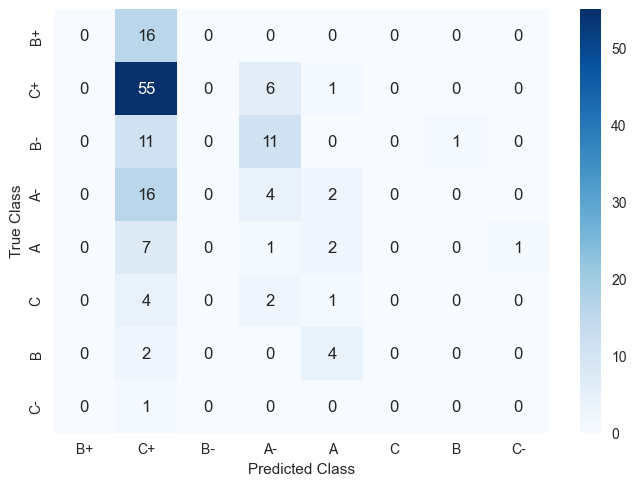

Accuracy of AdaBoost: 0.41216216216216217
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        16
          A-       0.49      0.89      0.63        62
           B       0.00      0.00      0.00        23
          B+       0.17      0.18      0.17        22
          B-       0.20      0.18      0.19        11
           C       0.00      0.00      0.00         7
          C+       0.00      0.00      0.00         6
          C-       0.00      0.00      0.00         1

    accuracy                           0.41       148
   macro avg       0.11      0.16      0.12       148
weighted avg       0.25      0.41      0.30       148



C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross val: 0.3687655550024888
(343, 11)
(148,)


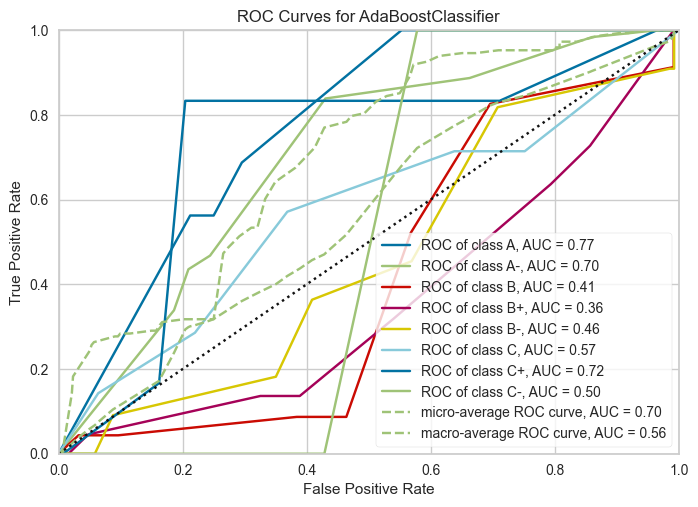

<Axes: title={'center': 'ROC Curves for AdaBoostClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn import metrics
from yellowbrick.classifier import ROCAUC
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master',
'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.3, random_state=0)

ada = AdaBoostClassifier(n_estimators=100)
ada.fit(X_train, y_train)

y_pred = ada.predict(X_test)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = df['GPAA'].unique()
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

ada_accuracy = ada.score(X_test, y_test)
print(f"Accuracy of AdaBoost: {ada_accuracy}")
print(metrics.classification_report(y_test, y_pred))

score = cross_val_score(ada, X, Y, cv=2)
print("Cross val:", score.mean())

print(X_train.shape)
print(y_test.shape)

visualizer = ROCAUC(ada)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()

In [31]:
import pandas as pd #3D Bagging
import numpy as np
import plotly.graph_objects as go
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X=df.drop(['Unnamed: 0','School_From_Govt','School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
Y = df['GPAA'].values
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
bagging = BaggingClassifier(base_estimator=DecisionTreeClassifier(max_features=5, random_state=0), n_estimators=100, max_samples=0.5, max_features=0.5)
#bagging = BaggingClassifier()#48
bagging.fit(X_train, Y_train)
Y_pred = bagging.predict(X_test)
print("Normal prediction:", Y_pred)
acc = accuracy_score(Y_pred, Y_test)
print("Accuracy:", acc)
max_features_range = np.arange(1, 6, 1)
n_estimators_range = np.arange(10, 250, 50)
param_grid = dict(max_features=max_features_range, n_estimators=n_estimators_range)
grid = GridSearchCV(estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(max_features=5, random_state=0)), param_grid=param_grid, cv=5)
grid.fit(X_train, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))
max_features, n_estimators = np.meshgrid(max_features_range, n_estimators_range)
accuracy = np.array(grid.cv_results_['mean_test_score']).reshape(max_features.shape)
fig_contour = go.Figure(data=[go.Contour(z=accuracy, x=n_estimators_range, y=max_features_range)])
fig_contour.update_layout(
    title='Bagging Classifier Hyperparameter tuning (Contour)',
    xaxis=dict(title='n_estimators'),
    yaxis=dict(title='max_features'),
    autosize=False,
    width=500,
    height=500,
    margin=dict(l=65, r=50, b=65, t=90))
fig_contour.show()
fig_surface = go.Figure(data=[go.Surface(x=n_estimators, y=max_features, z=accuracy)])
fig_surface.update_layout(
    title='Bagging Classifier Hyperparameter tuning (3D Surface)',
    scene=dict(xaxis_title='n_estimators',
               yaxis_title='max_features',
               zaxis_title='Accuracy'),
    autosize=False,
    width=800,
    height=800,
    margin=dict(l=65, r=50, b=65, t=90))
fig_surface.show()

Normal prediction: [1 1 2 2 1 0 1 1 1 0 1 2 1 1 1 1 0 2 1 1 3 1 4 1 2 1 1 1 1 1 1 2 1 1 1 3 1
 1 1 3 1 1 2 1 1 2 3 1 1 1 2 4 1 1 4 1 1 1 1 1 3 1 1 1 1 1 0 1 1 1 1 1 1 6
 1 3 1 1 3 1 1 1 0 2 2 1 1 0 4 1 1 1 1 0 1 1 1 1 1]
Accuracy: 0.43434343434343436
The best parameters are {'max_features': 5, 'n_estimators': 60} with a score of 0.52


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


[[11  4  0  0  0  1  0  0]
 [ 5 53  1  3  0  0  0  0]
 [ 0  8  6  5  2  0  0  2]
 [ 2 14  2  1  3  0  0  0]
 [ 0  4  1  2  4  0  0  0]
 [ 1  2  1  1  1  1  0  0]
 [ 0  1  2  0  3  0  0  0]
 [ 0  0  0  1  0  0  0  0]]


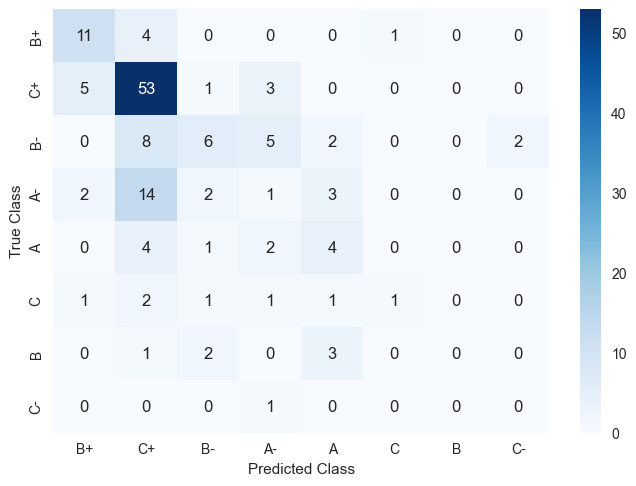

Accuracy of Bagging Classifier: 0.5135135135135135
              precision    recall  f1-score   support

           A       0.58      0.69      0.63        16
          A-       0.62      0.85      0.72        62
           B       0.46      0.26      0.33        23
          B+       0.08      0.05      0.06        22
          B-       0.31      0.36      0.33        11
           C       0.50      0.14      0.22         7
          C+       0.00      0.00      0.00         6
          C-       0.00      0.00      0.00         1

    accuracy                           0.51       148
   macro avg       0.32      0.29      0.29       148
weighted avg       0.45      0.51      0.46       148



C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\lib\site-packages\sklearn\ense

Cross val: 0.39709639953542397
(343, 11)
(148,)


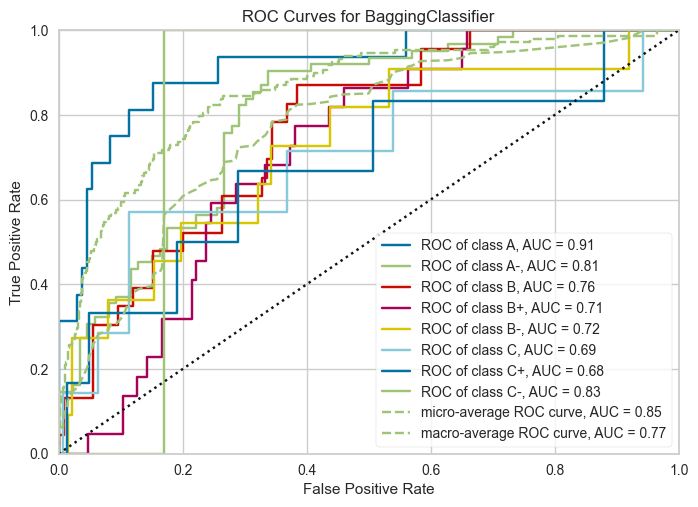

<Axes: title={'center': 'ROC Curves for BaggingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import GradientBoostingClassifier, BaggingClassifier
from sklearn import metrics
from yellowbrick.classifier import ROCAUC

df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']

X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
Y = df['GPAA'].values

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.3, random_state=0)

bagging = BaggingClassifier(base_estimator=GradientBoostingClassifier(), n_estimators=100)
bagging.fit(X_train, y_train)

y_pred = bagging.predict(X_test)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
print(confusion_matrix)
classes = df['GPAA'].unique()
sns.heatmap(confusion_matrix, annot=True, cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

bagging_accuracy = bagging.score(X_test, y_test)
print(f"Accuracy of Bagging Classifier: {bagging_accuracy}")
print(metrics.classification_report(y_test, y_pred))

score = cross_val_score(bagging, X, Y, cv=2)
print("Cross val:", score.mean())

print(X_train.shape)
print(y_test.shape)

visualizer = ROCAUC(bagging)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.show()


In [ ]:
What is ROC curve?
The ROC curve summarizes the prediction performance of a classification model at all classification thresholds. Particularly, the ROC curve plots the False Positive Rate (FPR) on the X-axis and the True Positive Rate (TPR) on the Y-axis.

TPR (Sensitivity)=𝑇𝑃(𝑇𝑃+𝐹𝑁)
 
FPR (1 - Specificity)=𝐹𝑃(𝑇𝑁+𝐹𝑃)

In [ ]:
dataset = pd.read_csv('C:\\Users\\Rimal\\Desktop\\Heart\\diabetes_.csv')
X = dataset.iloc[:, 1:9].values
Y = dataset.iloc[:, 9:10].values
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)

In [ ]:
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
import xgboost as xgb
import numpy as np
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
x=df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['Pass'].values

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=.2,random_state=0)
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from lightgbm import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn. ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import matplotlib.pyplot as plt

In [ ]:
rf = RandomForestClassifier(max_features=5, n_estimators=500)
nb = GaussianNB()
knn=KNeighborsClassifier(n_neighbors=8)
dt=DecisionTreeClassifier()
adb=AdaBoostClassifier(n_estimators=200,random_state=1,learning_rate=.01)
xgc=GradientBoostingClassifier(n_estimators=200,random_state=1,learning_rate=.01)
xgf=xgb.XGBClassifier(n_estimators=200,random_state=1,learning_rate=.01)
svm=svm.SVC(kernel='linear', C=1.2, probability=True)
lr=LogisticRegression()
bag=BaggingClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=100,max_samples=0.8, oob_score=True,random_state=0)
lgb=LGBMClassifier(boosting_type='gbdt')
xt=ExtraTreesClassifier(n_estimators=100, criterion='gini')
lda=LinearDiscriminantAnalysis(solver='svd')

In [ ]:
lgb.fit(X_train,Y_train)
rf.fit(X_train, Y_train)
nb.fit(X_train, Y_train)
knn.fit(X_train,Y_train)
adb.fit(X_train,Y_train)
xgc.fit(X_train,Y_train)
xgf.fit(X_train,Y_train)
dt.fit(X_train,Y_train)
svm.fit(X_train,Y_train)
lr.fit(X_train,Y_train)
bag.fit(X_train,Y_train)
lgb.fit(X_train,Y_train)
xt.fit(X_train,Y_train)
lda.fit(X_train,Y_train)

In [ ]:
r_probs = [0 for _ in range(len(Y_test))]
rf_probs = rf.predict_proba(X_test)
nb_probs = nb.predict_proba(X_test)
knn_probs=knn.predict_proba(X_test)
adb_probs=adb.predict_proba(X_test)
xgc_probs=xgc.predict_proba(X_test)
xgf_probs=xgf.predict_proba(X_test)
dt_probs=dt.predict_proba(X_test)
svm_probs=svm.predict_proba(X_test)
lr_probs=lr.predict_proba(X_test)
bag_probs=bag.predict_proba(X_test)
lgb_probs=lgb.predict_proba(X_test)
xt_probs=xt.predict_proba(X_test)
lda_probs=lda.predict_proba(X_test)

In [ ]:
rf_probs = rf_probs[:,1]
nb_probs = nb_probs[:,1]
knn_probs=knn_probs[:,1]
adb_probs=adb_probs[:,1]
xgc_probs=xgc_probs[:,1]
xgf_probs=xgf_probs[:,1]
dt_probs=dt_probs[:,1]
svm_probs=svm_probs[:,1]
lr_probs=lr_probs[:,1]
bag_probs=bag_probs[:,1]
lgb_probs=lgb_probs[:,1]
xt_probs=xt_probs[:,1]
lda_probs=lda_probs[:,1]

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
r_auc = roc_auc_score(Y_test, r_probs)
rf_auc = roc_auc_score(Y_test, rf_probs)
nb_auc = roc_auc_score(Y_test, nb_probs)
knn_auc = roc_auc_score(Y_test, knn_probs)
adb_auc = roc_auc_score(Y_test, adb_probs)
xgc_auc = roc_auc_score(Y_test, xgc_probs)
xgf_auc = roc_auc_score(Y_test,xgf_probs)
dt_auc = roc_auc_score(Y_test,dt_probs)
svm_auc = roc_auc_score(Y_test,svm_probs)
lr_auc = roc_auc_score(Y_test,lr_probs)
bag_auc = roc_auc_score(Y_test,bag_probs)
lgb_auc = roc_auc_score(Y_test,lgb_probs)
xt_auc = roc_auc_score(Y_test,xt_probs)
lda_auc = roc_auc_score(Y_test,lda_probs)

In [ ]:
print('Random (chance) Prediction: AUROC = %.3f' % (r_auc))
print('Random Forest: AUROC = %.3f' % (rf_auc))
print('Naive Bayes: AUROC = %.3f' % (nb_auc))
print('Knearest: AUROC = %.3f' % (knn_auc))
print('AdaBoost: AUROC = %.3f' % (adb_auc))
print('XgBoost: AUROC = %.3f' % (xgc_auc))
print('XGF: AUROC = %.3f' % (xgf_auc))
print('Decison Tree: AUROC = %.3f' % (dt_auc))
print('Support Vector: AUROC = %.3f' % (svm_auc))
print('Linear Reg: AUROC = %.3f' % (lr_auc))
print('Bagging: AUROC = %.3f' % (bag_auc))
print('LGB Classifi: AUROC = %.3f' % (lgb_auc))
print('ExtraTree: AUROC = %.3f' % (xt_auc))
print('Linear discri: AUROC = %.3f' % (lda_auc))

In [ ]:
_fpr, r_tpr, _ = roc_curve(Y_test, r_probs)
rf_fpr, rf_tpr, _ = roc_curve(Y_test, rf_probs)
xgnb_fpr, xgnb_tpr, _ = roc_curve(Y_test, nb_probs)
nb_fpr, nb_tpr, _ = roc_curve(Y_test, nb_probs)
knb_fpr, knb_tpr, _ = roc_curve(Y_test, knn_probs)
anb_fpr, anb_tpr, _ = roc_curve(Y_test, adb_probs)
xgnb_fpr, xgnb_tpr, _ = roc_curve(Y_test, xgc_probs)
xgfnb_fpr, xgfnb_tpr, _ = roc_curve(Y_test, xgf_probs)
dnb_fpr, dnb_tpr, _ = roc_curve(Y_test, dt_probs)

snb_fpr, snb_tpr, _ = roc_curve(Y_test, svm_probs)
lnb_fpr, lnb_tpr, _ = roc_curve(Y_test, lr_probs)
bnb_fpr, bnb_tpr, _ = roc_curve(Y_test, bag_probs)
lgb_fpr, lgb_tpr, _ = roc_curve(Y_test, lgb_probs)
xnb_fpr, xnb_tpr, _ = roc_curve(Y_test, xt_probs)
lda_fpr, lda_tpr, _ = roc_curve(Y_test, lda_probs)

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)
plt.plot(rf_fpr, rf_tpr, marker='.', label='Random Forest (AUROC = %0.3f)' % rf_auc)
plt.plot(nb_fpr, nb_tpr, marker='.', label='Naive Bayes (AUROC = %0.3f)' % nb_auc)
plt.plot(knb_fpr, knb_tpr, marker='.', label='Knn (AUROC = %0.3f)' % knn_auc)
plt.plot(anb_fpr, anb_tpr, marker='.', label='ADB (AUROC = %0.3f)' % adb_auc)
plt.plot(xgnb_fpr, xgnb_tpr, marker='.', label='XGB (AUROC = %0.3f)' % xgc_auc)
plt.plot(xgfnb_fpr, xgfnb_tpr, marker='.', label='XGF (AUROC = %0.3f)' % xgf_auc)
plt.plot(dnb_fpr, dnb_tpr, marker='.', label='DecisionTree (AUROC = %0.3f)' % dt_auc)
plt.plot(snb_fpr, snb_tpr, marker='.', label='Support Vector (AUROC = %0.3f)' % svm_auc)
plt.plot(lnb_fpr, lnb_tpr, marker='.', label='Linear Regress (AUROC = %0.3f)' % lr_auc)
plt.plot(bnb_fpr, bnb_tpr, marker='.', label='Bagging (AUROC = %0.3f)' % bag_auc)
plt.plot(lgb_fpr, lgb_tpr, marker='.', label='LGB (AUROC = %0.3f)' % lgb_auc)
plt.plot(xnb_fpr, xnb_tpr, marker='.', label='Extra Tree(AUROC = %0.3f)' % xt_auc)
plt.plot(lda_fpr, lda_tpr, marker='.', label='Linear Discri (AUROC = %0.3f)' % lda_auc)
plt.title('ROC Plot')
import matplotlib.pyplot as plt
plt.style.use("ggplot")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend() #
plt.show()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
import xgboost as xgb
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from lightgbm import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn. ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
import warnings
warnings.filterwarnings("ignore")
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv")
X=df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
Y=df['Pass'].values
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.2,random_state=0)
plt.figure(0).clf()
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Logistic Regression, AUC="+str(auc))
model = GradientBoostingClassifier()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Gradient Boosting, AUC="+str(auc))
model = AdaBoostClassifier(n_estimators=200,random_state=1,learning_rate=.01)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Ada a Boosting, AUC="+str(auc))
model = xgb.XGBClassifier(n_estimators=200,random_state=1,learning_rate=.01)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="XGB Boosting, AUC="+str(auc))
model = xgb.XGBClassifier(n_estimators=200,random_state=1,learning_rate=.01)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="XGB Classifiers, AUC="+str(auc))
model = svm.SVC(kernel='linear', C=1.2, probability=True)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="SVM, AUC="+str(auc))
model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Logistic, AUC="+str(auc))
model = BaggingClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=100,max_samples=0.8, oob_score=True,random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Bagging, AUC="+str(auc))
model = LinearDiscriminantAnalysis(solver='svd')
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Linear Disc, AUC="+str(auc))
model =LGBMClassifier(boosting_type='gbdt')
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="GBT, AUC="+str(auc))
model =RandomForestClassifier(n_estimators= 950,min_samples_split= 10,min_samples_leaf= 2,max_features= 'sqrt',
 max_depth= 132,criterion= 'entropy')
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="RandomForest="+str(auc))
plt.legend()

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df.columns

In [ ]:
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
import xgboost as xgb
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from lightgbm import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import LabelEncoder
from sklearn.multiclass import OneVsRestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import auc
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
X = df.drop(['Unnamed: 0', 'School_From_Govt','School_From_Private', 'Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD','Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA'], axis=1).values
y = df['GPAA'].values
y = label_binarize(y, classes = ['A', 'A-', 'B', 'B+', 'B-', 'C', 'C+', 'C-','F'])
n_classes = y.shape[1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
classifiers = [
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    SVC(probability=True),
    AdaBoostClassifier(),
    XGBClassifier(),
    GradientBoostingClassifier(),
    KNeighborsClassifier(),
    LogisticRegression(),
    BaggingClassifier(),
    GradientBoostingClassifier(),
    AdaBoostClassifier(n_estimators=200, random_state=1, learning_rate=0.01),
    xgb.XGBClassifier(n_estimators=200, random_state=1, learning_rate=0.01),
    LinearDiscriminantAnalysis(solver='svd'),
    LGBMClassifier(boosting_type='gbdt') ]
plt.figure(figsize=(8, 6))
for classifier in classifiers:
    clf = OneVsRestClassifier(classifier)
    clf.fit(X_train, y_train)
    y_score = clf.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.plot(fpr["micro"], tpr["micro"], label=classifier.__class__.__name__+' (AUC = %0.2f)' % roc_auc["micro"])
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiclass Classification')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import roc_curve, roc_auc_score
import pandas as pd
import sklearn
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X = df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['Pass'].values
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=.25,random_state=1234)
classifiers = [LogisticRegression(random_state=1234), 
               GaussianNB(), 
               KNeighborsClassifier(), 
               DecisionTreeClassifier(random_state=1234),
               RandomForestClassifier(random_state=1234),
               svm.SVC(kernel='linear', C=1.2, probability=True),
               xgb.XGBClassifier(n_estimators=200,random_state=1,learning_rate=.01),
               AdaBoostClassifier(n_estimators=200,random_state=1,learning_rate=.01),
               GradientBoostingClassifier()]
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])
for cls in classifiers:
    model = cls.fit(X_train, y_train)
    yproba = model.predict_proba(X_test)[::,1]    
    fpr, tpr, _ = roc_curve(y_test,  yproba)
    auc = roc_auc_score(y_test, yproba)    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
result_table.set_index('classifiers', inplace=True)
fig = plt.figure(figsize=(8,6))
for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))    
plt.plot([0,1], [0,1], color='orange', linestyle='--')
plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("Flase Positive Rate", fontsize=15)
plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)
plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')
plt.show()

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice - Copy.csv")
df.head()

In [ ]:
import seaborn as sns
sns.kdeplot(data=df, x="Physics", hue="GPAAA")

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
plt.subplots(3,3,figsize=(15,15))
for idx, col in enumerate(df.columns):
    ax = plt.subplot(3,3,idx+1)
    ax.yaxis.set_ticklabels([])
    sns.distplot(df.loc[df.Pf==0][col],hist=False,axlabel=False,kde_kws={'linestyle':'-','color':'black','label':"No GPA"})
    sns.distplot(df.loc[df.Pf==1][col],hist=False,axlabel=False,kde_kws={'linestyle':'--','color':'red','label':"GPA"})
    ax.set_title(col)
plt.subplot(3,3,9).set_visible(False)
plt.show()

In [ ]:
sns.kdeplot(
   data=df, x="SLC", hue="GPAAA",
   fill=True, common_norm=False, palette="crest",
   alpha=.5, linewidth=0,)

In [ ]:
# # Ensemble Learning
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn. ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn import tree  
from sklearn import metrics 
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X = df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education', 'Pass'],axis=1).values
label_encoder = LabelEncoder()
df["GPAA"] = label_encoder.fit_transform(df["GPAA"])
y = df['Pass'].values
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=.25,random_state=1234)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)
knn = KNeighborsClassifier(n_neighbors = 7).fit(X_train, y_train)
print("Knn: ",knn.score(X_test,y_test))
model = DecisionTreeClassifier(random_state=0)
model = model.fit(X_train,y_train)
print("Decision Tree Score: ",model.score(X_test,y_test))
rf = RandomForestClassifier(n_estimators=100)
rf = rf.fit(X_train,y_train)
print("Random Forest Score: ",rf.score(X_test,y_test))
bag = BaggingClassifier(DecisionTreeClassifier(), n_estimators = 10)
bag = bag.fit(X_train,y_train)
print("Bagging  Score: ",bag.score(X_test,y_test))
boost = AdaBoostClassifier(DecisionTreeClassifier(),n_estimators = 10, learning_rate = 1)
boost = boost.fit(X_train,y_train)
print("Boosting Score: ",boost.score(X_test,y_test))
lr = LogisticRegression()
dt = DecisionTreeClassifier()
svm = SVC(kernel = 'poly', degree = 2 ,probability=True)
evc = VotingClassifier( estimators= [('lr',lr),('dt',dt),('svm',svm),('knn',knn)], voting = 'hard')
evc = evc.fit(X_train,y_train)
print("LR DT SVM Knn: ",evc.score(X_test,y_test))

In [ ]:
#H20      Installation
pip install requests
pip install tabulate
pip install future
pip uninstall h2o
pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import classification_report
import xgboost as xgb
import numpy as np
import pandas as pd
import h2o

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
df.columns

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
X = df.drop(['GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education'],axis=1)
#df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\Heart.csv")
#df = pd.read_csv('https://raw.githubusercontent.com/kb22/Heart-Disease-Prediction/master/dataset.csv')
df=X
churn_df = h2o.import_file('https://raw.githubusercontent.com/srivatsan88/YouTubeLI/master/dataset/WA_Fn-UseC_-Telco-Customer-Churn.csv')

In [ ]:
import h2o
h2o.init(ip="localhost", port=54321)
churn_df = h2o.H2OFrame(df)

In [ ]:
churn_df.describe()
churn_df.head()

In [ ]:
churn_df["Pass"].table()
churn_df.columns

In [ ]:
churn_train,churn_test,churn_valid = churn_df.split_frame(ratios=[.7, .15])

In [ ]:
y = 'Pass'
x = churn_df.columns
x.remove(y)

In [ ]:
import h2o
from h2o.automl import H2OAutoML
aml = H2OAutoML(max_models =10, seed = 10, exclude_algos = ["StackedEnsemble", "DeepLearning"], verbosity="info", nfolds = 3)
#aml = H2OAutoML(max_runtime_secs = 30, sort_metric = "logloss",exclude_algos = ["DeepLearning", "DRF"])

In [ ]:
aml.train(x = x, y = y, training_frame = churn_train, validation_frame=churn_valid)

In [ ]:
lb = aml.leaderboard

In [ ]:
lb.head()

In [ ]:
churn_pred=aml.leader.predict(churn_test)

In [ ]:
churn_pred.head()

In [ ]:
aml.leader.model_performance(churn_test)

In [ ]:
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])
#se = h2o.get_model([mid for mid in model_ids if "StackedEnsemble_AllModels" in mid][0])
#metalearner = h2o.get_model(se.metalearner()['name'])

In [ ]:
model_ids

In [ ]:
h2o.get_model([mid for mid in model_ids if "GBM" in mid][0])

In [ ]:
h2o.get_model([mid for mid in model_ids if "DRF" in mid][0])


In [ ]:
h2o.get_model([mid for mid in model_ids if "XRT" in mid][0])


In [ ]:
out=h2o.get_model([mid for mid in model_ids if "GLM" in mid][0])
out

In [ ]:
model_ids

In [ ]:
i = 0
while i < len(model_ids):
    out = h2o.get_model(model_ids[i])
    out.varimp_plot()
    i = i + 1    

In [ ]:
df.head()

In [ ]:
#new Stacked Ensembles
#Ensemble machine learning methods use multiple learning algorithms to obtain better predictive performance than the ones that could be obtained from any of the constituent learning algorithms. Many of the popular modern machine learning algorithms are actually ensembles. For example, Random Forest and Gradient Boosting Machine (GBM) are both ensemble learners. Both bagging (e.g., Random Forest) and boosting (e.g., GBM) are methods for ensembling that take a collection of weak learners (e.g., decision tree) and form a single, strong learner
#The current version of AutoML trains and cross-validates the following model: GLMs, a Random Forest, an Extremely-Randomized Forest, a random grid of Gradient Boosting Machines (GBMs), XGBoosts, a random grid of Deep Neural Nets, and a Stacked Ensemble of all the models. If you would like to know more details about the models trained by AutoML, please visit Which models are trained in the AutoML process? under the FAQ of the AutoML Documentation section. To see how H2O AutoML performs compared to other AutoML algorithms, please look at An Open Source AutoML Benchmark


In [ ]:
#heart disease Five model accuracy

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
#df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv')
df = pd.read_csv('https://raw.githubusercontent.com/kb22/Heart-Disease-Prediction/master/dataset.csv')
df.head()
dummy2 = pd.get_dummies(df['sex'], prefix='Sex')
data = pd.concat([df, dummy2], axis = 1)
dummy2 = pd.get_dummies(df['cp'], prefix='Cp')
data = pd.concat([data, dummy2], axis = 1)
dummy2 = pd.get_dummies(df['fbs'], prefix='Fbs')
data = pd.concat([data, dummy2], axis = 1)
dummy2 = pd.get_dummies(df['restecg'], prefix='Restecg')
data = pd.concat([data, dummy2], axis = 1)
dummy2 = pd.get_dummies(df['exang'], prefix='Exang')
data = pd.concat([data, dummy2], axis = 1)
dummy2 = pd.get_dummies(df['slope'], prefix='Slope')
data = pd.concat([data, dummy2], axis = 1)
dummy2 = pd.get_dummies(df['ca'], prefix='Ca')
data = pd.concat([data, dummy2], axis = 1)
dummy2 = pd.get_dummies(df['thal'], prefix='Thal')
data = pd.concat([data, dummy2], axis = 1)
data=data.drop(['sex','cp','fbs','restecg','exang','slope','ca','thal','target'],axis=1)
scaled_features = StandardScaler().fit_transform(data.values)
scaled_features_df = pd.DataFrame(scaled_features, index=data.index, columns=data.columns)
scaled_features_df
dd = pd.read_csv('https://raw.githubusercontent.com/kb22/Heart-Disease-Prediction/master/dataset.csv')
final3=pd.concat([scaled_features_df,df['target']],axis=1)
final3.head()
final3=pd.DataFrame(final3)
final3.head()

In [ ]:
from sklearn.model_selection import train_test_split
X=final3.drop(['target'],axis=1)
Y=final3.target
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, stratify = Y, random_state=3)
print(X.shape, X_train.shape, X_test.shape)
print(Y.shape, Y_train.shape, Y_test.shape)
from sklearn.model_selection import train_test_split
XTrain, XTest, yTrain, yTest = train_test_split(X, Y, test_size=0.3, random_state=0)

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\Hprice.csv")
df=df.drop(['GPAM','pff','Result','Churn'],axis=1)
x=df.drop(['GPAAA'],axis=1).values
y=df['Pf'].values
import matplotlib.pyplot as plt
import os
import seaborn as sns
sns.clustermap(df.corr(),annot=True)

In [ ]:
from matplotlib import pyplot as plt
df.hist()
plt.show()

In [ ]:
import seaborn as sns
plt.subplots(3,3,figsize=(15,15))
for idx, col in enumerate(df.columns):
    ax = plt.subplot(3,3,idx+1)
    ax.yaxis.set_ticklabels([])
    sns.distplot(df.loc[df.Pf==0][col],hist=False,axlabel=False,kde_kws={'linestyle':'-','color':'black','label':"No Diabetes"})
    sns.distplot(df.loc[df.Pf==1][col],hist=False,axlabel=False,kde_kws={'linestyle':'--','color':'black','label':"Diabetes"})
    ax.set_title(col)
plt.subplot(3,3,9).set_visible(False)
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import pandas as pd
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
x = df.drop(['Phy_Acc', 'Che_Eco', 'Mixed', 'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education'], axis=1)
y=df['Pass']
XTrain, XTest, yTrain, yTest = train_test_split(x, y, test_size=0.3, random_state=0)
classifier = LogisticRegression()
classifier.fit(XTrain,yTrain)
yPred = classifier.predict(XTest)
mse = mean_squared_error(yTest,yPred)
r = r2_score(yTest,yPred)
mae = mean_absolute_error(yTest,yPred)
accuracy = accuracy_score(yTest,yPred)
print("Logistic Regression :")
print("Accuracy = ", accuracy)
print("Mean Squared Error:",mse)
print("R score:",r)
print("Mean Absolute Error:",mae)
print(classification_report(yTest,yPred))

In [ ]:
from sklearn.tree import DecisionTreeClassifier as DT  #DT
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
x = df.drop(['Phy_Acc', 'Che_Eco', 'Mixed', 'GPA', 'GPAM', 'GPAA', 'School_From', 'Parent_Education'], axis=1)
y=df['GPAM']
XTrain, XTest, yTrain, yTest = train_test_split(x, y, test_size=0.3, random_state=0)
classifier = DT(criterion='entropy', random_state=0)
classifier.fit(XTrain,yTrain)
yPred = classifier.predict(XTest)
mse = mean_squared_error(yTest,yPred)
r = r2_score(yTest,yPred)
mae = mean_absolute_error(yTest,yPred)
accuracy = accuracy_score(yTest,yPred)
print("Decision Tree Classifier :")
print("Accuracy = ", accuracy)
print("Mean Squared Error:",mse)
print("R score:",r)
print("Mean Absolute Error:",mae)

In [ ]:
from sklearn.linear_model import Perceptron
classifier = Perceptron(tol=1e-3, random_state=0)
classifier.fit(XTrain,yTrain)
yPred = classifier.predict(XTest)
mse = mean_squared_error(yTest,yPred)
r = r2_score(yTest,yPred)
mae = mean_absolute_error(yTest,yPred)
accuracy = accuracy_score(yTest,yPred)
print("Perceptron :")
print("Accuracy = ", accuracy)
print("Mean Squared Error:",mse)
print("R score:",r)
print("Mean Absolute Error:",mae)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=5, p=2, metric='minkowski')
classifier.fit(XTrain,yTrain)
yPred = classifier.predict(XTest)
mse = mean_squared_error(yTest,yPred)
r = r2_score(yTest,yPred)
mae = mean_absolute_error(yTest,yPred)
accuracy = accuracy_score(yTest,yPred)
print("K Nearest Neighbors :")
print("Accuracy = ", accuracy)
print("Mean Squared Error:",mse)
print("R score:",r)
print("Mean Absolute Error:",mae)

In [ ]:
from sklearn.svm import SVC
classifier = SVC(kernel='linear',probability=True,random_state=0)
classifier.fit(XTrain,yTrain)
yPred = classifier.predict(XTest)
mse = mean_squared_error(yTest,yPred)
r = r2_score(yTest,yPred)
mae = mean_absolute_error(yTest,yPred)
accuracy = accuracy_score(yTest,yPred)
print("Support Vector Machine :")
print("Accuracy = ", accuracy)
print("Mean Squared Error:",mse)
print("R score:",r)
print("Mean Absolute Error:",mae)

In [ ]:
from sklearn.ensemble import RandomForestClassifier as RF
classifier = RF(n_estimators=10, criterion='entropy', random_state=0)
classifier.fit(XTrain,yTrain)
yPred = classifier.predict(XTest)
mse = mean_squared_error(yTest,yPred)
r = r2_score(yTest,yPred)
mae = mean_absolute_error(yTest,yPred)
accuracy = accuracy_score(yTest,yPred)
print("Random Forest Classifier :")
print("Accuracy = ", accuracy)
print("Mean Squared Error:",mse)
print("R score:",r)
print("Mean Absolute Error:",mae)

In [ ]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(XTrain,yTrain)
yPred = classifier.predict(XTest)
mse = mean_squared_error(yTest,yPred)
r = r2_score(yTest,yPred)
mae = mean_absolute_error(yTest,yPred)
accuracy = accuracy_score(yTest,yPred)
print("Gaussian Naive Bayes :")
print("Accuracy = ", accuracy)
print("Mean Squared Error:",mse)
print("R score:",r)
print("Mean Absolute Error:",mae)

In [ ]:
final3.head()

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice1 - Copy.csv")
df.head()

In [ ]:
X = df.iloc[:, 0:6].values
y = df.iloc[:, 11:12].values
X,y

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from sklearn.preprocessing import LabelEncoder
labelencoder_X_1 = LabelEncoder()
y = labelencoder_X_1.fit_transform(y)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = 0)
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
classifier = Sequential()
classifier.add(Dense(activation='relu',
                     kernel_initializer='uniform',
                     input_dim=6,
                     units=12))
classifier.add(Dense(activation='relu',
                     kernel_initializer='uniform',
                     units=12))
classifier.add(Dense(activation='sigmoid',
                     kernel_initializer='uniform',
                     units=1))
classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
print(classifier.summary())
print(X_test.shape)
print(X_train.shape)
print(y_train.shape)
print(y_test.shape)
history = classifier.fit(X_train, y_train, batch_size=5, epochs=20, verbose=1)
from matplotlib import pyplot as plt
plt.plot(history.history['accuracy'],'green')
plt.plot(history.history['loss'],'red')
plt.title('Model Accuracy-Loss')
plt.xlabel('Epoch')
plt.legend(['Accuracy','Loss'])
plt.show()
yPred = classifier.predict(X_test)
yPred = (yPred>0.5) #Since output is probability
mse = mean_squared_error(y_test,yPred)
r = r2_score(y_test,yPred)
mae = mean_absolute_error(y_test,yPred)
accuracy = accuracy_score(y_test,yPred)
print("Artificial Neural Network Classifier :")
print("Accuracy = ", accuracy)
print("Mean Squared Error:",mse)
print("R score:",r)
print("Mean Absolute Error:",mae)

In [ ]:
from prettytable import PrettyTable
table = PrettyTable()
table.field_names = ["Model","Accuracy", "Mean Squared Error", "R² score","Mean Absolute Error"]
models = [
    LogisticRegression(),
    KNeighborsClassifier(n_neighbors=5, p=2, metric='minkowski'),
    SVC(kernel='linear',probability=True,random_state=0),
    GaussianNB(),
    DT(criterion='entropy', random_state=0),
    RF(n_estimators=10, criterion='entropy', random_state=0),
    Perceptron(tol=1e-3, random_state=0)]
for model in models:
    model.fit(XTrain, yTrain)
    yPred = model.predict(XTest)
    accuracy = accuracy_score(yTest,yPred)
    mse = mean_squared_error(yTest,yPred)
    r = r2_score(yTest,yPred)
    mae = mean_absolute_error(yTest,yPred)
    table.add_row([type(model).__name__, format(accuracy, '.3f'),format(mse, '.3f'),format(r, '.3f'),format(mae, '.3f')])
    table.add_row(["Artificial Neural Network Classifier",0.34 ,0.065,-1.62,0.045])
    print(table)

In [ ]:
import h2o
import matplotlib as plt
%matplotlib inline
from h2o.automl import H2OAutoML

In [ ]:
import os
import h2o
startup  = '/home/h2o/bin/aquarium_startup'
shutdown = '/home/h2o/bin/aquarium_stop'
if os.path.exists(startup):
    os.system(startup)
    local_url = 'http://localhost:54321/h2o'
    aquarium = True
else:
    local_url = 'http://localhost:54321'
    aquarium = False

In [ ]:
h2o.init(url=local_url)

In [ ]:
loan_level = h2o.import_file("https://s3.amazonaws.com/data.h2o.ai/H2O-3-Tutorials/loan_level_50k.csv")

In [ ]:
df=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\Churn.csv")
df.head()

In [ ]:
import pandas as pd
loan_level.head()

In [ ]:
loan_level=h2o.H2OFrame(df)

In [ ]:
loan_level.head()
loan_level.describe()

In [ ]:
loan_level["Churn"].table()

In [ ]:
loan_level["SLC"].hist()

In [ ]:
train, test = loan_level.split_frame([0.8], seed=623)

In [ ]:
print("train:%d test:%d" % (train.nrows, test.nrows))
df.head()

In [ ]:
y = "Churn"
ignore = ["Mixed"] 
x = list(set(train.names) - set(ignore))

In [ ]:
H2OAutoML(nfolds=5, max_runtime_secs=3600, max_models=None, stopping_metric='AUTO', stopping_tolerance=None, stopping_rounds=3, seed=None, project_name=None)

In [ ]:
aml = H2OAutoML(max_models=25, max_runtime_secs_per_model=30, seed=623, project_name='classification', 
                balance_classes=True, class_sampling_factors=[0.5,1.25])
%time aml.train(x=x, y=y, training_frame=train)

In [ ]:
lb = aml.leaderboard
lb.head(rows=lb.nrows)

In [ ]:
from h2o.automl import get_leaderboard
lb2 = get_leaderboard(aml, extra_columns='ALL')
lb2.head(rows=lb2.nrows)

In [ ]:
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])
se = h2o.get_model([mid for mid in model_ids if "StackedEnsemble_BestOfFamily" in mid][0])
metalearner = h2o.get_model(se.metalearner()['name'])
metalearner.coef()

In [ ]:
metalearner.std_coef_plot()

In [ ]:
aml.leader.model_performance(test_data=test)

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
aml.leader.model_performance(test_data=test)
model_performance = aml.leader.model_performance(test_data=test)
model_performance.plot()
plt.show()

In [ ]:
aml.predict(test)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\Churn.csv", encoding='latin1')
df = df[df["GPAM"] != 0]
#df = df.drop(['Churn'], axis=1)
df.columns

In [ ]:
y_reg = "GPAM"
ignore_reg = ['Churn']
x_reg = list(set(train.names) - set(ignore_reg))

In [ ]:
aml = H2OAutoML(max_runtime_secs=900, 
                max_runtime_secs_per_model=30, 
                seed=623, 
                project_name='regression', 
                stopping_metric="RMSE", 
                sort_metric="RMSE")
%time 
aml.train(x=x_reg, y=y_reg, training_frame=train)

In [ ]:
lb = aml.leaderboard
lb.head(rows=lb.nrows)

In [ ]:
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])
gbm = h2o.get_model([mid for mid in model_ids if "GBM_3" in mid][0])

In [ ]:
model_ids

In [ ]:
xgb = h2o.get_model([mid for mid in model_ids if "StackedEnsemble" in mid][0])

In [ ]:
print("ntrees = ", gbm.params['ntrees'])
print("max depth = ", gbm.params['max_depth'])
print("learn rate = ", gbm.params['learn_rate'])
print("sample rate = ", gbm.params['sample_rate'])

In [ ]:
gbm

In [ ]:
gbm.model_performance(test_data=test)

In [ ]:
aml.leader.model_performance(test_data=test)

In [ ]:
pred = gbm.predict(test)
pred = pred.cbind(test['GPAM'])
pred.head()

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
aml.leader.model_performance(test_data=test)

In [ ]:
model_performance = aml.leader.model_performance(test_data=test)

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
aml.leader.model_performance(test_data=test)
model_performance = aml.leader.model_performance(test_data=test)
model_performance.plot()
plt.show()

In [ ]:
import h2o
from h2o.automl import H2OAutoML
h2o.init()
train = h2o.import_file("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed1.csv")
test = h2o.import_file("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed2.csv")
x = train.columns
y = "Pass"
x.remove(y)
train[y] = train[y].asfactor()
test[y] = test[y].asfactor()
aml = H2OAutoML(max_models=20, seed=1)
aml.train(x=x, y=y, training_frame=train)
lb = aml.leaderboard
lb.head(rows=lb.nrows)  # Print all rows instead of default (10 rows)

In [ ]:
import h2o
h2o.init()
train = h2o.import_file("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed1.csv")
test = h2o.import_file("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed2.csv")

In [ ]:
aml.leader

In [ ]:
train.head()

In [ ]:
preds = aml.predict(test)
preds 
pred = preds.cbind(test['Pass'])
pred.head()

In [ ]:
lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
lb

In [ ]:
lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")
lb

In [ ]:
m = h2o.get_model("GLM_1_AutoML_3_20230524_85932")
m

In [ ]:
log = aml.event_log
info = aml.training_info
info

In [ ]:
#sweetviz
import pandas as pd
import sweetviz
import h2o
train = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed1.csv")
test = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed2.csv")

In [ ]:
my_report = sweetviz.analyze([train, "train"],target_feat='Pass')

In [ ]:
my_report = sweetviz.analyze([train, "Train"], target_feat='Pass')
my_report.show_html("report.html")

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
df.columns

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
import numpy as np
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
       'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass',
       'GPAM', 'GPA'], axis=1)
y = df['Pass']
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2, stratify=y, random_state=3)
names = ["Logistic Regression", "Nearest Neighbors", "Linear SVM", "RBF SVM",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost", "Naive Bayes", "QDA"]
classifiers = [
    LogisticRegression(random_state=43, max_iter=1000, n_jobs=-1),
    KNeighborsClassifier(),
    SVC(kernel="linear", C=0.025, probability=True),
    SVC(gamma=2, C=1, probability=True),
    DecisionTreeClassifier(max_depth=5, random_state=43),
    RandomForestClassifier(max_depth=5, random_state=43),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]
def safe_exp(x):
    x_max = np.max(x)
    exp_values = np.exp(x - x_max)
    return exp_values / np.sum(exp_values)
for clf, name in zip(classifiers, names):
    clf.fit(X_train, Y_train)
    score = clf.score(X_test, Y_test)
    try:
        probabilities = clf.predict_proba(X_test)
        probabilities = safe_exp(probabilities)  # Apply numerically stable exponential function
    except FloatingPointError:
        probabilities = np.zeros_like(probabilities)
    print(f"Accuracy of {name} Classifier is: {score}")

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
lr_model = LogisticRegression(random_state=43, max_iter=1000, n_jobs=-1)
lr_model.fit(X_train_scaled, Y_train)
lr_accuracy = lr_model.score(X_test_scaled, Y_test)
print(f"Accuracy of Logistic Regression Classifier is:{lr_accuracy}")

In [ ]:
import matplotlib.pyplot as plt
from yellowbrick.features import FeatureImportances
from yellowbrick.classifier import ConfusionMatrix, ClassificationReport, ROCAUC
from sklearn.linear_model import LogisticRegression
fig, axes = plot.subplots(2, 2)
model = LogisticRegression()
visualgrid = [
    FeatureImportances(ax=axes[0][0]),
    ConfusionMatrix(model, ax=axes[0][1]),
    ClassificationReport(model, ax=axes[1][0]),
    ROCAUC(model, ax=axes[1][1]),]
for viz in visualgrid:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)
    viz.finalize()
plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
knn_model.fit(X_train_scaled, Y_train)
knn_accuracy = knn_model.score(X_test_scaled, Y_test)
print(f"Accuracy of kNN Classifier is:{knn_accuracy}")

In [ ]:
from sklearn import svm
svm_model = svm.SVC(random_state=43, kernel='linear')
svm_model.fit(X_train_scaled, Y_train)
svm_accuracy = svm_model.score(X_test_scaled, Y_test)
print(f"Accuracy of Linear SVM Classifier is:{svm_accuracy}")

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
y_true = Y_test
y_pred_prob =knn_model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
roc_auc = roc_auc_score(y_true, y_pred_prob)
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curve')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn import svm
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GridSearchCV
import numpy as np
C_range = np.logspace(-1, 5, 5)
gamma_range = np.logspace(-2, 3, 5)
param_grid = dict(gamma=gamma_range, C=C_range)
cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=43)
grid = GridSearchCV(SVC(), param_grid=param_grid, cv=cv)#takes more time so
grid.fit(X_train_scaled, Y_train)
print("The best parameters are %s with a score of %0.2f" % (grid.best_params_, grid.best_score_))

In [ ]:
rbf_svm_model = svm.SVC(gamma=0.01, C=3200)
rbf_svm_model.fit(X_train_scaled, Y_train)
rbf_svm_accuracy = rbf_svm_model.score(X_test_scaled, Y_test)
print(f"Accuracy of RBF SVM Classifier is:{rbf_svm_accuracy}")

In [ ]:
import numpy as np
from yellowbrick.model_selection import ValidationCurve
from sklearn.svm import SVC
pr = np.logspace(-6,-1,5)
model = ValidationCurve(SVC(), param_name="gamma", param_range=pr)
model.fit(X, y)
model.show()

In [ ]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
kernel = 1.0 * RBF(1.0)
gpc_model = GaussianProcessClassifier(kernel, random_state=43, max_iter_predict=1000, n_jobs=-1)
gpc_model.fit(X_train_scaled, Y_train)
gpc_accuracy = gpc_model.score(X_test_scaled, Y_test)
print(f"Accuracy of Gaussian Process Classifier is:{gpc_accuracy}")

In [ ]:
from sklearn import tree  #DT
import pydotplus
from PIL import Image
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1)
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=.2, random_state=0)
dt = DecisionTreeClassifier(criterion = 'gini', random_state = 50)
dt.fit(X_train, y_train)
dt.score(X_test, y_test)
grid_params = {
    'max_depth': [1,2,3,4,5,6],
    'min_samples_leaf': [0.02,0.04, 0.06, 0.08]}
grid_object = GridSearchCV(estimator = dt, param_grid = grid_params, scoring = 'accuracy', cv = 5, n_jobs = -1)
grid_object.fit(X_train, y_train)
grid_object.best_params_
from IPython.display import Image
dt = grid_object.best_estimator_
dt = DecisionTreeClassifier(criterion = 'gini', random_state = 50, max_depth= 4,min_samples_leaf=0.04)
dt.fit(X, y)
data = tree.export_graphviz(dt, out_file=None, feature_names= np.array(x.columns), proportion= True)
graph = pydotplus.graph_from_dot_data(data) 
Image(graph.create_png())

In [ ]:
from sklearn import tree        #DT
import pydotplus
from PIL import Image
from sklearn.model_selection import GridSearchCV
from IPython.display import Image as DisplayImage
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv", encoding='latin1')
df = df[df["GPAA"] != 'F']
X = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC',
'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).values
y = df['GPAA'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=0)
dt = DecisionTreeClassifier(criterion='gini', random_state=50)
dt.fit(X_train, y_train)
dt_score = dt.score(X_test, y_test)
print(f"Accuracy of Decision Tree: {dt_score}")
grid_params = {
    'max_depth': [1, 2, 3, 4, 5, 6],
    'min_samples_leaf': [0.02, 0.04, 0.06, 0.08]}
grid_object = GridSearchCV(estimator=dt, param_grid=grid_params, scoring='accuracy', cv=5, n_jobs=-1)
grid_object.fit(X_train, y_train)
best_params = grid_object.best_params_
print(f"Best parameters: {best_params}")
dt = grid_object.best_estimator_
dt = DecisionTreeClassifier(criterion='gini', random_state=50, max_depth=4, min_samples_leaf=0.04)
dt.fit(X, y)
data = tree.export_graphviz(dt, out_file=None, feature_names=np.array(df.drop(['Unnamed: 0', 'School_From_Govt',
'School_From_Private', 'Parent_Education_Bachelor', 'Parent_Education_Master', 'Parent_Education_PHD',
'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'Pass', 'GPAM', 'GPA'], axis=1).columns), proportion=True)
graph = pydotplus.graph_from_dot_data(data)
DisplayImage(graph.create_png())

In [ ]:
tree_model = tree.DecisionTreeClassifier( criterion = 'gini', random_state = 50, max_depth= 4,min_samples_leaf=0.04)
tree_model.fit(X_train, y_train)
tree_accuracy = tree_model.score(X_test, y_test)
print(f"Accuracy of Decision Tree Classifier is:{tree_accuracy}")

In [ ]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier(max_depth=4, n_estimators=300, max_features=2, random_state=43, n_jobs=-1)
rf_model.fit(X_train_scaled, Y_train)
rf_accuracy = rf_model.score(X_test_scaled, Y_test)
print(f"Accuracy of Random Forest Classifier is:{rf_accuracy}")

In [ ]:
from yellowbrick.datasets import load_credit
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.classifier import classification_report
X, y = load_credit()
visualizer = classification_report(
    RandomForestClassifier(n_estimators=10), X, y)

In [ ]:
import time
from sklearn.ensemble import RandomForestClassifier
#rf_classifier=RandomForestClassifier(n_estimators=10)
rf_classifier=RandomForestClassifier()
start = time.time()
rf_classifier.fit(X_train_scaled,Y_train)
end = time.time()
cal_time = end - start
print("\nProcess time {} seconds.".format(cal_time))
prediction=rf_classifier.predict(X_test_scaled)
prediction

In [ ]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
import seaborn as sns
cm=confusion_matrix(Y_test,prediction)
print(accuracy_score(Y_test,prediction))
print(classification_report(Y_test,prediction))
import scikitplot as skplt
import matplotlib.pyplot as plt
from scikitplot.estimators import plot_feature_importances
from scikitplot.metrics import plot_confusion_matrix, plot_roc
skplt.metrics.plot_confusion_matrix(Y_test,prediction, normalize=True)
plt.show()

In [ ]:
from sklearn import metrics
import matplotlib.pyplot as plt
y_pred_proba = rf_classifier.predict_proba(X_test_scaled)[::,1]
fpr, tpr, _ = metrics.roc_curve(Y_test,  y_pred_proba)
auc = metrics.roc_auc_score(Y_test, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot
lr_probs = rf_classifier.predict_proba(X_test_scaled)
ns_probs = [0 for _ in range(len(Y_test))]
lr_probs = lr_probs[:, 1]
ns_auc = roc_auc_score(Y_test, ns_probs)
lr_auc = roc_auc_score(Y_test, lr_probs)
print('HStudent Result: ROC AUC=%.3f' % (ns_auc))
print('Random Forest: AUC=%.3f' % (lr_auc))
ns_fpr, ns_tpr, _ = roc_curve(Y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(Y_test, lr_probs)
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='Student Result')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Random Forest')
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.legend()
pyplot.show()

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import keras
from keras.models import Sequential
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [int(x) for x in np.linspace(start = 50, stop = 800, num = 5)]
max_features = ['auto', 'sqrt','log2']
max_depth = [int(x) for x in np.linspace(10, 500,5)]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4,6]
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
              'criterion':['entropy','gini']}
print(random_grid)

In [ ]:
rf=RandomForestClassifier(n_estimators= 100,min_samples_split= 10,min_samples_leaf= 2,max_features= 'sqrt', max_depth= 132,criterion= 'entropy')
rf_randomcv=RandomizedSearchCV(estimator=rf,param_distributions=random_grid,n_iter=50,cv=5,verbose=2,random_state=100,n_jobs=-1)
start = time.time()
rf_randomcv.fit(X_train_scaled,Y_train)
end = time.time()
cal_time = end - start
print("\nProcess took {} seconds.".format(cal_time))

In [ ]:
rf_randomcv.best_params_

In [ ]:
best_random_grid=rf_randomcv.best_estimator_
best_random_grid

In [ ]:
rff=RandomForestClassifier(n_estimators= 237,min_samples_split= 10,max_features= 'auto', max_depth= 10,criterion= 'entropy')
start = time.time()
rff.fit(X_train_scaled,Y_train)
end = time.time()
cal_time = end - start
print("\nProcess took {} seconds.".format(cal_time))

In [ ]:
from sklearn.metrics import accuracy_score
y_pred=rff.predict(X_test_scaled)
print(confusion_matrix(Y_test,y_pred))
print("Accuracy Score {}".format(accuracy_score(Y_test,y_pred)))
print("Classification report: {}".format(classification_report(Y_test,y_pred)))

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot
lr_probs = rff.predict_proba(X_test_scaled)
ns_probs = [0 for _ in range(len(Y_test))]
lr_probs = lr_probs[:, 1]
ns_auc = roc_auc_score(Y_test, ns_probs)
lr_auc = roc_auc_score(Y_test, lr_probs)
print('Heart Disease: ROC AUC=%.3f' % (ns_auc))
print('Random Forest: ROC AUC=%.3f' % (lr_auc))
ns_fpr, ns_tpr, _ = roc_curve(Y_test, ns_probs)
lr_fpr, lr_tpr, _ = roc_curve(Y_test, lr_probs)
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='Heart Disease')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Random Forest')
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
pyplot.legend()
pyplot.show()

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'criterion': [rf_randomcv.best_params_['criterion']],
    'max_depth': [rf_randomcv.best_params_['max_depth']],
    'max_features': [rf_randomcv.best_params_['max_features']],
    'min_samples_leaf': [rf_randomcv.best_params_['min_samples_leaf'], 
                         rf_randomcv.best_params_['min_samples_leaf']+2, 
                         rf_randomcv.best_params_['min_samples_leaf'] + 4],
    'min_samples_split': [rf_randomcv.best_params_['min_samples_split'], 
                          rf_randomcv.best_params_['min_samples_split'] +1,
                          rf_randomcv.best_params_['min_samples_split'] + 2,
                          rf_randomcv.best_params_['min_samples_split'] + 4 ],
    'n_estimators': [rf_randomcv.best_params_['n_estimators'] - 199, rf_randomcv.best_params_['n_estimators'] - 100, 
                     rf_randomcv.best_params_['n_estimators'], 
                     rf_randomcv.best_params_['n_estimators'] + 100, rf_randomcv.best_params_['n_estimators'] + 200]
}
print(param_grid)

In [ ]:
grid_search=GridSearchCV(estimator=best_random_grid ,param_grid=param_grid,  cv=5,n_jobs=-1,verbose=2)

In [ ]:
start = time.time()
grid_search.fit(X_train,Y_train)
end = time.time()
cal_time = end - start
print("\nProcess took {} seconds.".format(cal_time))

In [ ]:
grid_search.best_estimator_

In [ ]:
best_grid=grid_search.best_estimator_

In [ ]:
rfg=RandomForestClassifier(n_estimators= 137,min_samples_split= 10,max_features= 'auto',min_samples_leaf=6, max_depth= 10,criterion= 'entropy')
start = time.time()
rfg.fit(X_train_scaled,Y_train)
end = time.time()
cal_time = end - start
print("\nProcess took {} seconds.".format(cal_time))

In [ ]:
y_pred=rfg.predict(X_test_scaled)
cm=confusion_matrix(Y_test,y_pred)
print(cm)
print("Accuracy Score {}".format(accuracy_score(Y_test,y_pred)))
print("Classification report: {}".format(classification_report(Y_test,y_pred)))

In [ ]:
import scikitplot as skplt
import matplotlib.pyplot as plt
print(cm)
from scikitplot.estimators import plot_feature_importances
from scikitplot.metrics import plot_confusion_matrix, plot_roc
skplt.metrics.plot_confusion_matrix(Y_test,y_pred, normalize=True)
plt.show()

In [ ]:
start = time.time()
nb = best_grid.fit(X_train_scaled, Y_train)
end = time.time()
y_probas = nb.predict_proba(X_test_scaled)
skplt.metrics.plot_roc(Y_test, y_probas)
plt.show()
cal_time = end - start
print("\nProcess took {} seconds.".format(cal_time))

In [ ]:
from sklearn.neural_network import MLPClassifier
nn_model = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(100,), random_state=43, max_iter=1000, learning_rate='adaptive')
nn_model.fit(X_train_scaled, Y_train)
nn_accuracy = nn_model.score(X_test_scaled, Y_test)
print(f"Accuracy of MLP Classifier is:{nn_accuracy}")

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
ada_model = AdaBoostClassifier(random_state=43, n_estimators=100)
ada_model.fit(X_train_scaled, Y_train)
ada_accuracy = ada_model.score(X_test, Y_test)
print(f"Accuracy of Ada Boost Classifier is:{ada_accuracy}")

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb_model = GaussianNB()
gnb_model.fit(X_train_scaled, Y_train)
gnb_accuracy = gnb_model.score(X_test, Y_test)
print(f"Accuracy of Gaussian Naive Bayes Classifier is:{gnb_accuracy}")

In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
qda_model = QuadraticDiscriminantAnalysis()
qda_model.fit(X_train_scaled, Y_train)
qda_accuracy = qda_model.score(X_test_scaled, Y_test)
print(f"Accuracy of Quadratic Discriminant Analysis Classifier is:{qda_accuracy}")

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 9))
plt.title("Correlation Graph")
cmap = sns.diverging_palette( 1000, 120, as_cmap=True)
sns.heatmap(df.corr(), annot=True, fmt='.1%',  linewidths=.05, cmap=cmap);

In [ ]:
import pandas as pd
data=pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\homeprice - Copy.csv")
data.head()

In [ ]:
import matplotlib.pyplot as plt
data['Res'].value_counts().plot(kind="pie", autopct="%.2f")
plt.show()
plt.hist(data['GPAM'], bins=5)
plt.show()

In [ ]:
data.dtypes

In [ ]:
import seaborn as sns
#data['GPAAA']=data['GPAAA'].astype("category")
sns.distplot(data["GPAAA"]) 
plt.show()

In [ ]:
sns.barplot(data['Pf'], data['SLC'], hue = data["Churn"])
plt.show()

In [ ]:
#lime Shape
!pip install shap
!pip install lime
!pip install eli5

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools
import hypopt
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, roc_auc_score
from eli5 import explain_weights, explain_prediction
import eli5
from eli5.sklearn import PermutationImportance
import lime
import lime.lime_tabular
import shap

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
X = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private','Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['Pass']
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=.25, random_state=1234)
column_labels = itertools.product(["SLC", "Plus", "Physics", "Bio", "Chemistry", "Math","GPAM"],     ["mean","std","max"])
column_labels

In [ ]:
from sklearn.tree import DecisionTreeClassifier
Dt = DecisionTreeClassifier(max_depth=4,  min_samples_leaf=20)
Dt.fit(X, y)

In [ ]:
import matplotlib.pyplot as plt
model = RandomForestClassifier(max_depth=4, random_state=42)
model.fit(X_train, y_train)
y_predict = model.predict(X_test)
y_prob = [probs[1] for probs in model.predict_proba(X_test)]
model.fit(X, y)
importances = model.feature_importances_
std = np.std([tree.feature_importances_ for tree in model.estimators_],axis=0)
indices = np.argsort(importances)
plt.figure()
plt.title("Feature importances")
plt.barh(range(X.shape[1]), importances[indices], color="r", xerr=std[indices], align="center")
plt.yticks(range(X.shape[1]), indices)
plt.ylim([-1, X.shape[1]])
plt.show()

In [ ]:
import matplotlib.pyplot as plt
print(f"Test accuracy: {accuracy_score(y_test, y_predict).round(2)}")
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
plt.rcParams['figure.figsize'] = (8,8)
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("Diagnosing Breast Cancer")
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Feature importance dataframe
imp_df = pd.DataFrame({'feature': X_train.columns.values,
                       'importance': model.feature_importances_})
ordered_df = imp_df.sort_values(by='importance')
imp_range=range(1,len(imp_df.index)+1)
height = ordered_df['importance']
bars = ordered_df['feature']
y_pos = np.arange(len(bars))
plt.barh(y_pos, height)
plt.yticks(y_pos, bars)
plt.xlabel("Mean reduction in tree impurity in random forest")
plt.tight_layout()
plt.show()

In [ ]:
import lime
import lime.lime_tabular
dt = DecisionTreeClassifier(
    random_state=42, max_depth=3
)
dt.fit(X_train, y_train)

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),  feature_names=X.columns, mode="classification")
exp=explainer.explain_instance(X_test.iloc[0],dt.predict_proba)
exp.show_in_notebook(show_table=True)

In [ ]:
X_explain = X_test
explainer = lime.lime_tabular.LimeTabularExplainer(training_data=X_train.values,
                                                   feature_names=X_train.columns.values,
                                                   discretize_continuous=True,
                                                   class_names=["True", "False"],
                                                   mode="classification",
                                                   verbose=True, random_state=42)

In [ ]:
exp = explainer.explain_instance(X_explain.values[1,:],model.predict_proba, num_features=5)

In [ ]:
plt = exp.as_pyplot_figure()
plt.tight_layout()
exp.show_in_notebook(show_table=True)

In [ ]:
eli5.show_weights(dt)

In [ ]:
from IPython.display import display
display(eli5.show_weights(dt))
display(eli5.show_weights(model))

In [ ]:
import shap

In [ ]:
explainer = shap.TreeExplainer(model) 
shap_values = explainer.shap_values(X_explain)
shap.initjs() #initialize javascript in cell
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], X_explain.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X_explain)

In [ ]:
shap.summary_plot(shap_values[1], X_explain)

In [ ]:
shap.summary_plot(shap_values[1], X_explain, plot_type="violin")

In [ ]:
import pandas as pd
import numpy as np
import shap
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_tr30.csv")
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['Pass'].values
feature_names = x.columns.tolist()
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2, random_state=0)
def print_accuracy(f):
    accuracy = 100 * np.mean(f(X_test) == Y_test)
    print("Accuracy = {0:.2f}%".format(accuracy))
shap.initjs()
knn = KNeighborsClassifier()
knn.fit(X_train, Y_train)
print_accuracy(knn.predict)
explainer = shap.KernelExplainer(knn.predict_proba, shap.kmeans(X_train, 50))
shap_values_single = explainer.shap_values(X_test.iloc[0])

In [ ]:
shap.force_plot(explainer.expected_value[1], shap_values_single[1], X_test.iloc[0], feature_names=feature_names)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[1], shap_values[1][0], X_test, feature_names=feature_names)

In [ ]:
import pandas as pd
import numpy as np
import shap
import time
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_tr30.csv")
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['GPAM'].values
feature_names = x.columns.tolist()  # Store the feature names
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2, random_state=0)
def print_accuracy(f):
    accuracy = 100 * np.mean(f(X_test) == Y_test)
    print("Accuracy = {0:.2f}%".format(accuracy))
    time.sleep(0.5)  # to let the print get out before any progress bars
shap.initjs()
dt = DecisionTreeClassifier()
dt.fit(X_train, Y_train)
print_accuracy(dt.predict)
explainer = shap.TreeExplainer(dt)
shap_values = explainer.shap_values(X_test.iloc[0])

In [ ]:
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test.iloc[0], feature_names=feature_names)


In [ ]:
shap_values = explainer.shap_values(X_test)
shap_values

In [ ]:
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test, feature_names=feature_names)

In [ ]:
svc_linear = sklearn.svm.SVC(kernel='linear', probability=True)
svc_linear.fit(X_train, Y_train)
print_accuracy(svc_linear.predict)
explainer = shap.KernelExplainer(svc_linear.predict_proba, shap.kmeans(X_train, 50))
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test, feature_names=feature_names)

In [ ]:
svc_linear = sklearn.svm.SVC(kernel='rbf', probability=True)
svc_linear.fit(X_train, Y_train)
print_accuracy(svc_linear.predict)
explainer = shap.KernelExplainer(svc_linear.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

In [ ]:
import pandas as pd
import numpy as np
import shap
import time
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_tr30.csv")
df = df[df["GPAA"] != 'F']
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['GPAM'].values
feature_names = x.columns.tolist()  # Store the feature names
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2, random_state=0)
def print_accuracy(f):
    accuracy = 100 * np.mean(f(X_test) == Y_test)
    print("Accuracy = {0:.2f}%".format(accuracy))
    time.sleep(0.5)  # to let the print get out before any progress bars
shap.initjs()
dt = DecisionTreeClassifier()
dt.fit(X_train, Y_train)
print_accuracy(dt.predict)
explainer = shap.TreeExplainer(dt)

In [ ]:
shap_values = explainer.shap_values(X_test.iloc[1])

In [ ]:
shap.summary_plot(shap_values, x)

In [ ]:
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test, feature_names=feature_names)

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_tr30.csv")
df.columns

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import shap

# Load the dataset
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_tr30.csv")
df = df[df["GPAA"] != 'F']

# Define the features and target variable
features = ['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two', 'Eng1', 'Math2']  # Replace with the actual feature column names
target = 'GPAM'  # Replace with the actual target variable column name

X = df[features]
y = df[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the decision tree classifier
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Calculate the accuracy of the model
accuracy = (y_pred == y_test).mean()
print("Accuracy:", accuracy)

# Initialize the Shap explainer
explainer = shap.Explainer(clf, X_train)

# Calculate Shapley values for the test set
shap_values = explainer(X_test)

# Plot the Shapley summary plot
shap.summary_plot(shap_values, X_test)

# Plot the Shapley dependence plot for a specific feature
feature_name = 'SLC'  # Replace with the actual feature name
shap.dependence_plot(feature_name, shap_values.values, X_test)

# Interpret a single prediction using Shapley values
index = 0  # Index of the prediction to interpret
shap.force_plot(explainer.expected_value, shap_values.values[index], X_test.iloc[index])


In [ ]:
explainer = shap.KernelExplainer(dtree.predict_proba, X_train)

In [ ]:
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

In [ ]:
from sklearn.neural_network import MLPClassifier
nn = MLPClassifier(solver='lbfgs', alpha=1e-1, hidden_layer_sizes=(5, 2), random_state=0)
nn.fit(X_train, Y_train)
print_accuracy(nn.predict)
explainer = shap.KernelExplainer(nn.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rforest = RandomForestClassifier(n_estimators=100, max_depth=None, min_samples_split=2, random_state=0)
rforest.fit(X_train, Y_train)
print_accuracy(rforest.predict)
explainer = shap.KernelExplainer(rforest.predict_proba, X_train)
shap_values = explainer.shap_values(X_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], X_test)

In [ ]:
Classification & Regression with Trees
Decision Tree Classifier
Random Forest Classifier
AdaBoost Classifier
Decision Tree Regressor
Random Forest Regressor
Gradient Boosted Trees Regressor
Ensemble Classifier

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import GridSearchCV
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import tree
from six import StringIO

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private','Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['GPAM'].values
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, stratify = y, random_state=3)

In [ ]:
dt = DecisionTreeClassifier(criterion = 'gini', random_state = 50)
dt.fit(X_train, y_train)
dt.score(X_test, y_test)

In [ ]:
grid_params = {
    'max_depth': [1,2,3,4,5,6],
    'min_samples_leaf': [0.02,0.04, 0.06, 0.08]}
grid_object = GridSearchCV(estimator = dt, param_grid = grid_params, scoring = 'accuracy', cv = 5, n_jobs = -1)
grid_object.fit(X_train, y_train)

In [ ]:
grid_object.best_params_

In [ ]:
dt = grid_object.best_estimator_

In [ ]:
dt = DecisionTreeClassifier(criterion = 'gini', random_state = 50, max_depth= 4, min_samples_leaf=0.06)
dt.fit(x, y)

In [ ]:
data = tree.export_graphviz(dt, out_file=None, feature_names= np.array(x.columns), proportion= True)
graph = pydotplus.graph_from_dot_data(data)
Image(graph.create_png())

In [ ]:
rf_classifier = RandomForestClassifier(random_state = 50)
rf_classifier.fit(X_train, y_train)
rf_classifier.score(X_test, y_test)

In [ ]:
grid_params = {
    'n_estimators': [50,200,500],
    'max_depth': [1,2,3],
    'min_samples_leaf': [0.05, 0.1, 0.2]}
grid_object = GridSearchCV(estimator = rf_classifier, param_grid = grid_params, scoring = 'accuracy', cv = 3, n_jobs = -1)
grid_object.fit(X_train, y_train)

In [ ]:
grid_object.best_params_

In [ ]:
rf_best = grid_object.best_estimator_

In [ ]:
ada_boost = AdaBoostClassifier(base_estimator = dt, n_estimators=100)
ada_boost.fit(X_train, y_train)

In [ ]:
ada_boost.score(X_test, y_test)

In [ ]:
grid_params = {
    'n_estimators': [50,200,300]}
grid_object = GridSearchCV(estimator = ada_boost, param_grid = grid_params, scoring = 'accuracy', cv = 3, n_jobs = -1)

In [ ]:
grid_object.fit(X_train, y_train)

In [ ]:
grid_object.best_params_
ada_best = grid_object.best_estimator_

In [ ]:
dt_reg = DecisionTreeRegressor(max_depth = 10, min_samples_leaf = 0.2, random_state= 50)

In [ ]:
dt_reg.fit(X_train, y_train)

In [ ]:
data = tree.export_graphviz(dt_reg, out_file=None, feature_names= np.array(x.columns), proportion= True)
graph = pydotplus.graph_from_dot_data(data)
Image(graph.create_png())

In [ ]:
rf_reg = RandomForestRegressor(max_depth = 10, min_samples_leaf = 0.2, random_state = 50)
rf_reg.fit(X_train, y_train)

In [ ]:
gb_reg = GradientBoostingRegressor(max_depth = 5, n_estimators = 100, learning_rate = 0.1, random_state = 50)
gb_reg.fit(X_train, y_train)

In [ ]:
dt = DecisionTreeClassifier(criterion = 'gini', random_state = 50)
dt.fit(X_train, y_train)

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private','Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['GPAA'].values
compare_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall'])
def evaluateMulticlassClassification(y_pred, y_true):
    # Calculate the evaluation metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    return {'Accuracy': accuracy, 'Precision': precision, 'Recall': recall}
y_pred_dt = dt.predict(X_test)
metrics_dt = evaluateMulticlassClassification(y_pred_dt, y_test)
compare_df.loc['DT'] = metrics_dt
print(compare_df)

In [ ]:
rf_classifier = RandomForestClassifier(random_state = 50)
rf_classifier.fit(X_train, y_train)

In [ ]:
models = [('Decision Tree', dt), ('Random Forest', rf_classifier)]

In [ ]:
voting_model = VotingClassifier(estimators = models)
voting_model.fit(X_train, y_train)
voting_model.score(X_test, y_test)

In [ ]:
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve, auc, classification_report
import xgboost
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import pdpbox as pdb
from pdpbox import pdp, info_plots
print(f"Pandas Version: {pd.__version__}")
print(f"Numpy Version: {np.__version__}")
print(f"scikit-learn Version: {sklearn.__version__}")
print(f"PDBbox Version: {pdb.__version__}")
print(f"Xgbbost Version: {xgboost.__version__}")

In [ ]:
#data = pd.read_csv("C:\\Users\\Rimal\\Desktop\\Heart\\BankChurners.csv")
data=pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\dff.csv")
data.head()
#data['Pf'].value_counts()
data.columns

In [ ]:
num_cols =['SLC', 'Eng', 'Math', 'Physics', 'Chemistry', 'Plus_Two','Eng1', 'Math2', 'Phy_Acc', 'Che_Eco', 'Mixed']
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(data[num_cols].corr(), vmin=-1, vmax=1, annot=True)

In [ ]:
exclude_feature = ['Unnamed: 0','School From_Govt','School From_Private','Parent Education_Bachelor','Parent Education_Master',
                   'Parent Education_PHD','Parent Education_PlusTwo', 'Parent Education_SLC', 'GPAA','GPA']
target=data['Pass']
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = data.select_dtypes(include=['object']).columns.tolist()
numeric_features = [col for col in numeric_columns if col not in exclude_feature]
categorical_features = [col for col in categorical_columns if col not in exclude_feature]
features = numeric_features + categorical_features
data = data[features]
X_train, X_valid, y_train, y_valid = train_test_split(data, target, test_size=0.15, random_state=10)
for feature in categorical_features:
    le = LabelEncoder()
    le.fit(X_train.loc[:, feature])
    X_train.loc[:, feature] = le.transform(X_train.loc[:, feature])
    X_valid.loc[:, feature] = le.transform(X_valid.loc[:, feature])

In [ ]:
from sklearn.metrics import roc_curve
xgb_clf = XGBClassifier(max_depth = 3, objective='binary:logistic', eval_metric='logloss')
xgb_clf.fit(X_train, y_train)
train_prediction = xgb_clf.predict_proba(X_train)[:, 1]
fpr, tpr, thresholds = roc_curve(y_train, train_prediction)
roc_auc = auc(fpr, tpr) # compute area under the curve
print("=================================")
print(f"Training AUC:{roc_auc}")
val_prediction = xgb_clf.predict_proba(X_valid)[:, 1]
fpr, tpr, thresholds = roc_curve(y_valid, val_prediction)
roc_auc = auc(fpr, tpr) # compute area under the curve
print(f"Validation AUC:{roc_auc}")
print("=================================")

In [ ]:
feature_importance_df = pd.DataFrame()
feature_importance_df["feature"] = X_train.columns
feature_importance_df["importance"] = xgb_clf.feature_importances_
feature_importance_df  = feature_importance_df.sort_values('importance', ascending=False).reset_index()
plt.figure(figsize = (8, 8))
sns.barplot(x ='feature', y ='importance', data= feature_importance_df[:20])

In [ ]:
pdp_total_trans_amt = pdp.pdp_isolate(
    model=xgb_clf, dataset=X_valid, model_features=X_valid.columns, feature='Math')
fig, axes = pdp.pdp_plot(pdp_total_trans_amt, 'Math', 
                         plot_lines=False, center=False, 
                         frac_to_plot=0.5, plot_pts_dist=True,
                         show_percentile=False)

In [ ]:
fig, axes = pdp.pdp_plot(pdp_total_trans_amt, 'Physics',
                         plot_lines=True, center=False, 
                         frac_to_plot=0.5, plot_pts_dist=True, 
                         show_percentile=False)

In [ ]:
pdp_total_trans_ct = pdp.pdp_isolate(
    model=xgb_clf, dataset=X_valid, model_features=X_valid.columns, feature='SLC')
fig, axes = pdp.pdp_plot(pdp_total_trans_ct, 'SLC', 
                         plot_lines=False, center=False, 
                         frac_to_plot=0.5, plot_pts_dist=True,
                         show_percentile=False)

In [ ]:
fig, axes = pdp.pdp_plot(pdp_total_trans_ct, 'SLC',
                         plot_lines=True, center=False, 
                         frac_to_plot=0.5, plot_pts_dist=True, 
                         show_percentile=False)

In [ ]:
features_to_plot = ['Physics', 'SLC']
interaction_1  =  pdp.pdp_interact(model=xgb_clf, dataset=X_valid, model_features=X_valid.columns, features=features_to_plot)
pdp.pdp_interact_plot(pdp_interact_out=interaction_1, feature_names=features_to_plot, plot_type='grid')
plt.show()

In [ ]:
#Shap with regressor
import numpy as np
import pandas as pd
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private','Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['GPAM'].values

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df['GPAM'],df['SLC'])
plt.xlabel('SLC',size=20)
plt.ylabel('GPAM',size=20)

In [ ]:
import seaborn as sns
count=["SLC","Physics","Math","Plus_Two"]
cor_metric=pd.DataFrame(df[count],columns=count).corr()
sns.heatmap(cor_metric,cmap='coolwarm',center=0,annot=True,fmt='.1g')

In [ ]:
import xgboost as xgb
model=xgb.XGBRegressor(objective='reg:squarederror')
model.fit(x,y)

In [ ]:
y_pred=model.predict(x)
plt.figure(figsize=(5,5))
plt.scatter(y,y_pred)
plt.plot([0,30],[0,30],color='r',
         linestyle='-',linewidth=2)
plt.ylabel('Predicated',size=20)
plt.xlabel('Actual',size=20)

In [ ]:
import shap
exp=shap.Explainer(model)
shap_values=exp(x)

In [ ]:
np.shape(shap_values.values[0])

In [ ]:
shap.plots.waterfall(shap_values[0])

In [ ]:
shap.plots.waterfall(shap_values[1],max_display=4)

In [ ]:
import sklearn.ensemble
import shap
shap.initjs()
shap.plots.force(shap_values[0])

In [ ]:
 shap.plots.force(shap_values[0:100])

In [ ]:
shap.plots.bar(shap_values)

In [ ]:
shap.plots.beeswarm(shap_values)

In [ ]:
shap.plots.scatter(shap_values[:,'SLC'])#dependency plot

In [ ]:
shap.plots.scatter(shap_values[:,'SLC'],   color=shap_values[:,'Physics'])

In [ ]:
shap.plots.scatter(shap_values[:,"SLC"])

In [ ]:
#MLP
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
import matplotlib.pyplot as plt
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private','Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['Pass'].values
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.3,random_state=10)#random state=0 every time result same

In [ ]:
df.shape
df['Pass'].unique()

In [ ]:
df.describe(include='all')
df.isnull().sum()

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
mlp = MLPClassifier(solver='adam',batch_size='auto', alpha=1e-5, hidden_layer_sizes=(100,), activation='relu',random_state=43, max_iter=500, learning_rate='adaptive')
mlp.fit(x_train, y_train)
pred=mlp.predict(x_test)
pred

In [ ]:
cm=confusion_matrix(y_test,pred)
print(cm)
nn_accuracy = mlp.score(x_test, y_test)
print(f"Accuracy of MLP Classifier is:{nn_accuracy}")
print(classification_report(y_test,pred))

In [ ]:
print(classification_report(y_test,pred))

In [ ]:
import pyforest as pf

In [ ]:
#MLP TUNING
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from dmba import plotDecisionTree

In [ ]:
def evaluateBinaryClassification(predictions, actuals):
    contigency = pd.crosstab(actuals,predictions)
    TP = contigency[1][1]
    TN = contigency[0][0]
    FP = contigency[1][0]
    FN = contigency[0][1]
    n = contigency.sum().sum()
    Acuracy = (TP + TN)/n
    Recall = TP/(TP+FN)
    Precision = TP/(TP+FP)
    FScore = 2*Recall*Precision/(Recall+Precision)    
    return Acuracy, Recall, Precision, FScore

In [ ]:
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private','Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['Pass']
from sklearn.preprocessing import MinMaxScaler
scaler = preprocessing.StandardScaler()
xx=scaler.fit_transform(x)  # Note the use of an array of column names
X = pd.DataFrame(xx,columns =x.columns)
X.describe()
X.head()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x,y,  test_size=0.3,random_state=1)
print(X_train.shape,X_test.shape,y_train.shape, y_test.shape)

In [ ]:
rf = RandomForestClassifier(n_estimators=1000,random_state=2)
rf.fit(X_train, y_train)
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
df = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance')
print(df)
ax = df.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')
plt.tight_layout()
plt.show()

In [ ]:
select_features=df[df.importance>=0.05].feature
select_features

In [ ]:
knn = KNeighborsClassifier(n_neighbors=1,weights='uniform').fit(X_train[select_features], y_train)
y_predict_knn = knn.predict(X_test[select_features])
pd.crosstab(y_test,y_predict_knn)

In [ ]:
evaluateBinaryClassification(y_predict_knn,y_test)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x,y,  test_size=0.3,random_state=1)
from sklearn.preprocessing import MinMaxScaler #fixed import
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
print(X_train.shape,X_test.shape,y_train.shape, y_test.shape)

In [ ]:
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()
nb.fit(X_train, np.ravel(y_train))
y_predict_nb = nb.predict(X_test)
pd.crosstab(y_test,y_predict_nb)

In [ ]:
evaluateBinaryClassification(y_predict_nb,y_test)

In [ ]:
y_prob = nb.predict_proba(X_test)
summary_df = pd.concat([pd.DataFrame({'actual': y_test, 'predicted': y_predict_nb}),                
             pd.DataFrame(y_prob, index=y_test.index, columns=['No_prob', 'Yes_prob']) ], axis=1)
y_predict_nb = pd.Series(summary_df.Yes_prob > 0.5).replace({False: 'no', True: 'yes'})
summary_df

In [ ]:
Methods = ['Random','KNN','NB','DT']
Metrics = ['Accuracy','Recall','Precision','Fscore']
compare_df = pd.DataFrame(index = Methods, columns = Metrics)
compare_df

In [ ]:
compare_df.loc['KNN'] = evaluateBinaryClassification(y_predict_knn,y_test)
number_Yes =  np.sum(y_predict_knn==1)
y_predict_random = pd.Series(np.random.permutation(len(y_test))<number_Yes)
print(evaluateBinaryClassification(y_predict_random,y_test))
compare_df.loc['Random'] = evaluateBinaryClassification(y_predict_random,y_test)
compare_df.loc['NB'] = evaluateBinaryClassification(y_predict_nb,y_test)
compare_df

In [ ]:
print('Random Method number of yes prediction: {}'.format(np.sum(y_predict_random==1)))
print('KNN Method number of yes prediction: {}'.format(np.sum(y_predict_knn==1)))
print('NB Method number of yes prediction: {}'.format(np.sum(y_predict_nb=='yes')))

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x,y,  test_size=0.3,random_state=1)
print(X_train.shape,X_test.shape,y_train.shape, y_test.shape)

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree #DT
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private','Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['GPAM'].values
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)
DT = DecisionTreeClassifier(criterion='entropy', max_depth=6, min_impurity_decrease=0.005, min_samples_split=16, splitter='best')
DT.fit(X_train, y_train)
plt.figure(figsize=(20, 12))
plot_tree(DT, feature_names=X_train.columns, filled=True)
DT.score(X_test, y_test)
plt.show()

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0','School_From_Govt', 'School_From_Private','Parent_Education_Bachelor','Parent_Education_Master',
             'Parent_Education_PHD', 'Parent_Education_PlusTwo', 'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['GPAA'].values
compare_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall'])
def evaluateMulticlassClassification(y_pred, y_true):
    # Calculate the evaluation metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    return {'Accuracy': accuracy, 'Precision': precision, 'Recall': recall}
y_pred_dt = DT.predict(X_test)
metrics_dt = evaluateMulticlassClassification(y_pred_dt, y_test)
compare_df.loc['DT'] = metrics_dt
print(compare_df)

In [ ]:
print('Random Method number of yes prediction: {}'.format(np.sum(y_predict_random=='yes')))
print('KNN Method number of yes prediction: {}'.format(np.sum(y_predict_knn=='yes')))
print('NB Method number of yes prediction: {}'.format(np.sum(y_predict_nb=='yes')))
print('DT Method number of yes prediction: {}'.format(np.sum(y_predict_dt=='yes')))

In [ ]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(random_state=5)
mlp.fit(X_train, y_train)
y_predict_mlp = mlp.predict(X_test)
compare_df.loc['MLP'] = evaluateBinaryClassification(y_predict_mlp,y_test)
compare_df

In [ ]:
print('Random Method number of yes prediction: {}'.format(np.sum(y_predict_random=='yes')))
print('KNN Method number of yes prediction: {}'.format(np.sum(y_predict_knn=='yes')))
print('NB Method number of yes prediction: {}'.format(np.sum(y_predict_nb=='yes')))
print('DT Method number of yes prediction: {}'.format(np.sum(y_predict_dt=='yes')))
print('MLP Method number of yes prediction: {}'.format(np.sum(y_predict_mlp=='yes')))

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from sklearn.model_selection import ShuffleSplit
cv = ShuffleSplit(n_splits=1, test_size=0.2, random_state=1)
param_grid = {
    'hidden_layer_sizes':[5],
    'activation': ['identity','logistic','tanh','relu'],
    'solver': ['lbfgs','sgd','adam'],
    'learning_rate':['constant','invscaling','adaptive']}
gridSearch = GridSearchCV(MLPClassifier(), param_grid, cv=cv,
                          scoring=['recall','f1'],refit='f1',verbose=2)
gridSearch.fit(X_train, y_train.replace({'yes':1,'no':0}))
print('Score: ', gridSearch.best_score_)
print('Parameters: ', gridSearch.best_params_)

In [ ]:
param_grid = {
    'hidden_layer_sizes':[5,10,15,(5,5),(5,10)],
    'activation': ['relu'],
    'solver': ['adam'],
    'learning_rate':['invscaling']}
gridSearch = GridSearchCV(MLPClassifier(), param_grid, cv=cv,
                          scoring='recall',verbose=2)
gridSearch.fit(X_train, y_train.replace({'yes':1,'no':0}))
print('Score: ', gridSearch.best_score_)
print('Parameters: ', gridSearch.best_params_)

In [ ]:
X_train_s, X_tune, y_train_s, y_tune = train_test_split(X_train, y_train,test_size=0.2)
for i in range(15):
    mlp = MLPClassifier(hidden_layer_sizes=5,activation='relu', learning_rate='invscaling', solver='adam',random_state=i)    
    mlp.fit(X_train_s, y_train_s)
    y_predict_mlp = mlp.predict(X_tune)
    print(i,evaluateBinaryClassification(y_predict_mlp,y_tune))    

In [ ]:
mlp = MLPClassifier(hidden_layer_sizes=5,activation='relu',learning_rate='invscaling', solver='adam', random_state=13)
mlp.fit(X_train_s, y_train_s)
y_predict_mlp = mlp.predict(X_test)
compare_df.loc['MLP'] = evaluateBinaryClassification(y_predict_mlp,y_test)
compare_df

In [ ]:
print('Random Method number of yes prediction: {}'.format(np.sum(y_predict_random=='yes')))
print('KNN Method number of yes prediction: {}'.format(np.sum(y_predict_knn=='yes')))
print('NB Method number of yes prediction: {}'.format(np.sum(y_predict_nb=='yes')))
print('DT Method number of yes prediction: {}'.format(np.sum(y_predict_dt=='yes')))
print('MLP Method number of yes prediction: {}'.format(np.sum(y_predict_mlp=='yes')))

In [ ]:
# XGBoost on Otto dataset, Tune learning_rate and n_estimators
from pandas import read_csv
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
import matplotlib
matplotlib.use('Agg')
from matplotlib import pyplot
import numpy
# load data
data = read_csv('train.csv')
dataset = data.values
# split data into X and y
X = dataset[:,0:94]
y = dataset[:,94]
# encode string class values as integers
label_encoded_y = LabelEncoder().fit_transform(y)
# grid search
model = XGBClassifier()
n_estimators = [100, 200, 300, 400, 500]
learning_rate = [0.0001, 0.001, 0.01, 0.1]
param_grid = dict(learning_rate=learning_rate, n_estimators=n_estimators)
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=7)
grid_search = GridSearchCV(model, param_grid, scoring="neg_log_loss", n_jobs=-1, cv=kfold)
grid_result = grid_search.fit(X, label_encoded_y)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
# plot results
scores = numpy.array(means).reshape(len(learning_rate), len(n_estimators))
for i, value in enumerate(learning_rate):
    pyplot.plot(n_estimators, scores[i], label='learning_rate: ' + str(value))
pyplot.legend()
pyplot.xlabel('n_estimators')
pyplot.ylabel('Log Loss')
pyplot.savefig('n_estimators_vs_learning_rate.png')

In [ ]:
# Plot performance for learning_rate=0.1
from matplotlib import pyplot
n_estimators = [100, 200, 300, 400, 500]
loss = [-0.001239, -0.001153, -0.001152, -0.001153, -0.001153]
pyplot.plot(n_estimators, loss)
pyplot.xlabel('n_estimators')
pyplot.ylabel('Log Loss')
pyplot.title('XGBoost learning_rate=0.1 n_estimators vs Log Loss')
pyplot.show()

In [ ]:
!pip install -q dtreeviz
!pip install -q lightgbm

In [ ]:
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import dtreeviz
random_state = 1234 # get reproducible trees
dataset_url = "https://raw.githubusercontent.com/parrt/dtreeviz/master/data/titanic/titanic.csv"
dataset = pd.read_csv(dataset_url)
# Fill missing values for Age
dataset.fillna({"Age":dataset.Age.mean()}, inplace=True)
# Encode categorical variables
dataset["Sex_label"] = dataset.Sex.astype("category").cat.codes
dataset["Cabin_label"] = dataset.Cabin.astype("category").cat.codes
dataset["Embarked_label"] = dataset.Embarked.astype("category").cat.codes
features = ["Pclass", "Sex_label", "Embarked_label", "Age", "Cabin_label", "Fare"]
target = "Survived"
X_train, X_test, y_train, y_test = train_test_split(dataset[features], dataset[target], test_size=0.2, random_state=42)
train_data = lgb.Dataset(data=X_train, label=y_train, feature_name=features, categorical_feature=["Sex_label", "Pclass"])
valid_data = lgb.Dataset(data=X_test, label=y_test, feature_name=features, categorical_feature=["Sex_label", "Pclass"])
lgbm_params = {
    'boosting': 'dart',          # dart (drop out trees) often performs better
    'application': 'binary',     # Binary classification
    'learning_rate': 0.05,       # Learning rate, controls size of a gradient descent step
    'min_data_in_leaf': 2,      # Data set is quite small so reduce this a bit
    'feature_pre_filter': False,
    'feature_fraction': 0.7,     # Proportion of features in each boost, controls overfitting
    'num_leaves': 41,            # Controls size of tree since LGBM uses leaf wise splits
    'drop_rate': 0.15,
    'max_depth':4,
    "seed":1212}

lgbm_model = lgb.train(lgbm_params, train_data, valid_sets=[train_data, valid_data], verbose_eval=False)
viz_model = dtreeviz.model(lgbm_model, tree_index=1,
                           X_train=dataset[features], y_train=dataset[target],
                           feature_names=features,
                           target_name=target, class_names=["perish", "survive"])
viz_model.view()

In [ ]:
import sys
import os
%config InlineBackend.figure_format = 'retina' # Make visualizations look good
#%config InlineBackend.figure_format = 'svg' 
%matplotlib inline
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import dtreeviz
import lightgbm.plotting as lgbm_plotting
random_state = 1234  # get reproducible trees
dataset = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\33.csv", encoding='latin1')
num_features = ["SLC", "Eng", "Math", "Physics", "Chemistry", "Plus_Two", "Eng1", "Math2",
                "Phy_Acc", "Che_Eco", "Mixed"]
# Encode categorical variables
dataset["GPAAA"] = dataset.GPAA.astype("category").cat.codes
features = ["SLC", "Eng", "Math", "Physics", "Chemistry", "Plus_Two", "Eng1", "Math2", "Phy_Acc", "Che_Eco", "Mixed", "GPAAA"]
target = "GPAAA"
X_train, X_test, y_train, y_test = train_test_split(dataset[features], dataset[target], test_size=0.2, random_state=42)
train_data = lgb.Dataset(data=X_train, label=y_train, feature_name=features)
valid_data = lgb.Dataset(data=X_test, label=y_test, feature_name=features)
lgbm_params = {
    'boosting': 'dart',          # dart (drop out trees) often performs better
    'application': 'binary',     # Binary classification
    'learning_rate': 0.05,       # Learning rate, controls the size of a gradient descent step
    'min_data_in_leaf': 2,       # Data set is quite small so reduce this a bit
    'feature_pre_filter': False,
    'feature_fraction': 0.7,     # Proportion of features in each boost, controls overfitting
    'num_leaves': 41,            # Controls the size of the tree since LGBM uses leaf-wise splits
    'drop_rate': 0.15,
    'max_depth': 4,
    "seed": 1212
}
lgbm_model = lgb.train(lgbm_params, train_data, valid_sets=[train_data, valid_data], verbose_eval=False)
tree_index = 1
lgbm_plotting.plot_tree(lgbm_model, tree_index=tree_index, figsize=(20, 15))
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import plot_tree
def evaluateBinaryClassification(predictions, actuals):
    contingency = pd.crosstab(actuals, predictions)
    TP = contingency[1][1]
    TN = contingency[0][0]
    FP = contingency[1][0]
    FN = contingency[0][1]
    n = contingency.sum().sum()
    Accuracy = (TP + TN) / n
    Recall = TP / (TP + FN)
    Precision = TP / (TP + FP)
    FScore = 2 * Recall * Precision / (Recall + Precision)
    return Accuracy, Recall, Precision, FScore
df = pd.read_csv("C:\\Users\\Rimal\\Desktop\\BE\\df_transformed.csv")
x = df.drop(['Unnamed: 0', 'School_From_Govt', 'School_From_Private', 'Parent_Education_Bachelor',
             'Parent_Education_Master', 'Parent_Education_PHD', 'Parent_Education_PlusTwo',
             'Parent_Education_SLC', 'GPAA', 'GPAM', 'GPA'], axis=1)
y = df['Pass']
scaler = preprocessing.StandardScaler()
xx = scaler.fit_transform(x)
X = pd.DataFrame(xx, columns=x.columns)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_predict_dt = dt.predict(X_test)
contingency_dt = pd.crosstab(y_test, y_predict_dt)
compare_df = pd.DataFrame(index=['KNN', 'Random', 'NB', 'DT'], columns=['Accuracy', 'Recall', 'Precision', 'Fscore'])
compare_df.loc['DT'] = evaluateBinaryClassification(y_predict_dt, y_test)
plt.figure(figsize=(10, 6))
plot_tree(dt, feature_names=X_train.columns, class_names=['No', 'Yes'], filled=True)
plt.show()
rf = RandomForestClassifier(n_estimators=1000, random_state=2)
rf.fit(X_train, y_train)
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
df_importance = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
df_importance = df_importance.sort_values('importance')
ax = df_importance.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')
plt.tight_layout()
plt.show()
knn = KNeighborsClassifier(n_neighbors=1, weights='uniform').fit(X_train, y_train)
y_predict_knn = knn.predict(X_test)
contingency_knn = pd.crosstab(y_test, y_predict_knn)
nb = MultinomialNB()
nb.fit(X_train, np.ravel(y_train))
y_predict_nb = nb.predict(X_test)
contingency_nb = pd.crosstab(y_test, y_predict_nb)
compare_df.loc['KNN'] = evaluateBinaryClassification(y_predict_knn, y_test)
number_Yes = np.sum(y_predict_knn == 1)
y_predict_random = pd.Series(np.random.permutation(len(y_test)) < number_Yes)
compare_df.loc['Random'] = evaluateBinaryClassification(y_predict_random, y_test)
compare_df.loc['NB'] = evaluateBinaryClassification(y_predict_nb, y_test)
print(compare_df)